# Fiducial model exploration

In [1]:
import cogsworth
import astropy.units as u
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import gala.dynamics as gd

In [2]:
import sys
sys.path.append("../src")
import plotting

In [3]:
import h5py as h5

In [4]:
%config InlineBackend.figure_format = 'retina'

pd.options.display.max_columns = 999

plt.rc('font', family='serif')
plt.rcParams['text.usetex'] = False
fs = 24

# update various fontsizes to match
params = {'figure.figsize': (12, 8),
          'legend.fontsize': fs,
          'axes.labelsize': fs,
          'xtick.labelsize': 0.9 * fs,
          'ytick.labelsize': 0.9 * fs,
          'axes.linewidth': 1.1,
          'xtick.major.size': 7,
          'xtick.minor.size': 4,
          'ytick.major.size': 7,
          'ytick.minor.size': 4}
plt.rcParams.update(params)

# Grab the data

In [6]:
p = cogsworth.pop.load("/mnt/home/twagg/ceph/pops/feedback-variations/fiducial.h5")

In [7]:
plotting.set_sn_subpop_masks(p);

679 17143 11422 21970


In [8]:
f = np.load("/mnt/home/twagg/ceph/pops/feedback-variations/sn_positions-fiducial.npz")
p.primary_sn_distances, p.secondary_sn_distances = f["arr_0"] * u.kpc, f["arr_1"] * u.kpc

# Distances

In [9]:
dists = plotting.get_data_and_weights(p, "distance", [])[0]

In [10]:
np.percentile(dists[1], [5, 50, 90])

array([ 11.29550994,  79.47934423, 466.49384717])

In [11]:
thing = p.kick_info["vsys_2_total"][(p.kick_info["star"] == 1)]

In [12]:
ejection_velocities = secondary_sn_rows["mass_1"].copy()
ejection_velocities[:] = 0.0

NameError: name 'secondary_sn_rows' is not defined

In [153]:
for bin_num in secondary_sn_rows["bin_num"].values:
    if bin_num in thing.index:
        ejection_velocities.loc[bin_num] = thing.loc[bin_num]

In [168]:
ic = p.initC.loc[secondary_sn_rows[p.sn_2].index]

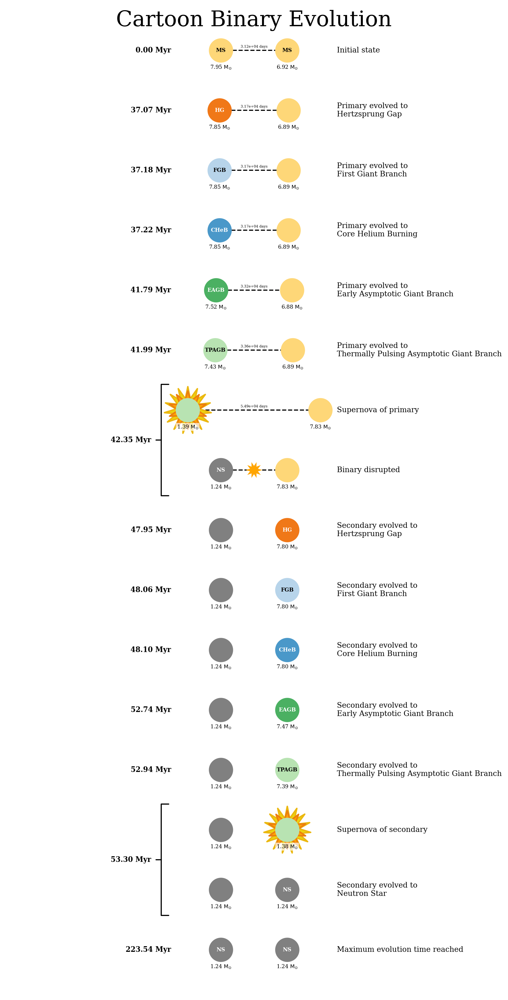

(<Figure size 1200x2400 with 1 Axes>, <Axes: >)

In [192]:
p.plot_cartoon_binary(221757)

In [213]:
ic.loc[221757]

kstar_1            1.000000
kstar_2            1.000000
mass_1             7.954477
mass_2             6.919086
porb           31172.585357
                   ...     
fprimc_12          0.095238
fprimc_13          0.095238
fprimc_14          0.095238
fprimc_15          0.095238
particle_id     2909.000000
Name: 221757, Length: 139, dtype: float64

In [250]:
a = p.secondary_orbits[p.bin_nums == 221757][0][0].vel.d_xyz

In [251]:
b = particle_orbits[2909][0].vel.d_xyz.to(u.km/u.s)

In [254]:
c = p.secondary_orbits[p.bin_nums == 221757][0][0].xyz
d = particle_orbits[2909][0].xyz

In [253]:
np.linalg.norm(a - b)

<Quantity 2.35544672 km / s>

In [258]:
np.linalg.norm(c - d).to(u.pc)

<Quantity 2.85909918 pc>

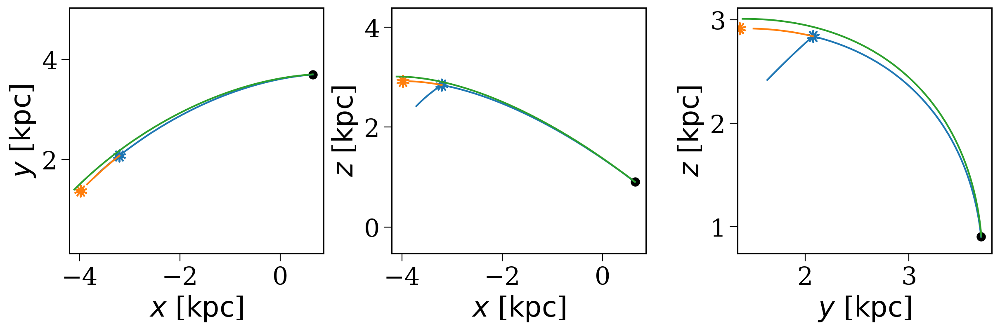

In [243]:
fig, axes = p.plot_orbit(221757, show=False, t_max=52*u.Myr)
particle_orbits[2909][:55].plot(axes=axes)
# axes[
plt.show()

In [226]:
p.initial_galaxy.x[p.bin_nums == 221756]

<Quantity [0.64243348] kpc>

In [215]:
particle_orbits = np.load("../data/particle_orbits.npy", allow_pickle=True)

In [224]:
particle_orbits[2909].x

<Quantity [ 0.64559816,  0.54727015,  0.44867366,  0.34985852,  0.25087421,
            0.15176966,  0.05259306, -0.04660825, -0.1457879 , -0.24490056,
           -0.34390201, -0.44274916, -0.54140008, -0.639814  , -0.73795132,
           -0.8357736 , -0.93324354, -1.03032497, -1.12698286, -1.2231833 ,
           -1.31889343, -1.41408153, -1.50871689, -1.60276987, -1.69621185,
           -1.78901519, -1.88115324, -1.97260026, -2.06333143, -2.1533228 ,
           -2.24255122, -2.33099435, -2.41863059, -2.50543905, -2.59139952,
           -2.67649241, -2.76069874, -2.8440001 , -2.92637862, -3.00781694,
           -3.08829821, -3.16780606, -3.24632457, -3.3238383 , -3.40033221,
           -3.47579174, -3.55020275, -3.62355151, -3.69582475, -3.76700957,
           -3.83709354, -3.90606461, -3.97391115, -4.04062193, -4.10618611,
           -4.17059324, -4.23383325, -4.29589641, -4.35677337, -4.41645509,
           -4.47493285, -4.53219826, -4.58824319, -4.64305978, -4.69664042,
           -

In [199]:
secondary_sn_rows[p.secondary_sn_distances > 100.0 * u.pc].loc[221757]

tphys           5.330211e+01
mass_1          1.242000e+00
mass_2          1.380755e+00
kstar_1         1.300000e+01
kstar_2         6.000000e+00
sep            -1.000000e+00
porb           -1.000000e+00
ecc            -1.000000e+00
RRLO_1          1.000000e-04
RRLO_2          1.000000e-04
evol_type       1.600000e+01
aj_1            1.095539e+01
aj_2            4.359972e+01
tms_1           1.000000e+10
tms_2           3.824826e+01
massc_1         1.242000e+00
massc_2         1.380423e+00
rad_1           1.400000e-05
rad_2           2.730414e-03
mass0_1         7.850250e+00
mass0_2         7.799938e+00
lum_1           1.926797e-04
lum_2           4.956198e+01
teff_1          1.825638e+05
teff_2          2.944032e+05
radc_1          1.400000e-05
radc_2          2.730414e-03
menv_1          1.000000e-10
menv_2          1.000000e-10
renv_1          1.000000e-10
renv_2          1.000000e-10
omega_spin_1    1.641995e+08
omega_spin_2    1.956154e+00
B_1             1.859514e+12
B_2           

In [191]:
p.kick_info.loc[221757]

,star,disrupted,natal_kick,phi,theta,mean_anomaly,delta_vsysx_1,delta_vsysy_1,delta_vsysz_1,vsys_1_total,delta_vsysx_2,delta_vsysy_2,delta_vsysz_2,vsys_2_total,delta_theta_total,omega,randomseed,bin_num
221757,1.0,1.0,56.915337,1.423909,263.791029,0.0,-0.416866,-23.799541,52.706666,57.832383,0.369403,0.284643,-0.077841,0.472799,0.0,0.0,-2.076045e+09,221757.0
221757,2.0,1.0,11.480491,-0.416408,269.125664,0.0,0.000000,0.000000,0.000000,57.832383,0.001273,0.083426,11.480188,11.414307,0.0,0.0,9.776464e+08,221757.0


In [190]:
ejection_velocities[p.sn_2][(ejection_velocities[p.sn_2] < 1) & (ejection_velocities[p.sn_2] > 0) & (dists[1] > 100)]

221757    0.472799
Name: mass_1, dtype: float64

Text(0, 0.5, 'Ejection velocity')

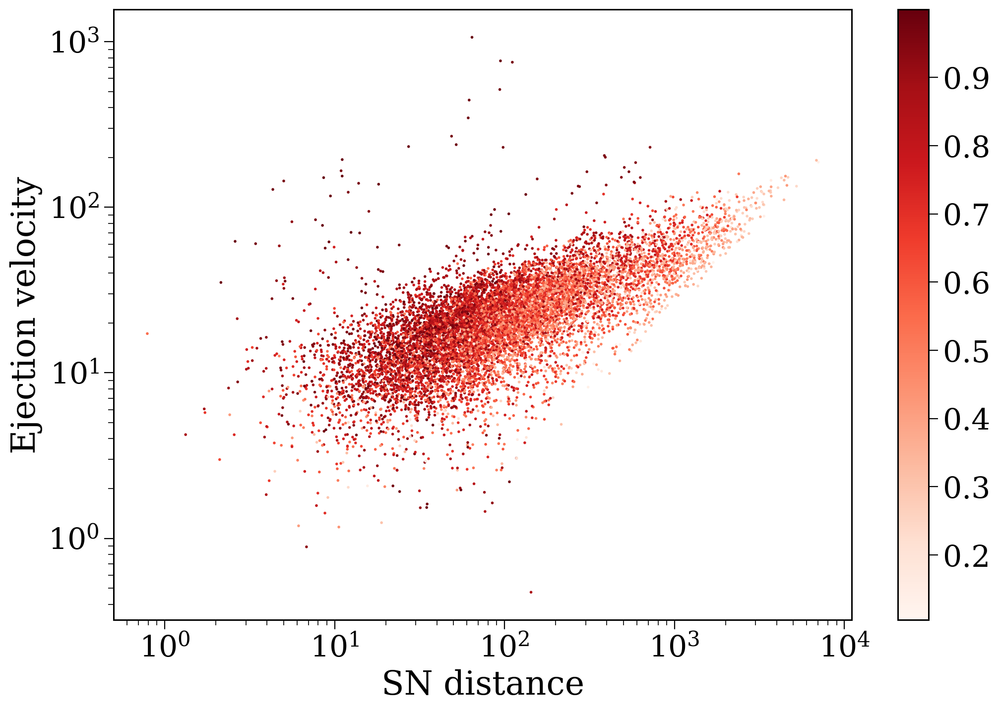

In [259]:
scatter = plt.scatter(dists[1], ejection_velocities[p.sn_2], s=1, c=ic["mass_2"] / ic["mass_1"], cmap="Reds")
plt.yscale("log")
plt.xscale("log")
plt.colorbar(scatter)
plt.xlabel("SN distance")
plt.ylabel("Ejection velocity")

In [155]:
ejection_velocities[p.sn_2]

81        29.981316
82        38.809693
89         4.088962
92        26.966263
114       12.734980
            ...    
776932    10.553702
776934     8.744971
776943    75.787815
776965    17.901413
776966    13.530742
Name: mass_1, Length: 11243, dtype: float64

In [147]:
sn_rows = p.bpp[((p.bpp["evol_type"] == 15) | (p.bpp["evol_type"] == 16)) & ~p.bpp["bin_num"].isin(p.duplicate_sn)]
    
primary_sn_rows = sn_rows[sn_rows["evol_type"] == 15]
secondary_sn_rows = sn_rows[sn_rows["evol_type"] == 16]

In [149]:
ejection_velocities

80        0.0
81        0.0
82        0.0
86        0.0
89        0.0
         ... 
776958    0.0
776959    0.0
776964    0.0
776965    0.0
776966    0.0
Name: mass_1, Length: 23939, dtype: float64

In [146]:
primary_sn_rows[

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num
80,21.247989,1.481223,4.605356,9.0,1.0,23.644766,5.401173,0.000000,0.539161,0.236926,15.0,3.598262,8.062471,3.333300,128.018970,1.481189,0.0,0.000014,2.684246,2.388716,4.605356,50.972124,3.966214e+02,4.140319e+06,15792.557219,0.000014,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.255751e+02,8268.695639,0.0,0.0,0.0,0.0,0.0,0.0,17.649712,13.185503,0.0,0.0,80
81,9.900690,6.432130,11.927065,5.0,1.0,12179.490034,36357.080655,0.137572,0.407298,0.001468,15.0,10.332924,8.884899,9.266508,17.369389,6.419907,0.0,1.721145,6.138374,18.347011,11.927065,175126.692788,1.424855e+04,9.040637e+04,25567.345146,1.147190,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,9.544753e+01,1684.323070,0.0,0.0,0.0,0.0,0.0,0.0,-0.433481,1.014541,0.0,0.0,81
82,6.844789,5.427264,32.613317,8.0,1.0,145.422606,32.953115,0.000000,0.018834,0.141618,15.0,1.085033,2.078336,1.023759,5.266379,4.030682,0.0,1.776907,10.990218,5.670836,32.613317,141110.113463,1.924995e+05,8.429984e+04,36633.113436,0.000070,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.226227e+09,2626.833094,0.0,0.0,0.0,0.0,0.0,0.0,5.759502,4.766195,0.0,0.0,82
86,40.274446,1.428451,4.381141,6.0,1.0,16373.016372,100737.787542,0.280089,0.213995,0.001210,15.0,40.912320,31.972810,35.928146,144.911218,1.428258,0.0,5.972134,2.824473,8.068565,4.381141,62965.857208,3.577977e+02,3.758211e+04,15004.112121,0.006008,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.956154e+00,3878.517291,0.0,0.0,0.0,0.0,0.0,0.0,-0.642741,8.296772,0.0,0.0,86
89,6.478879,7.823152,23.298055,8.0,1.0,28134.302835,98038.844788,0.127432,0.000116,0.001477,15.0,0.781613,6.344579,0.747738,7.069801,5.949916,0.0,1.062735,17.159372,8.157647,23.298055,231393.951373,1.414827e+05,1.233517e+05,27145.304920,0.000070,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,7.001621e+03,182.939517,0.0,0.0,0.0,0.0,0.0,0.0,5.696946,0.133965,0.0,0.0,89
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
776958,33.879018,8.128232,2.882155,5.0,1.0,3691.641657,7834.299606,0.374061,0.347352,0.003149,15.0,34.653514,33.784551,30.766168,439.152021,2.382815,0.0,699.677816,2.111793,8.674628,2.882155,35707.692438,6.757470e+01,3.013082e+03,11439.049840,11.911668,0.0,5.672009e+00,1.000000e-10,6.854588e+02,1.000000e-10,1.880985e+15,6340.055566,0.0,0.0,0.0,0.0,0.0,0.0,-0.776854,0.094278,0.0,0.0,776958
776959,130.457643,8.600963,0.000000,5.0,15.0,0.000000,0.000000,-1.000000,0.000100,-1.000000,15.0,30.219563,53.949840,26.863269,61.121306,2.610797,0.0,849.082580,6.591729,9.295051,6.291557,49371.150713,2.442754e+03,2.965944e+03,15875.955270,13.417484,0.0,4.711006e+00,1.000000e-10,7.869559e+02,1.000000e-10,4.735776e+13,1056.295568,0.0,0.0,0.0,0.0,0.0,0.0,100.238067,70.615747,0.0,0.0,776959
776964,11.263496,6.463748,0.000000,5.0,15.0,0.000000,0.000000,-1.000000,0.000100,-1.000000,15.0,10.115280,10.216090,9.062085,338.782350,6.452607,0.0,1.549537,2.176152,18.404909,3.170832,178332.037692,9.599889e+01,9.571412e+04,12302.449683,1.165399,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.059991e+00,51.540016,0.0,0.0,0.0,0.0,0.0,0.0,1.147877,0.000293,0.0,0.0,776964
776965,4.717279,8.253521,52.380082,8.0,1.0,3603.620068,3219.763474,0.000000,0.001005,0.012322,15.0,0.747501,2.860395,0.716289,3.970069,6.319212,0.0,1.050471,23.957834,8.637371,52.380082,248826.044355,6.740048e+05,1.263431e+05,33939.980036,0.000070,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,6.469480e+06,858.091102,0.0,0.0,0.0,0.0,0.0,0.0,3.969403,1.856475,0.0,0.0,776965


In [144]:
p.sn_2.index

Index([    81,     82,     89,     92,     93,     95,     96,    102,    106,
          107,
       ...
       776937, 776938, 776939, 776941, 776943, 776951, 776955, 776956, 776965,
       776966],
      dtype='int64', length=27888)

In [141]:
thing.index

Index([    80,     81,     82,     86,     89,     92,    100,    103,    114,
          115,
       ...
       776943, 776944, 776945, 776947, 776950, 776958, 776959, 776964, 776965,
       776966],
      dtype='int64', length=23939)

In [135]:
thing.index

Index([    80,     81,     82,     86,     89,     92,    100,    103,    114,
          115,
       ...
       776943, 776944, 776945, 776947, 776950, 776958, 776959, 776964, 776965,
       776966],
      dtype='int64', length=23939)

In [134]:
ejection_velocities.loc[thing.index] = thing

KeyError: '[80, 86, 100, 103, 115, 121, 127, 134, 137, 146, 149, 152, 387, 394, 413, 414, 416, 417, 441, 442, 444, 446, 448, 455, 467, 468, 2513, 2525, 2533, 2554, 2563, 2566, 2573, 3957, 3962, 3963, 3965, 3966, 3972, 3983, 3992, 4457, 4466, 4473, 4492, 4499, 4501, 4503, 6959, 6961, 6972, 6978, 6979, 6981, 6982, 6991, 6994, 6996, 6997, 6999, 7002, 7008, 7019, 7020, 7021, 7025, 7035, 7852, 7853, 7855, 7859, 7862, 7864, 7873, 7876, 7879, 7884, 7885, 7886, 7887, 7894, 7896, 7905, 7908, 7914, 7935, 8510, 8512, 8523, 8524, 8529, 8530, 8546, 8549, 8562, 8563, 8568, 8591, 8600, 8609, 8610, 8614, 8617, 8624, 8712, 8718, 8723, 8727, 8728, 8735, 8736, 8739, 8740, 8749, 8756, 8759, 8760, 8769, 8774, 8775, 8776, 9064, 9067, 9069, 9079, 9091, 9093, 9096, 9119, 9122, 9133, 9474, 9482, 9492, 9496, 9498, 9507, 9516, 9517, 9518, 9528, 9533, 9534, 9535, 10615, 10616, 10623, 10631, 10633, 10648, 10675, 10676, 10680, 11030, 11035, 11042, 11047, 11054, 11059, 11061, 11062, 11072, 12415, 12422, 12425, 12436, 12458, 12459, 12461, 12463, 12466, 12468, 12469, 12473, 14334, 14339, 14340, 14346, 14360, 14378, 14381, 14382, 14389, 14399, 16366, 16373, 16389, 16390, 16397, 16398, 16400, 16402, 16403, 16409, 16410, 16561, 16562, 16567, 16569, 16577, 16583, 16585, 16588, 16589, 16606, 16609, 16615, 16623, 16631, 16637, 16642, 16652, 16653, 16664, 16666, 16667, 16669, 16670, 16676, 16679, 16681, 16701, 16702, 16711, 16716, 16722, 16723, 16724, 16726, 16727, 16728, 16733, 16735, 16740, 16753, 16764, 16841, 16845, 16846, 16849, 16853, 16857, 16860, 16866, 16869, 16873, 16877, 16895, 16904, 16912, 16917, 16925, 16929, 16933, 17221, 17232, 17233, 17236, 17239, 17240, 17246, 17257, 17271, 18508, 18513, 18526, 18540, 18551, 18569, 18575, 18578, 18664, 18672, 18674, 18687, 18688, 18696, 18698, 18718, 18719, 18720, 18737, 19923, 19930, 19933, 19934, 19936, 19937, 19947, 19955, 19959, 19961, 19967, 19977, 19984, 19988, 19993, 19994, 19996, 19999, 20005, 22436, 22450, 22461, 22464, 22474, 22476, 22479, 22487, 22492, 22497, 22502, 22512, 22514, 22903, 22904, 22907, 22911, 22914, 22924, 22935, 23677, 23695, 23697, 23698, 23703, 23704, 23707, 23716, 23721, 23724, 23730, 23732, 23736, 23741, 23747, 23750, 23764, 23768, 23773, 23781, 23796, 23798, 23799, 23800, 23806, 23809, 23815, 23828, 24337, 24346, 24352, 24354, 24362, 24363, 24366, 24380, 24387, 24390, 24400, 24406, 24407, 24408, 24413, 24417, 24428, 24434, 24437, 24440, 24442, 24444, 24445, 24453, 24461, 24462, 26267, 26280, 26284, 26291, 26292, 26300, 26305, 26317, 26327, 26328, 26335, 26344, 26345, 28496, 28497, 28499, 28502, 28514, 28516, 28523, 28526, 28529, 28533, 28534, 28551, 28557, 28559, 29818, 29850, 29853, 29859, 29862, 29865, 30245, 30246, 30263, 30268, 30273, 30278, 30282, 30304, 30307, 30309, 30310, 30933, 30938, 30954, 30955, 30958, 30959, 30962, 30970, 30981, 30987, 30989, 31002, 31003, 31006, 31306, 31312, 31313, 31316, 31319, 31342, 31344, 31355, 31356, 31357, 31358, 31361, 31366, 31832, 31834, 31842, 31843, 31850, 31856, 31857, 31858, 31859, 31870, 31878, 31879, 31890, 32203, 32218, 32222, 32236, 32240, 32243, 32247, 32249, 32251, 32253, 32254, 32264, 32267, 32268, 32359, 32361, 32363, 32368, 32374, 32377, 32384, 32386, 32391, 32397, 32406, 32409, 32413, 32418, 32425, 32430, 32801, 32813, 32814, 32815, 32816, 32822, 32828, 32831, 32835, 32842, 32849, 32852, 32853, 33230, 33231, 33234, 33236, 33239, 33243, 33247, 33249, 33250, 33251, 33257, 33259, 33276, 33280, 33284, 33289, 33295, 33297, 33787, 33788, 33795, 33797, 33806, 33809, 33818, 33819, 33820, 33821, 33832, 33833, 33837, 33838, 33844, 33855, 33857, 33871, 33872, 33873, 34044, 34046, 34061, 34065, 34066, 34071, 34072, 34075, 34079, 34083, 34090, 34091, 34102, 34107, 34108, 34116, 34120, 34126, 34127, 36170, 36172, 36175, 36181, 36182, 36196, 36199, 36203, 36205, 36206, 36209, 36211, 36214, 36217, 36229, 36236, 36248, 36252, 38108, 38117, 38122, 38125, 38130, 38134, 38144, 38151, 38162, 38164, 38178, 38182, 38188, 38190, 38193, 38194, 38201, 38213, 38225, 38226, 38231, 38242, 38244, 38254, 38257, 38258, 38260, 38724, 38733, 38752, 38771, 38773, 38778, 38782, 38790, 38805, 39157, 39162, 39165, 39167, 39187, 39191, 39199, 39200, 39202, 39203, 39204, 39206, 39208, 39214, 39218, 39227, 39246, 41196, 41197, 41200, 41216, 41232, 41237, 41244, 42719, 42723, 42732, 42747, 42748, 42749, 42758, 42763, 42768, 42772, 42774, 42776, 42778, 42779, 42782, 42786, 42790, 42791, 42800, 42801, 42805, 42807, 42817, 42818, 42820, 42825, 42832, 42837, 42840, 42849, 42853, 42855, 42867, 44750, 44756, 44769, 44774, 44787, 44790, 44792, 44800, 44810, 44817, 44821, 44823, 44923, 44932, 44937, 44941, 44954, 44956, 44993, 44995, 44999, 45001, 45002, 45014, 45017, 45023, 45025, 45029, 45031, 45033, 46099, 46113, 46115, 46116, 46123, 46126, 46130, 46132, 46133, 46138, 46147, 46152, 46153, 46158, 46171, 46173, 46177, 46185, 46689, 46694, 46699, 46704, 46707, 46709, 46718, 46722, 46723, 46726, 46734, 46737, 46895, 46902, 46906, 46926, 46929, 46942, 46947, 46948, 46952, 46954, 46961, 46963, 46964, 46966, 47041, 47058, 47065, 47075, 47076, 47088, 47097, 47102, 47253, 47279, 47306, 47326, 47329, 47332, 47414, 47415, 47418, 47427, 47429, 47434, 47442, 47450, 47451, 47459, 47462, 47465, 47472, 47478, 47482, 48067, 48083, 48098, 48101, 48104, 48105, 48106, 48111, 48119, 48122, 49088, 49098, 49101, 49106, 49111, 49118, 49121, 49126, 49128, 49132, 49137, 49142, 49147, 49151, 49318, 49321, 49322, 49324, 49328, 49336, 49338, 49342, 49343, 49344, 49345, 49352, 49355, 49363, 49365, 49369, 49374, 49380, 49382, 50346, 50349, 50353, 50357, 50363, 50374, 50380, 50385, 50386, 50388, 50404, 50412, 50427, 50431, 52773, 52777, 52778, 52785, 52790, 52792, 52796, 52800, 54829, 54840, 54848, 54849, 54850, 54860, 54862, 54864, 54870, 54871, 54875, 55079, 55081, 55086, 55090, 55099, 55105, 55110, 55116, 55118, 55124, 55933, 55938, 55942, 55944, 55949, 55953, 55958, 55965, 55969, 55974, 55979, 56791, 56798, 56807, 56809, 56813, 56826, 56827, 56829, 56833, 56835, 56847, 56851, 56853, 56854, 57152, 57178, 57196, 58751, 58752, 58762, 58770, 58775, 58776, 58777, 58780, 58783, 58784, 58785, 58789, 58806, 58808, 58809, 58813, 58829, 58842, 58843, 58847, 59126, 59133, 59139, 59149, 59152, 59153, 59154, 59155, 59159, 59160, 59163, 59164, 59166, 59167, 59173, 59174, 59182, 59189, 59196, 59203, 59209, 59224, 59226, 59233, 59240, 59242, 59263, 59894, 59920, 59924, 59934, 59941, 59945, 59950, 59951, 59959, 62269, 62273, 62274, 62275, 62279, 62287, 62293, 62303, 62311, 62315, 62321, 62324, 62325, 62328, 62336, 62352, 62356, 62372, 62374, 62385, 62388, 62392, 62404, 62477, 62479, 62495, 62512, 62524, 62539, 62541, 62542, 62544, 62547, 62553, 62556, 63757, 63759, 63764, 63767, 63770, 63771, 63775, 63787, 63801, 63806, 63817, 63824, 63827, 63829, 64285, 64287, 64290, 64291, 64295, 64296, 64297, 64305, 64309, 64313, 64315, 64320, 64333, 64345, 64360, 64376, 64403, 64406, 64409, 64417, 64429, 64431, 64437, 64512, 64515, 64526, 64529, 64535, 64537, 64538, 64548, 64553, 64559, 64577, 64584, 66040, 66042, 66044, 66053, 66055, 66057, 66063, 66068, 66075, 66078, 66084, 66087, 66093, 66096, 66098, 66971, 66973, 66976, 66990, 66993, 67006, 67020, 67021, 67022, 67025, 67035, 67196, 67205, 67213, 67214, 67215, 67223, 67226, 67228, 67255, 67257, 67258, 67261, 67266, 67280, 68064, 68068, 68069, 68075, 68076, 68078, 68111, 68114, 68116, 68245, 68248, 68252, 68259, 68260, 68265, 68267, 68271, 68273, 68283, 68290, 68295, 68299, 68306, 68316, 68319, 68320, 68534, 68535, 68542, 68548, 68549, 68558, 68563, 68575, 68580, 70876, 70879, 70880, 70882, 70892, 70896, 70898, 70911, 70912, 70936, 71497, 71501, 71515, 71524, 71532, 71534, 71536, 71539, 71550, 71555, 71557, 71559, 71565, 71577, 71589, 71591, 71596, 71684, 71685, 71686, 71698, 71702, 71705, 71707, 71719, 71724, 71726, 71728, 71729, 71731, 71748, 71750, 71984, 71988, 72001, 72003, 72015, 72020, 72027, 72030, 72031, 72033, 72038, 72042, 72226, 72229, 72230, 72231, 72237, 72239, 72255, 72256, 72257, 72260, 72262, 72270, 72272, 72279, 72281, 72287, 72291, 72292, 72295, 72314, 72403, 72413, 72415, 72418, 72419, 72426, 72429, 72431, 72444, 72448, 72457, 72458, 72459, 72463, 72466, 72473, 72474, 72479, 72480, 73060, 73069, 73073, 73093, 73096, 73110, 73114, 73115, 73118, 73123, 73124, 73356, 73357, 73362, 73363, 73369, 73370, 73372, 73381, 73385, 73407, 73409, 73411, 73420, 74402, 74407, 74409, 74430, 74446, 74454, 74537, 74540, 74542, 74543, 74554, 74555, 74559, 74566, 74587, 74589, 76429, 76435, 76441, 76445, 76454, 76455, 76457, 76464, 76469, 76473, 76479, 76491, 76746, 76747, 76759, 76763, 76770, 76779, 76784, 76787, 76788, 76792, 76795, 76796, 76806, 76810, 76821, 76823, 76824, 76827, 76831, 76837, 76839, 76841, 76859, 76861, 76868, 76871, 76872, 78710, 78716, 78717, 78729, 78752, 78764, 78933, 78934, 78935, 78936, 78942, 78970, 78974, 78992, 78994, 79001, 80453, 80461, 80473, 80480, 80482, 80484, 80487, 80493, 80495, 80499, 80500, 80507, 80509, 80511, 81151, 81152, 81158, 81160, 81173, 81174, 81178, 81181, 81191, 81193, 81199, 81201, 81209, 81212, 81299, 81330, 81338, 81340, 81344, 81345, 81352, 81370, 81375, 81376, 81382, 81390, 81391, 81393, 81399, 81408, 81417, 81431, 81441, 81448, 82136, 82144, 82145, 82146, 82148, 82153, 82159, 82170, 82171, 82172, 82177, 82187, 82192, 82196, 82198, 82202, 82524, 82528, 82536, 82542, 82545, 82550, 82558, 82563, 82565, 82568, 82580, 82586, 82589, 82590, 82592, 82593, 83663, 83664, 83670, 83673, 83675, 83682, 83683, 83684, 83698, 83705, 83707, 83710, 83715, 83717, 83721, 83724, 84761, 84780, 84782, 84790, 84791, 84800, 84802, 84818, 84823, 84830, 84832, 84838, 84842, 84843, 86142, 86144, 86145, 86146, 86149, 86150, 86169, 86176, 86178, 86187, 86188, 86190, 86196, 88705, 88718, 88723, 88726, 88749, 88755, 88757, 88768, 91912, 91930, 91931, 91932, 91934, 91937, 91941, 91949, 91952, 91955, 91957, 91960, 91971, 91973, 92304, 92308, 92314, 92319, 92321, 92322, 92330, 92331, 92333, 92341, 92343, 92344, 92347, 92348, 92363, 92707, 92709, 92710, 92717, 92725, 92726, 92727, 92728, 92734, 92745, 92754, 92759, 92761, 92763, 92767, 92771, 92772, 92773, 92778, 93587, 93597, 93608, 93624, 93628, 93639, 93640, 93650, 93655, 93729, 93735, 93750, 93755, 93758, 93760, 93764, 93775, 96853, 96862, 96863, 96872, 96875, 96884, 96887, 96890, 96898, 96904, 96905, 96924, 97165, 97178, 97180, 97184, 97195, 97201, 97203, 97204, 97209, 97218, 97921, 97927, 97928, 97933, 97942, 97948, 97950, 97954, 97964, 97965, 98680, 98682, 98695, 98700, 98704, 98705, 98717, 98718, 98720, 98729, 98734, 98745, 98749, 99561, 99565, 99566, 99567, 99573, 99576, 99583, 99592, 99601, 99606, 99608, 101643, 101647, 101652, 101656, 101666, 101669, 101676, 101678, 101680, 101690, 101698, 101796, 101797, 101807, 101814, 101818, 101828, 101842, 101843, 101848, 101853, 101855, 101862, 101867, 101885, 101901, 101902, 101912, 101923, 101924, 101928, 101939, 101948, 101951, 101952, 101954, 101956, 102385, 102392, 102397, 102400, 102402, 102403, 102413, 102416, 102419, 102422, 102426, 102428, 102430, 102431, 102439, 102440, 102444, 102977, 102978, 102992, 102993, 103001, 103015, 103018, 103026, 103028, 103029, 103030, 105317, 105320, 105321, 105327, 105339, 105344, 105346, 105351, 105353, 105363, 105367, 105381, 105389, 105393, 105729, 105733, 105734, 105735, 105742, 105745, 105753, 105757, 105765, 107571, 107575, 107584, 107585, 107592, 107596, 107601, 107621, 107624, 107626, 107631, 107637, 109348, 109355, 109357, 109365, 109374, 109384, 109387, 109391, 109393, 109395, 109398, 109400, 109409, 109410, 109411, 109414, 109416, 109417, 109419, 109801, 109806, 109810, 109812, 109813, 109816, 109824, 109826, 109836, 109841, 109843, 109844, 109847, 109989, 109991, 109995, 109996, 109997, 109998, 110002, 110006, 110007, 110013, 110021, 110022, 110030, 110032, 110053, 110060, 110065, 110067, 110078, 110083, 112104, 112114, 112115, 112124, 112133, 112147, 112148, 112151, 112160, 112161, 112162, 113527, 113531, 113540, 113542, 113547, 113558, 113568, 113571, 113579, 113586, 113587, 113588, 113596, 113728, 113733, 113735, 113745, 113749, 113750, 113752, 113758, 113767, 113769, 113770, 113771, 113773, 113776, 113783, 113788, 113806, 113820, 113821, 113822, 113829, 113835, 113842, 113843, 113845, 113847, 113853, 113854, 113861, 113862, 113869, 113870, 113871, 113873, 113875, 113884, 113885, 115758, 115760, 115763, 115767, 115769, 115772, 115777, 115790, 115799, 115801, 115805, 115808, 115811, 116331, 116339, 116345, 116346, 116347, 116358, 116363, 116373, 116460, 116465, 116468, 116469, 116485, 116487, 116497, 116508, 116510, 116524, 116525, 116529, 116531, 117581, 117582, 117594, 117596, 117597, 117602, 117607, 117608, 117611, 117618, 117626, 117631, 117643, 117649, 117650, 117938, 117944, 117946, 117954, 117955, 117965, 117968, 117969, 117976, 117977, 117991, 117993, 117994, 118080, 118081, 118095, 118096, 118098, 118100, 118117, 118120, 118130, 118132, 118138, 118140, 118145, 118148, 118308, 118314, 118315, 118319, 118343, 118357, 118364, 118382, 119621, 119626, 119629, 119642, 119643, 119656, 119662, 119665, 119667, 119676, 119692, 119696, 120156, 120158, 120161, 120166, 120171, 120180, 120182, 120198, 120199, 120204, 120210, 120213, 120214, 121418, 121466, 121472, 123916, 123918, 123949, 123953, 123954, 123955, 123960, 123961, 124052, 124053, 124056, 124061, 124063, 124066, 124081, 124084, 124085, 124089, 124090, 124098, 124100, 124107, 124109, 124118, 124123, 124132, 124141, 124151, 124162, 124171, 124172, 124176, 124178, 124465, 124467, 124481, 124482, 124483, 124484, 124490, 124492, 124493, 124497, 124504, 124506, 124519, 124526, 124544, 124547, 124555, 124564, 124579, 124588, 124591, 124601, 124614, 124620, 124621, 124630, 124632, 124636, 124637, 124640, 124643, 124652, 124653, 124659, 124661, 124663, 124666, 124667, 124672, 124673, 124886, 124891, 124892, 124904, 124905, 124922, 124924, 124935, 124937, 124948, 124954, 124964, 124969, 124970, 124981, 124983, 124985, 124995, 125000, 125001, 125005, 125010, 125026, 125033, 125039, 125041, 125042, 125206, 125208, 125214, 125217, 125219, 125227, 125240, 125241, 125245, 125254, 125268, 125277, 125278, 125283, 125286, 125288, 125383, 125393, 125394, 125405, 125411, 125412, 127122, 127123, 127127, 127141, 127142, 127162, 127167, 127172, 127173, 127180, 127185, 127192, 127198, 127204, 127215, 127217, 127222, 127224, 127225, 127230, 127234, 127235, 127237, 127244, 127869, 127871, 127874, 127881, 127886, 127890, 127902, 127903, 127909, 127920, 129124, 129130, 129138, 129139, 129141, 129150, 129151, 129153, 129177, 129182, 129183, 129184, 129193, 129195, 129286, 129292, 129299, 129305, 129309, 129311, 129312, 129316, 129320, 129330, 129332, 129339, 129343, 129353, 131761, 131777, 131779, 131793, 131800, 131802, 131814, 131821, 131824, 131832, 131840, 131853, 131856, 132015, 132021, 132024, 132040, 132041, 132044, 132046, 132048, 132057, 132060, 132061, 132066, 132068, 132073, 132078, 132080, 132084, 132503, 132533, 132548, 132552, 132556, 132558, 132559, 132568, 132571, 132579, 133314, 133315, 133339, 133344, 133345, 133747, 133749, 133752, 133758, 133760, 133762, 133763, 133767, 133769, 133778, 133782, 133789, 133794, 133796, 133798, 133803, 133809, 133824, 133827, 133834, 133839, 133844, 133849, 133858, 133862, 133872, 133877, 133884, 133891, 134305, 134312, 134313, 134331, 134333, 134347, 134363, 134368, 134372, 134380, 134381, 134383, 134385, 137083, 137087, 137096, 137099, 137100, 137116, 137120, 137123, 137124, 137145, 137149, 137152, 137154, 137269, 137271, 137277, 137282, 137286, 137289, 137306, 137320, 137329, 137331, 137333, 137335, 137339, 137869, 137873, 137881, 137884, 137885, 137896, 137898, 137899, 137913, 137914, 137916, 137924, 137932, 137934, 137938, 138143, 138147, 138151, 138159, 138167, 138170, 138172, 138174, 138176, 138179, 138180, 138187, 138193, 138196, 138202, 138215, 139618, 139619, 139622, 139638, 139644, 139652, 139653, 139660, 139663, 139669, 139675, 139681, 139684, 139687, 140482, 140490, 140492, 140505, 140508, 140510, 140527, 140528, 140529, 140530, 140537, 140538, 140546, 140549, 140557, 140563, 140564, 140569, 140819, 140823, 140827, 140831, 140838, 140843, 140851, 140853, 140891, 141699, 141700, 141702, 141704, 141706, 141712, 141713, 141727, 141739, 141741, 141742, 141745, 142605, 142609, 142614, 142618, 142634, 142637, 142639, 142650, 142653, 142663, 142672, 142674, 142675, 142683, 142921, 142924, 142926, 142928, 142930, 142936, 142937, 142942, 142948, 142949, 142955, 142960, 142964, 142967, 142975, 142994, 142997, 142999, 143004, 143172, 143173, 143177, 143203, 143204, 143207, 143209, 143217, 143220, 143224, 143233, 143237, 143240, 143247, 143331, 143332, 143333, 143334, 143362, 143371, 143376, 143386, 143392, 143397, 143746, 143750, 143781, 143788, 143791, 143794, 143800, 143803, 143811, 143814, 143820, 143822, 143823, 144923, 144925, 144936, 144939, 144948, 144950, 144952, 144961, 144964, 144969, 144972, 144976, 144978, 144987, 144996, 145001, 145003, 145005, 145009, 145010, 145015, 145023, 145024, 145028, 145029, 145040, 145042, 145043, 145065, 145067, 145068, 145522, 145533, 145552, 145562, 145563, 145567, 145578, 145580, 145581, 145582, 145588, 145593, 145601, 145604, 145607, 145618, 145787, 145799, 145824, 145825, 145827, 145834, 145840, 145845, 146469, 146483, 146489, 146507, 146515, 148044, 148052, 148060, 148067, 148071, 148074, 148084, 148091, 148518, 148519, 148525, 148527, 148560, 148572, 148574, 149046, 149047, 149050, 149056, 149058, 149063, 149080, 149081, 149085, 149088, 150455, 150456, 150466, 150472, 150473, 150480, 150487, 150492, 150498, 150499, 150682, 150687, 150690, 150692, 150699, 150712, 152695, 152703, 152708, 152715, 152748, 152751, 152761, 152762, 152765, 153636, 153645, 153657, 153661, 153673, 153677, 153678, 153681, 153690, 155348, 155349, 155357, 155376, 155382, 155392, 155393, 155397, 156457, 156461, 156478, 156489, 156491, 156498, 156504, 156509, 156514, 156520, 156528, 156536, 156539, 156716, 156717, 156729, 156732, 156738, 156741, 156748, 156753, 156757, 156758, 157739, 157747, 157748, 157752, 157755, 157756, 157764, 157765, 157766, 157777, 157783, 157785, 157789, 157798, 157800, 157801, 160247, 160252, 160253, 160264, 160269, 160295, 160299, 160306, 160471, 160479, 160493, 160498, 160507, 162971, 162980, 162983, 162984, 162992, 162998, 163006, 163010, 163012, 163019, 163026, 163030, 163031, 163591, 163593, 163610, 163628, 163637, 163640, 163643, 164196, 164210, 164213, 164215, 164236, 164237, 164239, 164243, 164252, 164253, 164257, 164259, 164424, 164431, 164433, 164434, 164457, 164460, 164462, 164474, 164480, 164481, 164488, 164502, 164504, 164507, 164514, 164516, 165095, 165096, 165103, 165106, 165121, 165122, 165125, 165135, 165141, 165146, 165148, 165154, 165160, 165167, 165170, 165177, 165180, 165182, 165184, 166345, 166358, 166363, 166364, 166366, 166378, 166382, 166386, 166393, 166396, 166403, 166409, 166581, 166591, 166592, 166603, 166604, 166609, 166610, 166613, 166615, 167662, 167663, 167664, 167665, 167668, 167681, 167692, 167700, 167706, 169022, 169038, 169044, 169047, 169049, 169067, 169300, 169301, 169305, 169306, 169307, 169308, 169322, 169327, 169337, 169352, 169354, 169355, 169357, 169446, 169449, 169451, 169463, 169464, 169466, 169467, 169469, 169472, 169473, 169475, 169478, 169483, 169486, 169494, 169506, 169507, 169944, 169945, 169962, 169965, 169977, 169979, 169986, 169989, 170014, 170433, 170435, 170436, 170446, 170447, 170452, 170455, 170466, 170470, 170473, 170480, 170484, 170492, 170872, 170873, 170886, 170891, 170895, 170903, 170904, 170915, 170916, 170920, 170924, 170933, 171399, 171400, 171401, 171402, 171407, 171410, 171412, 171413, 171424, 171440, 171449, 171450, 171452, 171457, 171458, 171462, 171815, 171816, 171817, 171819, 171823, 171841, 171845, 171851, 171862, 171865, 171866, 171868, 171874, 172032, 172034, 172040, 172042, 172046, 172048, 172050, 172052, 172055, 172056, 172061, 172066, 172072, 172074, 172085, 172093, 172098, 172109, 172112, 172115, 172119, 172120, 172121, 172123, 174607, 174617, 174619, 174622, 174628, 174631, 174654, 174667, 174905, 174913, 174914, 174916, 174926, 174931, 174932, 174938, 174942, 174945, 174954, 174958, 174969, 174972, 175626, 175631, 175635, 175637, 175640, 175647, 175649, 175650, 175658, 175660, 175664, 175665, 175666, 175668, 175672, 175678, 175679, 175680, 175684, 175686, 175694, 175696, 175701, 175702, 175705, 176590, 176593, 176601, 176611, 176613, 176615, 176617, 176618, 176619, 176627, 176630, 176639, 176643, 176664, 177695, 177696, 177705, 177708, 177710, 177730, 177733, 177735, 177737, 177742, 177743, 177748, 177753, 177754, 177767, 177769, 177772, 178330, 178332, 178337, 178338, 178351, 178356, 178368, 178379, 178393, 178395, 178402, 178408, 180805, 180808, 180809, 180817, 180820, 180821, 180845, 180852, 180864, 180873, 180876, 180882, 180896, 180923, 180924, 180925, 180936, 180941, 180958, 180967, 180969, 180971, 180974, 180979, 180980, 180985, 180991, 180994, 181430, 181440, 181443, 181445, 181446, 181448, 181453, 181454, 181457, 181458, 181463, 181464, 181474, 181486, 181487, 181509, 181516, 181520, 181523, 181529, 181536, 181540, 181543, 181544, 181545, 181551, 181552, 181559, 181561, 181563, 181569, 181574, 181577, 181586, 181590, 181591, 181603, 182243, 182252, 182254, 182260, 182262, 182266, 182276, 182280, 182282, 182291, 182294, 182311, 182326, 182327, 182334, 182339, 182507, 182508, 182511, 182512, 182516, 182521, 182522, 182523, 182536, 182567, 182903, 182904, 182909, 182913, 182919, 182929, 182935, 182952, 182959, 182960, 183139, 183153, 183157, 183163, 183169, 183176, 183184, 183190, 183191, 183194, 184779, 184780, 184781, 184786, 184799, 184803, 184807, 184809, 184815, 184819, 184821, 184822, 184828, 184829, 184830, 184832, 184834, 184841, 184842, 184846, 184848, 184850, 184853, 184854, 184857, 184860, 184864, 184865, 184879, 184885, 184891, 184893, 184895, 184896, 184903, 184910, 184915, 184930, 184934, 184937, 184956, 184958, 184965, 184966, 184974, 185260, 185274, 185277, 185278, 185279, 185282, 185288, 185296, 185299, 185304, 185305, 185309, 185312, 185839, 185846, 185849, 185851, 185853, 185856, 185865, 185866, 185880, 185886, 185893, 185900, 185904, 185907, 185908, 186070, 186076, 186086, 186087, 186088, 186100, 186102, 186109, 186123, 186134, 186137, 186140, 186144, 186147, 186150, 186394, 186395, 186398, 186405, 186408, 186415, 186425, 186427, 186429, 186440, 186457, 186470, 186691, 186715, 186722, 186728, 186734, 186749, 186753, 186757, 187309, 187333, 187340, 187345, 187347, 187358, 187366, 187368, 187372, 187374, 187525, 187538, 187553, 187555, 187565, 187568, 187581, 187596, 187607, 188140, 188145, 188150, 188153, 188158, 188167, 188169, 188173, 188178, 188189, 188194, 188196, 188204, 188207, 188220, 188221, 188226, 188228, 188234, 188235, 188236, 188237, 188240, 188247, 188255, 188259, 188266, 189189, 189205, 189212, 189223, 189228, 189230, 189241, 189248, 189254, 189255, 189260, 189268, 189269, 190809, 190817, 190821, 190828, 190865, 190872, 190879, 190887, 190999, 191017, 191028, 191037, 191043, 191045, 191053, 191057, 191060, 191063, 191077, 191206, 191222, 191225, 191227, 191237, 191242, 191245, 191248, 191250, 191253, 191258, 191260, 191270, 191272, 191942, 191953, 191962, 191969, 191971, 191972, 191992, 191999, 192000, 192004, 192005, 192006, 192007, 192009, 192010, 192168, 192169, 192172, 192174, 192183, 192191, 192196, 192198, 192201, 192208, 192219, 192224, 192225, 192228, 192233, 192237, 192739, 192747, 192748, 192752, 192757, 192758, 192764, 192777, 192781, 192786, 192790, 192879, 192893, 192897, 192899, 192903, 192910, 192914, 192917, 192930, 192939, 192940, 195762, 195763, 195766, 195771, 195773, 195777, 195782, 195783, 195784, 195785, 195793, 195795, 195806, 195816, 196476, 196481, 196485, 196489, 196501, 196505, 196506, 196536, 196696, 196702, 196709, 196710, 196712, 196721, 196724, 196729, 196737, 196742, 196744, 196750, 197038, 197039, 197043, 197047, 197048, 197049, 197052, 197075, 197080, 197201, 197202, 197205, 197211, 197220, 197225, 197229, 197231, 197241, 197246, 197261, 197269, 197929, 197930, 197935, 197942, 197951, 197955, 197957, 197969, 197972, 197974, 198000, 198004, 198006, 198594, 198602, 198620, 198629, 198632, 198634, 198635, 198639, 198644, 198653, 198658, 198662, 198668, 199208, 199209, 199215, 199216, 199218, 199222, 199228, 199246, 199251, 199252, 199261, 199613, 199623, 199627, 199632, 199640, 199641, 199644, 199648, 199655, 199662, 199666, 199674, 199681, 199841, 199847, 199855, 199862, 199868, 199870, 200720, 200724, 200733, 200737, 200750, 200753, 200756, 200757, 200768, 200776, 200780, 200783, 200788, 200789, 200941, 200945, 200954, 200962, 200970, 200972, 200978, 200986, 200995, 200998, 201006, 202149, 202152, 202154, 202155, 202156, 202161, 202167, 202172, 202181, 202191, 202193, 202198, 202210, 202212, 202216, 202223, 202225, 202795, 202800, 202803, 202810, 202820, 202825, 202827, 202839, 202844, 202847, 202850, 202854, 202859, 203549, 203559, 203564, 203569, 203571, 203574, 203579, 203591, 203601, 203610, 203612, 203614, 203615, 204380, 204382, 204383, 204394, 204411, 204413, 204416, 204418, 204425, 204429, 204430, 204827, 204833, 204847, 204848, 204850, 204855, 204858, 204862, 204868, 204869, 204875, 204889, 204899, 204904, 204906, 204907, 204912, 205101, 205109, 205120, 205126, 205132, 205134, 205138, 205143, 205155, 205157, 205168, 205181, 205183, 205185, 205770, 205771, 205782, 205785, 205792, 205794, 205798, 205805, 205807, 205819, 205822, 205827, 205828, 205833, 206437, 206456, 206463, 206466, 206470, 206479, 206489, 206491, 206499, 206508, 206510, 207599, 207605, 207619, 207626, 207644, 207645, 207647, 207650, 207651, 207654, 207655, 207668, 208085, 208091, 208097, 208111, 208112, 208113, 208126, 208128, 208131, 208883, 208887, 208893, 208897, 208900, 208918, 208922, 208923, 208926, 208933, 208943, 208944, 208946, 208952, 208956, 209470, 209472, 209477, 209484, 209486, 209493, 209496, 209497, 209499, 209504, 209514, 209517, 209523, 209525, 209530, 209536, 210532, 210535, 210541, 210543, 210546, 210549, 210550, 210552, 210553, 210554, 210560, 210571, 210575, 211062, 211063, 211079, 211086, 211094, 211096, 211107, 211114, 211117, 211127, 211129, 211134, 211135, 211482, 211484, 211491, 211497, 211500, 211503, 211507, 211522, 211525, 211527, 211535, 211536, 211541, 211542, 211544, 211554, 211558, 211566, 211567, 211574, 211578, 211586, 211591, 211595, 211597, 211606, 211608, 211617, 211621, 211624, 211625, 211626, 212070, 212085, 212091, 212094, 212116, 212121, 212124, 212127, 212132, 213959, 213972, 213974, 213980, 213982, 213992, 213993, 213994, 213997, 213998, 214000, 214007, 214008, 214012, 214016, 214017, 214018, 214020, 214023, 215255, 215259, 215264, 215267, 215272, 215280, 215290, 215291, 215296, 215297, 215304, 215305, 215314, 215318, 215319, 215328, 215331, 215347, 216996, 217003, 217006, 217010, 217018, 217028, 217034, 217040, 217042, 217495, 217500, 217519, 217521, 217529, 217531, 217537, 217540, 220246, 220247, 220264, 220269, 220270, 220277, 220295, 220302, 220304, 220307, 220312, 220317, 220319, 220320, 220332, 220911, 220914, 220919, 220925, 220943, 220944, 220948, 220950, 220965, 220971, 220974, 220976, 220981, 220983, 220987, 220990, 220991, 221283, 221289, 221295, 221307, 221316, 221321, 221327, 221328, 221333, 221336, 221344, 221345, 221349, 221356, 221360, 221366, 221367, 221368, 221369, 221375, 221376, 221377, 221390, 221391, 221398, 221409, 221417, 221732, 221737, 221738, 221746, 221747, 221752, 221754, 221756, 221764, 221769, 221770, 221772, 221780, 221781, 222096, 222102, 222105, 222116, 222123, 222127, 222128, 222157, 222952, 222968, 222969, 222970, 222971, 222974, 222980, 222981, 222982, 222988, 222991, 223003, 223004, 223250, 223266, 223275, 223282, 223283, 223286, 223291, 223298, 224210, 224218, 224219, 224225, 224226, 224228, 224229, 224232, 224233, 224239, 224244, 224246, 224249, 224255, 224257, 224261, 224262, 224266, 224268, 224271, 224284, 224292, 224294, 224299, 224304, 224306, 224314, 224315, 224335, 224336, 224340, 224342, 224731, 224732, 224735, 224737, 224744, 224747, 224751, 224756, 224759, 224767, 224775, 224777, 228328, 228331, 228335, 228340, 228343, 228358, 228360, 228361, 228370, 228371, 228375, 228396, 228402, 228403, 228405, 228407, 228414, 228419, 228421, 228424, 228428, 228439, 228443, 228502, 228510, 228512, 228522, 228532, 228533, 228537, 228542, 228553, 228561, 228568, 228569, 228575, 228583, 228585, 228951, 228960, 228966, 228970, 228972, 228975, 228978, 228987, 228994, 229004, 229010, 229016, 229021, 229023, 229027, 229034, 229043, 229062, 229065, 229066, 229068, 229076, 229080, 229083, 229085, 229086, 230105, 230106, 230108, 230109, 230119, 230122, 230135, 230138, 230146, 230149, 230576, 230579, 230581, 230585, 230587, 230602, 230612, 230629, 230633, 230639, 230641, 231551, 231553, 231562, 231574, 231580, 231587, 231603, 231606, 231607, 231947, 231956, 231960, 231969, 231976, 231990, 231996, 232000, 232005, 232752, 232753, 232764, 232765, 232766, 232779, 232783, 232785, 232787, 232796, 232797, 232807, 232808, 232958, 232961, 232966, 232974, 232989, 233002, 233004, 233011, 233012, 233021, 233022, 233023, 233037, 234482, 234488, 234494, 234502, 234513, 234517, 234522, 234526, 234533, 234535, 234539, 234543, 234550, 235131, 235148, 235151, 235155, 235164, 235166, 235168, 235173, 235188, 235370, 235375, 235378, 235385, 235387, 235403, 235405, 235406, 235407, 235409, 235414, 235415, 235419, 235430, 235432, 236668, 236669, 236671, 236672, 236673, 236675, 236676, 236677, 236688, 236692, 236693, 236695, 236708, 236713, 236715, 236717, 236721, 236730, 236734, 236746, 237194, 237196, 237199, 237204, 237210, 237215, 237221, 237228, 237231, 237233, 237245, 238881, 238887, 238891, 238892, 238894, 238900, 238903, 238907, 238930, 238931, 238945, 238952, 238955, 241125, 241139, 241141, 241161, 241162, 242610, 242621, 242623, 242638, 242641, 242647, 242648, 242663, 242664, 242665, 242668, 242669, 242671, 242682, 242685, 242687, 242689, 242696, 242710, 242712, 242721, 242726, 242727, 242731, 242994, 242995, 242996, 243002, 243014, 243026, 243036, 243048, 243068, 243071, 243072, 243073, 244231, 244236, 244239, 244240, 244243, 244247, 244255, 244261, 244263, 244272, 244273, 244276, 244283, 245317, 245320, 245326, 245330, 245331, 245337, 245338, 245345, 245348, 245349, 245361, 245364, 245367, 245369, 245375, 245383, 245393, 245404, 246260, 246265, 246275, 246283, 246286, 246290, 246303, 246306, 246310, 246313, 246321, 246322, 246866, 246867, 246873, 246898, 246901, 246921, 246927, 247101, 247106, 247114, 247120, 247121, 247123, 247124, 247130, 247144, 247152, 247158, 247165, 247407, 247412, 247414, 247421, 247448, 247451, 247462, 247470, 249891, 249899, 249922, 249923, 249932, 249937, 249942, 249944, 249947, 249953, 249956, 249969, 250371, 250372, 250373, 250374, 250381, 250382, 250386, 250406, 250407, 250410, 250413, 250414, 250417, 250421, 250430, 252654, 252655, 252656, 252660, 252663, 252667, 252671, 252676, 252682, 252692, 252694, 252699, 252708, 252714, 253588, 253623, 253625, 253627, 253636, 253642, 255079, 255080, 255101, 255102, 255105, 255107, 255110, 255118, 255121, 255127, 255129, 255134, 255136, 255137, 255138, 255141, 255142, 255146, 255516, 255517, 255520, 255539, 255546, 255558, 255559, 255656, 255660, 255661, 255665, 255673, 255687, 255690, 255691, 255695, 255697, 255698, 255700, 255701, 255705, 256040, 256041, 256047, 256058, 256063, 256067, 256078, 256084, 256090, 256092, 256093, 256107, 256111, 256113, 256350, 256351, 256352, 256358, 256361, 256364, 256365, 256366, 256370, 256371, 256385, 256386, 256391, 256393, 256394, 256403, 256406, 256409, 256411, 256416, 256423, 256427, 256429, 256430, 257667, 257674, 257679, 257692, 257697, 257711, 257715, 257716, 257719, 257722, 257728, 257742, 257755, 257761, 257763, 259533, 259540, 259557, 259559, 259573, 259576, 259579, 259588, 259594, 259599, 259616, 260452, 260455, 260456, 260460, 260475, 260488, 260499, 260501, 260506, 260512, 260517, 260521, 261754, 261759, 261770, 261774, 261783, 261787, 261789, 261790, 261797, 261798, 261799, 261805, 261806, 261809, 261821, 261826, 261829, 261832, 261839, 261841, 261842, 261845, 261851, 261859, 261873, 261881, 261884, 261887, 261893, 262156, 262162, 262170, 262175, 262178, 262179, 262181, 262182, 262188, 262190, 262195, 262211, 262217, 262890, 262896, 262902, 262919, 262932, 262935, 262959, 263088, 263089, 263093, 263104, 263119, 263123, 263124, 263125, 263136, 263144, 263148, 263153, 263155, 263166, 263168, 263592, 263595, 263597, 263598, 263617, 263620, 263623, 263624, 263635, 263643, 263647, 263655, 264780, 264799, 264804, 264806, 264815, 264822, 264827, 267648, 267649, 267661, 267678, 267682, 267694, 267703, 267708, 267718, 267723, 267732, 269213, 269216, 269242, 269245, 269254, 269260, 269261, 269267, 269269, 269288, 269293, 269310, 269315, 269333, 269334, 269339, 269346, 269349, 269350, 269352, 269357, 269364, 269404, 269406, 269407, 269408, 269418, 269422, 269436, 269442, 269445, 270025, 270037, 270038, 270043, 270045, 270047, 270059, 270062, 270069, 270074, 270079, 270084, 270085, 270097, 270101, 270111, 270120, 270122, 270123, 270128, 270130, 270136, 270147, 270155, 270936, 270943, 270944, 270955, 270962, 270965, 270970, 270973, 270986, 270987, 270991, 271165, 271166, 271177, 271186, 271198, 271201, 271206, 271213, 271219, 271221, 271228, 271231, 271232, 273193, 273199, 273203, 273204, 273208, 273209, 273210, 273212, 273213, 273217, 273239, 273247, 273251, 273256, 276823, 276825, 276828, 276832, 276854, 276865, 276868, 276869, 276876, 276887, 276892, 276897, 276904, 276923, 278462, 278466, 278470, 278472, 278475, 278479, 278487, 278490, 278491, 278496, 278507, 278517, 278523, 278524, 279333, 279337, 279341, 279347, 279348, 279349, 279350, 279354, 279358, 279375, 279379, 279390, 279470, 279471, 279472, 279474, 279476, 279485, 279486, 279493, 279494, 279501, 279503, 279504, 279523, 279529, 279756, 279760, 279761, 279770, 279774, 279775, 279789, 279791, 279798, 279804, 279806, 279816, 279823, 279841, 279843, 279844, 280034, 280046, 280049, 280057, 280060, 280063, 280065, 280068, 280073, 280081, 280090, 280093, 280095, 282307, 282313, 282314, 282322, 282333, 282336, 282341, 282346, 282351, 282359, 282362, 282369, 282370, 282377, 283505, 283509, 283511, 283516, 283521, 283522, 283524, 283530, 283533, 283539, 283540, 283547, 283549, 283552, 283555, 283564, 283643, 283650, 283653, 283654, 283666, 283671, 283675, 283685, 283686, 283694, 283695, 283770, 283782, 283789, 283790, 283793, 283797, 283799, 283803, 283804, 283807, 283818, 283824, 283999, 284014, 284015, 284021, 284033, 284036, 284044, 284045, 284048, 284049, 284050, 284064, 284069, 284079, 286629, 286633, 286638, 286644, 286650, 286659, 286662, 286666, 286678, 287607, 287612, 287627, 287628, 287645, 287646, 287659, 287672, 287674, 287689, 287692, 288270, 288272, 288280, 288288, 288295, 288298, 288301, 288305, 288309, 288311, 288325, 288334, 288335, 288813, 288819, 288830, 288834, 288838, 288845, 288850, 288862, 288864, 288865, 290126, 290132, 290135, 290143, 290149, 290150, 290158, 290801, 290804, 290817, 290821, 290823, 290828, 290839, 290840, 290846, 290848, 290863, 290873, 290875, 291119, 291126, 291137, 291138, 291142, 291148, 291150, 291151, 291152, 291157, 292249, 292257, 292260, 292265, 292267, 292276, 292287, 292295, 292298, 292299, 292313, 293042, 293043, 293049, 293061, 293088, 293091, 293466, 293467, 293470, 293472, 293481, 293482, 293489, 293491, 293494, 293498, 293504, 293508, 293513, 293514, 293516, 293517, 293518, 293528, 293529, 293530, 293534, 293745, 293746, 293748, 293765, 293766, 293773, 293776, 293791, 293798, 293803, 293811, 295883, 295886, 295892, 295893, 295894, 295896, 295903, 295913, 295915, 295917, 295924, 295925, 295933, 295937, 295941, 295942, 295944, 295949, 296118, 296119, 296121, 296131, 296148, 296165, 296168, 296798, 296805, 296806, 296815, 296827, 296833, 296834, 296836, 296840, 296845, 296847, 296853, 296863, 296870, 298270, 298282, 298285, 298287, 298288, 298291, 298293, 298295, 298296, 298305, 298306, 298318, 298324, 298325, 299201, 299202, 299203, 299216, 299224, 299226, 299227, 299229, 299238, 299239, 299242, 299248, 299259, 301027, 301044, 301062, 301064, 301065, 301068, 301070, 301074, 301077, 301095, 301107, 301110, 301114, 301347, 301357, 301359, 301361, 301364, 301365, 301367, 301377, 301380, 301381, 301384, 301392, 301398, 302951, 302952, 302959, 302965, 302972, 302997, 303008, 303016, 303019, 303181, 303183, 303201, 303202, 303219, 303227, 303230, 303233, 303236, 303238, 303242, 303894, 303895, 303896, 303903, 303904, 303920, 303923, 303927, 303928, 303945, 303946, 303950, 303955, 303957, 304683, 304695, 304700, 304701, 304717, 304718, 304720, 304723, 304742, 304745, 304746, 304749, 305818, 305820, 305822, 305824, 305826, 305831, 305837, 305839, 305846, 305851, 305852, 305856, 305857, 305950, 305964, 305965, 305969, 305977, 306008, 306011, 306012, 306013, 306739, 306747, 306757, 306761, 306763, 306771, 306783, 306787, 306800, 306801, 306803, 308728, 308737, 308775, 308776, 308791, 308801, 308806, 308807, 308809, 308812, 308813, 309103, 309115, 309142, 309145, 309152, 309157, 309312, 309317, 309332, 309338, 309339, 309340, 309345, 309347, 309355, 309359, 309360, 309362, 309367, 309373, 309379, 309400, 309793, 309799, 309806, 309810, 309812, 309814, 309818, 309836, 309840, 309842, 309855, 309863, 309866, 311981, 311982, 311984, 311995, 311997, 312003, 312004, 312016, 312018, 312021, 312024, 312036, 312039, 312044, 312047, 312129, 312130, 312163, 312170, 312173, 312192, 312364, 312368, 312369, 312370, 312378, 312386, 312388, 312393, 312395, 312399, 312408, 312884, 312886, 312892, 312895, 312898, 312902, 312903, 312911, 312914, 312918, 312920, 312935, 312936, 312949, 312951, 312958, 312961, 312964, 312965, 314470, 314486, 314492, 314496, 314510, 314511, 314517, 314520, 314521, 314526, 314537, 314542, 314544, 314549, 314553, 314577, 314578, 314587, 315642, 315646, 315662, 315665, 315670, 315674, 315681, 315688, 315689, 315693, 317498, 317504, 317509, 317510, 317532, 317533, 317541, 317548, 317549, 317561, 317564, 317571, 317572, 317577, 317578, 317580, 317583, 317586, 317588, 317589, 317592, 317596, 317597, 317607, 317608, 317613, 317624, 317626, 317628, 317635, 317642, 317643, 317659, 317660, 317666, 317672, 317677, 317682, 317684, 317686, 317692, 317695, 317698, 317701, 318956, 318960, 318968, 318972, 318978, 318986, 319004, 319008, 319010, 319011, 319023, 319028, 319029, 320384, 320388, 320390, 320391, 320395, 320408, 320418, 320422, 320427, 320428, 320432, 320445, 320448, 320451, 320459, 320463, 320471, 321406, 321425, 321427, 321435, 321439, 321448, 321455, 321457, 321458, 321472, 321476, 321902, 321903, 321906, 321909, 321915, 321920, 321927, 321938, 321966, 321968, 321969, 321970, 321975, 322211, 322213, 322216, 322221, 322230, 322242, 322246, 322247, 322250, 322253, 322255, 322257, 322258, 322259, 322271, 322374, 322379, 322381, 322388, 322390, 322398, 322411, 322415, 322427, 322429, 322440, 323001, 323004, 323008, 323028, 323040, 323044, 323045, 323047, 323050, 323054, 323057, 323070, 323072, 323075, 323900, 323905, 323908, 323909, 323916, 323928, 323947, 323950, 323960, 323963, 324051, 324056, 324062, 324066, 324073, 324075, 324076, 324088, 324089, 324097, 324098, 324108, 324891, 324894, 324900, 324902, 324909, 324914, 324917, 324927, 324928, 324934, 325485, 325487, 325496, 325498, 325511, 325520, 325534, 325535, 325536, 325924, 325928, 325940, 325944, 325945, 325948, 325951, 325952, 325958, 325960, 325968, 325970, 325980, 325986, 325992, 326001, 326004, 326005, 326018, 326019, 326021, 326022, 326322, 326324, 326328, 326329, 326345, 326348, 326349, 326353, 326356, 326360, 326366, 326368, 326382, 326475, 326479, 326496, 326502, 326504, 326506, 326509, 326511, 326513, 326517, 326532, 326535, 326541, 326545, 326549, 326555, 326710, 326714, 326715, 326724, 326736, 326740, 326744, 326745, 326746, 326749, 326751, 326760, 326939, 326954, 326977, 326978, 326987, 326988, 326990, 327002, 327003, 327612, 327621, 327627, 327628, 327632, 327633, 327636, 327639, 327641, 327648, 327652, 327653, 327654, 327657, 327658, 327668, 327675, 327677, 328137, 328139, 328144, 328154, 328161, 328191, 328196, 328216, 328907, 328912, 328918, 328928, 328930, 328936, 328949, 328952, 328955, 328968, 328971, 330347, 330353, 330358, 330363, 330368, 330369, 330390, 330409, 330411, 330417, 330508, 330517, 330521, 330544, 330546, 330556, 330557, 330561, 330562, 330563, 330564, 330565, 330570, 330574, 331412, 331413, 331417, 331421, 331423, 331427, 331431, 331438, 331443, 331448, 331449, 331450, 331456, 331457, 331461, 331472, 331475, 331561, 331570, 331575, 331588, 331590, 331591, 331601, 331609, 332061, 332064, 332086, 332089, 332090, 332094, 332096, 332109, 332111, 332112, 332116, 332120, 332122, 332124, 332128, 332130, 332134, 332140, 332158, 332159, 332160, 332161, 332179, 332293, 332295, 332299, 332300, 332309, 332313, 332317, 332329, 332333, 332341, 333314, 333323, 333332, 333337, 333342, 333349, 333353, 333365, 333368, 333374, 333378, 334027, 334039, 334041, 334046, 334047, 334050, 334051, 334062, 334073, 334075, 334086, 334098, 334102, 334108, 335370, 335371, 335385, 335386, 335399, 335400, 335405, 335409, 335420, 335425, 335427, 335432, 336023, 336028, 336033, 336043, 336061, 336064, 336071, 336074, 336078, 336079, 336082, 336083, 336091, 336095, 336100, 336665, 336667, 336672, 336677, 336696, 336699, 336700, 336701, 336704, 336708, 336712, 336718, 336724, 336729, 336732, 336739, 336751, 336757, 336759, 336760, 336787, 337851, 337852, 337863, 337867, 337877, 337883, 337884, 337891, 337901, 337908, 337909, 337919, 337931, 337934, 338438, 338439, 338440, 338443, 338445, 338446, 338454, 338455, 338459, 338467, 338476, 338477, 338492, 338494, 338498, 338501, 338504, 338508, 338510, 338513, 338517, 338521, 339153, 339160, 339167, 339175, 339176, 339179, 339185, 339193, 339194, 339206, 339209, 339210, 339212, 339214, 339215, 339217, 339218, 340925, 340930, 340933, 340938, 340952, 340955, 340956, 340975, 340988, 341003, 341018, 341024, 341037, 341042, 341055, 341069, 341070, 341077, 341522, 341529, 341531, 341536, 341537, 341562, 341566, 341569, 341579, 341586, 341589, 341590, 341597, 341600, 342619, 342633, 342637, 342649, 342650, 342658, 342662, 342675, 342681, 342682, 342685, 342686, 342701, 342705, 342708, 342711, 343447, 343454, 343456, 343459, 343460, 343463, 343469, 343471, 343480, 343485, 343489, 343501, 343508, 345273, 345274, 345288, 345289, 345292, 345298, 345305, 345309, 345334, 345344, 345355, 345356, 345357, 345363, 345796, 345802, 345820, 345821, 345825, 345829, 345835, 345836, 345839, 345841, 345861, 345865, 345867, 345870, 345872, 345877, 346276, 346277, 346283, 346299, 346306, 346308, 346312, 346313, 346317, 346345, 347074, 347107, 347115, 347127, 347132, 347133, 347144, 347155, 347290, 347294, 347298, 347316, 347319, 347341, 347344, 347348, 347355, 347528, 347532, 347536, 347539, 347540, 347547, 347550, 347561, 347565, 347566, 347571, 347572, 347578, 347579, 348435, 348438, 348450, 348463, 348468, 348470, 348475, 348477, 348479, 348484, 348495, 348500, 348501, 348502, 348504, 348507, 348510, 348513, 348519, 348686, 348687, 348690, 348691, 348696, 348719, 348724, 348732, 348736, 348744, 351389, 351394, 351396, 351398, 351401, 351402, 351407, 351408, 351412, 351413, 351417, 351418, 351431, 351434, 351435, 351436, 351445, 351449, 352162, 352163, 352170, 352178, 352198, 352201, 352203, 352205, 352207, 352217, 353532, 353537, 353539, 353543, 353546, 353551, 353576, 353578, 353579, 353588, 353589, 353594, 353602, 353832, 353835, 353838, 353842, 353843, 353857, 353870, 353872, 353875, 353878, 353895, 353898, 353900, 353901, 356410, 356419, 356421, 356427, 356434, 356450, 356457, 356463, 356468, 356477, 357160, 357169, 357178, 357193, 357196, 357197, 357200, 357211, 357215, 357221, 357674, 357679, 357685, 357691, 357695, 357696, 357702, 357716, 357721, 357722, 357733, 357740, 357752, 357762, 357942, 357950, 357960, 357967, 357971, 357975, 357982, 357991, 358002, 358004, 359602, 359603, 359619, 359625, 359627, 359629, 359633, 359634, 359636, 359653, 359661, 360033, 360034, 360036, 360046, 360051, 360076, 360080, 360765, 360766, 360770, 360773, 360779, 360780, 360793, 360798, 360801, 360807, 360812, 360815, 360822, 360828, 360841, 360843, 360844, 360853, 360861, 360864, 360887, 360892, 360897, 361297, 361303, 361314, 361323, 361330, 361338, 361640, 361643, 361644, 361653, 361654, 361658, 361659, 361660, 361665, 361669, 361679, 361681, 361688, 361692, 361696, 361770, 361774, 361778, 361789, 361791, 361799, 361800, 361803, 361805, 361806, 361809, 361816, 361819, 361835, 361846, 361852, 361854, 361857, 363887, 363889, 363898, 363901, 363902, 363909, 363910, 363915, 363916, 363922, 363932, 363997, 364000, 364001, 364008, 364010, 364011, 364021, 364028, 364029, 364037, 364041, 364057, 364066, 364076, 364079, 364080, 364082, 364247, 364250, 364254, 364260, 364267, 364273, 364277, 364279, 364284, 364286, 364289, 364296, 364304, 364308, 364314, 364787, 364789, 364791, 364796, 364804, 364807, 364808, 364821, 364826, 364838, 364845, 364846, 364847, 364855, 364864, 364865, 364872, 364968, 364975, 364979, 364984, 364988, 364995, 365002, 365009, 365011, 365013, 365027, 365430, 365445, 365451, 365456, 365483, 365485, 365491, 365496, 365502, 365649, 365682, 365690, 365693, 365702, 365704, 365709, 365713, 365714, 365735, 365738, 365745, 365747, 365846, 365862, 365867, 365869, 365870, 365872, 365890, 365891, 365892, 365893, 365895, 365902, 365905, 365908, 365910, 365915, 366489, 366495, 366502, 366508, 366509, 366519, 366521, 366522, 366526, 366542, 366549, 366555, 367024, 367026, 367033, 367035, 367046, 367054, 367055, 367064, 367068, 367086, 367092, 367094, 367405, 367406, 367410, 367413, 367416, 367422, 367427, 367433, 367435, 367436, 367438, 367467, 367472, 367476, 367637, 367640, 367643, 367647, 367656, 367660, 367661, 367663, 367674, 367677, 367692, 367779, 367780, 367785, 367791, 367796, 367805, 367828, 367829, 367833, 367835, 367847, 367848, 367850, 367852, 367853, 367858, 367859, 368504, 368506, 368507, 368508, 368510, 368520, 368521, 368529, 368532, 368536, 368542, 368549, 368559, 368562, 369312, 369318, 369325, 369333, 369342, 369343, 369344, 369345, 369349, 369351, 369354, 369356, 369357, 369362, 369364, 369366, 369368, 369371, 369379, 369382, 370029, 370038, 370040, 370041, 370047, 370056, 370058, 370059, 370072, 370081, 370087, 370093, 370104, 370112, 370118, 370967, 370972, 370984, 370985, 370990, 370996, 371000, 371001, 371006, 371007, 371010, 371013, 371045, 372765, 372768, 372786, 372788, 372790, 372792, 372796, 372799, 372801, 372804, 372816, 372819, 372824, 372829, 375022, 375027, 375035, 375040, 375045, 375050, 375051, 375053, 375061, 375067, 375068, 375073, 375076, 375094, 375095, 375113, 375123, 375124, 375128, 375133, 375134, 375136, 375138, 375341, 375346, 375362, 375370, 375372, 375380, 375396, 375401, 375402, 376095, 376102, 376105, 376119, 376126, 376136, 376138, 376139, 376150, 376156, 376159, 376161, 376167, 376184, 376186, 376799, 376811, 376813, 376820, 376833, 376836, 376844, 376845, 376856, 376860, 376867, 376877, 376878, 376900, 376904, 376907, 376911, 376912, 376917, 376919, 376934, 376936, 376943, 376947, 376952, 376957, 376971, 376981, 376984, 376987, 376994, 376996, 377002, 377028, 377511, 377512, 377517, 377520, 377526, 377530, 377534, 377544, 377554, 377568, 377569, 378882, 378886, 378888, 378894, 378904, 378906, 378913, 378914, 378917, 378950, 378954, 378956, 379406, 379418, 379424, 379429, 379430, 379436, 379439, 379453, 379461, 379475, 379476, 379970, 379973, 379978, 379983, 379985, 379994, 379998, 380003, 380008, 380012, 380026, 380038, 380039, 380045, 380048, 380051, 380058, 380059, 380066, 380897, 380901, 380909, 380912, 380921, 380924, 380931, 380934, 380935, 380939, 380942, 380943, 380944, 380947, 381170, 381177, 381187, 381190, 381195, 381203, 381210, 381219, 381222, 381224, 381226, 381229, 381234, 381251, 381259, 381269, 381279, 381283, 381287, 381291, 381293, 381294, 381730, 381732, 381734, 381741, 381744, 381749, 381751, 381752, 381757, 381763, 381770, 381783, 381789, 381793, 381794, 381795, 381803, 381804, 381810, 382319, 382322, 382324, 382325, 382327, 382334, 382335, 382339, 382340, 382343, 382351, 382353, 382354, 382356, 382357, 382361, 382377, 382385, 382387, 382390, 382391, 382404, 382406, 382411, 382416, 382425, 382427, 382438, 382440, 382444, 382452, 382459, 382939, 382940, 382948, 382972, 382977, 382979, 382981, 382994, 382995, 383011, 383013, 383014, 383015, 383018, 384773, 384774, 384778, 384781, 384782, 384785, 384792, 384795, 384797, 384809, 384822, 384827, 384831, 384834, 384839, 384843, 385464, 385466, 385489, 385491, 385498, 385511, 385512, 385529, 385533, 385540, 385542, 385547, 385559, 385565, 385574, 385577, 385582, 385588, 385589, 385592, 385597, 385608, 385614, 385615, 385628, 386951, 386952, 386953, 386958, 386969, 386975, 386979, 387011, 387017, 387024, 387032, 387627, 387628, 387629, 387631, 387647, 387668, 387669, 387670, 387671, 387683, 389706, 389709, 389715, 389724, 389728, 389729, 389744, 389745, 389750, 389753, 389759, 390225, 390226, 390230, 390231, 390232, 390236, 390251, 390252, 390255, 390263, 390268, 390270, 390275, 390283, 390294, 390301, 390313, 390325, 390327, 390333, 390348, 390350, 390362, 390375, 390377, 390383, 390387, 390391, 390400, 390401, 390413, 390427, 390431, 390436, 390439, 390444, 390450, 390454, 390458, 390462, 390463, 390466, 390556, 390560, 390563, 390574, 390585, 390588, 390595, 390610, 390617, 390626, 390630, 390634, 390637, 390639, 390640, 393106, 393116, 393120, 393123, 393127, 393136, 393138, 393139, 393147, 393153, 393163, 393170, 393182, 393329, 393335, 393339, 393345, 393348, 393350, 393370, 393380, 393385, 393390, 393393, 393398, 396640, 396642, 396644, 396645, 396646, 396659, 396662, 396673, 396674, 396685, 396705, 396708, 396710, 396711, 396712, 396721, 396728, 396824, 396830, 396831, 396832, 396838, 396849, 396853, 396861, 396868, 396871, 396874, 396875, 396880, 396881, 396882, 396888, 396894, 396902, 396904, 396908, 396912, 396915, 396924, 396927, 396928, 396948, 396951, 396953, 396962, 396970, 396971, 396982, 396983, 396991, 396996, 397006, 397013, 397021, 397034, 397038, 397062, 397063, 397075, 397093, 397101, 397106, 397114, 397121, 397133, 397135, 398718, 398724, 398735, 398738, 398741, 398744, 398748, 398755, 398757, 398770, 398787, 399344, 399361, 399378, 399379, 399380, 399382, 399388, 399389, 399392, 399398, 399400, 399401, 399405, 399406, 399408, 399412, 399415, 399694, 399702, 399704, 399705, 399707, 399710, 399714, 399715, 399720, 399722, 399727, 399729, 399733, 399734, 399748, 399752, 399757, 399764, 399766, 401601, 401603, 401613, 401614, 401621, 401629, 401635, 401639, 401642, 401649, 401651, 401653, 401659, 401735, 401741, 401749, 401764, 401775, 401777, 401785, 401788, 401791, 401810, 401815, 401824, 401827, 401828, 401829, 401833, 401838, 401842, 401843, 401848, 401851, 401857, 401859, 401860, 401861, 401865, 401870, 401871, 401875, 401876, 401880, 401888, 401890, 401897, 401899, 401900, 401901, 401902, 401912, 402375, 402390, 402402, 402404, 402417, 402421, 402422, 402423, 402428, 402438, 404191, 404195, 404209, 404212, 404217, 404221, 404238, 404239, 404250, 404259, 404267, 404268, 404271, 404276, 404435, 404440, 404444, 404447, 404455, 404467, 404470, 404477, 404488, 405034, 405048, 405052, 405057, 405060, 405062, 405063, 405076, 405085, 405087, 405088, 405089, 405092, 405109, 405111, 405114, 405117, 405124, 405129, 405138, 405139, 405140, 405153, 405158, 405159, 405162, 405165, 405173, 405178, 405185, 405197, 405198, 405199, 405203, 405210, 405216, 405225, 405228, 405229, 405237, 405240, 405241, 405248, 405252, 405255, 405257, 405259, 405261, 405262, 405263, 407173, 407179, 407182, 407183, 407184, 407192, 407193, 407208, 407215, 407227, 407234, 407236, 407241, 408861, 408863, 408865, 408885, 408887, 408897, 408899, 408914, 408915, 408918, 408922, 408927, 409564, 409578, 409579, 409586, 409588, 409597, 409599, 409600, 409601, 409607, 409610, 409615, 412686, 412693, 412694, 412696, 412704, 412706, 412711, 412715, 412716, 412720, 412723, 412729, 412733, 412756, 412761, 412762, 413567, 413569, 413596, 413598, 413602, 413617, 413619, 413625, 413626, 413638, 413640, 413649, 414602, 414607, 414610, 414624, 414630, 414635, 414636, 414639, 414640, 414646, 414650, 414658, 414665, 414672, 414950, 414953, 414954, 414959, 414967, 414975, 414982, 414983, 414986, 414987, 414992, 415005, 415011, 415014, 415016, 415237, 415238, 415242, 415246, 415253, 415260, 415261, 415263, 415268, 415272, 415280, 415283, 415286, 415743, 415749, 415751, 415761, 415768, 415769, 415776, 415782, 415791, 415795, 415798, 415800, 415803, 415807, 415809, 415814, 415819, 415829, 415832, 415837, 415839, 416802, 416805, 416816, 416820, 416826, 416833, 416841, 416842, 416843, 416855, 416858, 416864, 416867, 416876, 416879, 416886, 416970, 416973, 416979, 416980, 416981, 416995, 417000, 417481, 417482, 417486, 417493, 417496, 417499, 417504, 417506, 417509, 417511, 417514, 417519, 417521, 417524, 417534, 419048, 419053, 419059, 419063, 419070, 419075, 419078, 419081, 419088, 419090, 419093, 419095, 419099, 421597, 421602, 421612, 421614, 421617, 421618, 421620, 421627, 421635, 421636, 421642, 421645, 421661, 421663, 421665, 421670, 421679, 421759, 421765, 421767, 421772, 421774, 421781, 421787, 421798, 421802, 421803, 421814, 421815, 421818, 422395, 422396, 422401, 422403, 422406, 422413, 422417, 422428, 422430, 422437, 422438, 422439, 422462, 422465, 422466, 422473, 424533, 424535, 424537, 424548, 424556, 424560, 424570, 424582, 424593, 425260, 425262, 425264, 425271, 425272, 425273, 425283, 425285, 425286, 425295, 425298, 425324, 425534, 425542, 425547, 425549, 425552, 425556, 425558, 425559, 425568, 425571, 425573, 425576, 425589, 425594, 425597, 425598, 425604, 425900, 425902, 425903, 425908, 425909, 425913, 425923, 425925, 425928, 425938, 425942, 425946, 425947, 425948, 425956, 425965, 425966, 425985, 425986, 425990, 426671, 426679, 426702, 426707, 426715, 426716, 426732, 426734, 427077, 427095, 427104, 427106, 427108, 427112, 427453, 427454, 427456, 427458, 427468, 427470, 427473, 427475, 427482, 427492, 427501, 427506, 427514, 427515, 427516, 427522, 427526, 427529, 427538, 427542, 428917, 428920, 428922, 428925, 428935, 428939, 428949, 428959, 428962, 430017, 430018, 430019, 430028, 430030, 430031, 430038, 430041, 430044, 430047, 430052, 430057, 430061, 430064, 430068, 430069, 430070, 430072, 430496, 430501, 430510, 430519, 430531, 430533, 430537, 430543, 430549, 430557, 430558, 433000, 433009, 433011, 433013, 433029, 433048, 433056, 433642, 433644, 433646, 433648, 433649, 433651, 433666, 433673, 433675, 433678, 433686, 433695, 433707, 433713, 433716, 433719, 433723, 433744, 433752, 433764, 433768, 434055, 434064, 434074, 434080, 434082, 434085, 434095, 434096, 434101, 434105, 434116, 434119, 434358, 434371, 434381, 434382, 434384, 434389, 434405, 434406, 434413, 434568, 434577, 434585, 434591, 434601, 434611, 434617, 434618, 434619, 434620, 434712, 434719, 434728, 434732, 434738, 434742, 434762, 434766, 434768, 436642, 436644, 436674, 436678, 436682, 436688, 436690, 436701, 436803, 436805, 436816, 436818, 436820, 436830, 436831, 436833, 436838, 436839, 436848, 436850, 436853, 436857, 437265, 437270, 437275, 437287, 437297, 437302, 437304, 437315, 437320, 437698, 437701, 437711, 437715, 437730, 437731, 437733, 437736, 437738, 437740, 437742, 437749, 437757, 437780, 437788, 437789, 437791, 437797, 438260, 438262, 438266, 438269, 438270, 438280, 438282, 438299, 438314, 439280, 439289, 439297, 439302, 439305, 439306, 439316, 439325, 439329, 439334, 439339, 439345, 439348, 439349, 439716, 439721, 439730, 439743, 439749, 439766, 439779, 439782, 440127, 440129, 440132, 440142, 440148, 440149, 440155, 440157, 440158, 440172, 440178, 440184, 442752, 442756, 442766, 442768, 442788, 442789, 442793, 442795, 442804, 442805, 443691, 443694, 443695, 443696, 443699, 443708, 443710, 443717, 443731, 443733, 443737, 443739, 443741, 443905, 443906, 443907, 443913, 443914, 443920, 443938, 443939, 443944, 443949, 443951, 443958, 443962, 444127, 444132, 444133, 444134, 444136, 444141, 444144, 444153, 444162, 444163, 444165, 444168, 444171, 444183, 445849, 445856, 445860, 445877, 445883, 445885, 445886, 445888, 445891, 445904, 445906, 445910, 445931, 445933, 445936, 446272, 446274, 446275, 446276, 446278, 446283, 446287, 446291, 446298, 446300, 446302, 446303, 446308, 446309, 446314, 446324, 446326, 446616, 446633, 446635, 446638, 446639, 446649, 446650, 446655, 446659, 446669, 446670, 446672, 446673, 446682, 446683, 446687, 446690, 446691, 446694, 446700, 446705, 447598, 447603, 447605, 447629, 447630, 447635, 447640, 447644, 447651, 447911, 447915, 447916, 447919, 447921, 447935, 447942, 447944, 447946, 447953, 447966, 447970, 447977, 447978, 447979, 447980, 447987, 447991, 447997, 448006, 448028, 448040, 448046, 448048, 448052, 448058, 448059, 448267, 448268, 448269, 448276, 448278, 448281, 448292, 448301, 448312, 448706, 448707, 448713, 448720, 448721, 448728, 448730, 448733, 448738, 448741, 448749, 448755, 448756, 448759, 448775, 448776, 448789, 450806, 450818, 450820, 450830, 450831, 450832, 450836, 450841, 450844, 452315, 452322, 452325, 452328, 452334, 452337, 452340, 452352, 452362, 452363, 452365, 452372, 452376, 452378, 452379, 452766, 452767, 452771, 452775, 452777, 452795, 452796, 452798, 452806, 452807, 452809, 452811, 452812, 452819, 452821, 452831, 452924, 452926, 452928, 452931, 452945, 452949, 452952, 452955, 452972, 452975, 452983, 452993, 452996, 455092, 455096, 455097, 455104, 455108, 455109, 455110, 455114, 455116, 455118, 455119, 455134, 455136, 455143, 455148, 455166, 455167, 455169, 455177, 455195, 455200, 455208, 455557, 455559, 455561, 455564, 455568, 455575, 455587, 455600, 455607, 455611, 455617, 455619, 456384, 456394, 456399, 456406, 456407, 456409, 456411, 456431, 456432, 456439, 456442, 456446, 456457, 456458, 456872, 456874, 456878, 456899, 456907, 456912, 456914, 456923, 456924, 456930, 459140, 459147, 459149, 459151, 459157, 459158, 459163, 459164, 459168, 459169, 459177, 459189, 459190, 459193, 459194, 459197, 459199, 459202, 459208, 459212, 459646, 459656, 459657, 459658, 459660, 459664, 459674, 459690, 459691, 459700, 459705, 459707, 459715, 459719, 459879, 459909, 459911, 459912, 459924, 459934, 459938, 459943, 460766, 460768, 460773, 460783, 460792, 460795, 460807, 460811, 460813, 462580, 462595, 462606, 462613, 462615, 462618, 462622, 462634, 462636, 462637, 462645, 462662, 462671, 462674, 462676, 462679, 462963, 462986, 462987, 462988, 462989, 462990, 462992, 462995, 462996, 462998, 463010, 463011, 463017, 463019, 463022, 463023, 463026, 463458, 463459, 463464, 463465, 463478, 463484, 463487, 463493, 463502, 464892, 464894, 464899, 464904, 464906, 464912, 464924, 464929, 464941, 464956, 464959, 464965, 464973, 464981, 464999, 465002, 465004, 465009, 465023, 465027, 465036, 465192, 465193, 465198, 465200, 465210, 465213, 465218, 465224, 465228, 465231, 465256, 465258, 466224, 466226, 466236, 466237, 466242, 466244, 466254, 466260, 466263, 466266, 466276, 466279, 466283, 467442, 467446, 467458, 467459, 467463, 467465, 467482, 467483, 467496, 467497, 467876, 467886, 467893, 467897, 467905, 467907, 467918, 467927, 467929, 467933, 467935, 467938, 468086, 468087, 468092, 468093, 468102, 468114, 468117, 468120, 468128, 468129, 468135, 468138, 468141, 468150, 468164, 468623, 468627, 468629, 468649, 468663, 468672, 468677, 468687, 468690, 468691, 469296, 469297, 469303, 469311, 469318, 469321, 469322, 469330, 469340, 469344, 469351, 469357, 469358, 469361, 469362, 469363, 469367, 470295, 470303, 470313, 470314, 470318, 470328, 470329, 470337, 470345, 470350, 470358, 470367, 470502, 470507, 470517, 470521, 470522, 470523, 470528, 470535, 470543, 470547, 470556, 470559, 470560, 470565, 470567, 470568, 470569, 471566, 471571, 471575, 471586, 471590, 471591, 471598, 471614, 471622, 471625, 471629, 471636, 471643, 471649, 471650, 472174, 472181, 472184, 472185, 472187, 472201, 472204, 472205, 472207, 472217, 472227, 472231, 472232, 472237, 472252, 472255, 472256, 472258, 473207, 473208, 473212, 473213, 473219, 473221, 473224, 473228, 473230, 473249, 473250, 473262, 473276, 473595, 473603, 473606, 473615, 473635, 473638, 473642, 473646, 473651, 473654, 473662, 473664, 473666, 473669, 473674, 473676, 473954, 473965, 473971, 473973, 473980, 473981, 474002, 474013, 474014, 475454, 475473, 475493, 475495, 475496, 475497, 475499, 475501, 475504, 475506, 475507, 475511, 475516, 475526, 475527, 475530, 475532, 475534, 475535, 475537, 475701, 475703, 475715, 475720, 475722, 475726, 475735, 475741, 475743, 475747, 475751, 475752, 475764, 475853, 475855, 475857, 475858, 475861, 475863, 475865, 475872, 475873, 475878, 475881, 475889, 475895, 475905, 475907, 475909, 475911, 476296, 476299, 476305, 476309, 476312, 476323, 476325, 476328, 476329, 476335, 476342, 476349, 476355, 476366, 476369, 476370, 476374, 477212, 477223, 477228, 477229, 477230, 477231, 477233, 477237, 477238, 477239, 477243, 477245, 477254, 477256, 477257, 477261, 477266, 477268, 477272, 477286, 478421, 478423, 478434, 478442, 478443, 478444, 478447, 478455, 478467, 478475, 479460, 479465, 479466, 479489, 479494, 479496, 479498, 479509, 479525, 480742, 480756, 480773, 480775, 480786, 480790, 480792, 480793, 480795, 480810, 480811, 480962, 480967, 480969, 480970, 480971, 480986, 481008, 481011, 481013, 481019, 481230, 481231, 481233, 481235, 481238, 481239, 481242, 481257, 481266, 481270, 481276, 481278, 481285, 481290, 481303, 481308, 481312, 481315, 481338, 481345, 481346, 481349, 481352, 481354, 481359, 481360, 481362, 481365, 481370, 481371, 481376, 481391, 481393, 481400, 481406, 481589, 481592, 481602, 481603, 481608, 481612, 481626, 481629, 481632, 481639, 481640, 481641, 481642, 481643, 481662, 481666, 481668, 481672, 483352, 483365, 483367, 483368, 483369, 483372, 483375, 483378, 483382, 483395, 483399, 483402, 483405, 483406, 483583, 483590, 483593, 483597, 483599, 483606, 483608, 483610, 483612, 483622, 483630, 483654, 484055, 484057, 484062, 484063, 484064, 484065, 484067, 484082, 484086, 484087, 484099, 487537, 487544, 487553, 487554, 487561, 487562, 487568, 487872, 487876, 487878, 487879, 487891, 487895, 487896, 487899, 487902, 487903, 487905, 487910, 487914, 487917, 487925, 491497, 491508, 491515, 491516, 491520, 491525, 491538, 491541, 491548, 491553, 491554, 491558, 491571, 492557, 492561, 492565, 492566, 492569, 492570, 492572, 492575, 492577, 492580, 492583, 492585, 492600, 492607, 492785, 492796, 492797, 492798, 492803, 492806, 492811, 492826, 492829, 492833, 493319, 493320, 493325, 493335, 493347, 493365, 493373, 493377, 493384, 493396, 493397, 493398, 494687, 494690, 494693, 494706, 494709, 494710, 494713, 494719, 494721, 494725, 494727, 494728, 494729, 494734, 494744, 494814, 494835, 494836, 494837, 494839, 494853, 494867, 494868, 494872, 494878, 494889, 494892, 494893, 495822, 495824, 495844, 495845, 495858, 495859, 495872, 495884, 496058, 496074, 496078, 496080, 496088, 496113, 496275, 496286, 496297, 496298, 496304, 496314, 497736, 497738, 497739, 497742, 497748, 497754, 497766, 497773, 497779, 497785, 497790, 497793, 497795, 497797, 498619, 498636, 498638, 498646, 498652, 498667, 498673, 498676, 498682, 498685, 498686, 498688, 499277, 499281, 499293, 499301, 499302, 499304, 499305, 499328, 499338, 500984, 500988, 500991, 500995, 500997, 501012, 501019, 501032, 501037, 501418, 501431, 501432, 501439, 501440, 501442, 501444, 501451, 501457, 501458, 501465, 501473, 501484, 501551, 501562, 501563, 501564, 501566, 501578, 501581, 501582, 501585, 501586, 501594, 501597, 501601, 501605, 503333, 503337, 503354, 503368, 503379, 503380, 503381, 503541, 503545, 503546, 503551, 503559, 503576, 503578, 503580, 503591, 503592, 503594, 503602, 503610, 503612, 503916, 503920, 503924, 503929, 503935, 503936, 503953, 503988, 504905, 504910, 504918, 504924, 504928, 504932, 504946, 504947, 504949, 504962, 504966, 504972, 504973, 504978, 504980, 504981, 504983, 505563, 505565, 505567, 505571, 505576, 505578, 505583, 505591, 505597, 505606, 505624, 505634, 505648, 505651, 505652, 505662, 505685, 505697, 505700, 505705, 505707, 505712, 505717, 505718, 505741, 505753, 505754, 505892, 505901, 505902, 505909, 505918, 505919, 505922, 505939, 505941, 506420, 506422, 506424, 506432, 506437, 506438, 506447, 506452, 506453, 506456, 506483, 506488, 506577, 506584, 506595, 506611, 506628, 506638, 506640, 506642, 506658, 506670, 506671, 507073, 507081, 507083, 507088, 507093, 507095, 507105, 507107, 507109, 507110, 507117, 507123, 507124, 507132, 507133, 507139, 507144, 507302, 507303, 507311, 507312, 507314, 507315, 507321, 507324, 507329, 507330, 507331, 507335, 507348, 507352, 507368, 507370, 508128, 508130, 508136, 508138, 508143, 508148, 508155, 508157, 508160, 508164, 508530, 508546, 508549, 508552, 508554, 508557, 508558, 508560, 508562, 508569, 508570, 508585, 508586, 509965, 509966, 509968, 509969, 509986, 509995, 509997, 510006, 510013, 510296, 510299, 510302, 510306, 510319, 510322, 510326, 510327, 510330, 510340, 510349, 510354, 510358, 510362, 510366, 510375, 510376, 510383, 510454, 510461, 510462, 510466, 510473, 510477, 510487, 510492, 511125, 511128, 511131, 511134, 511136, 511145, 511154, 511155, 511161, 511166, 511169, 511177, 511178, 511182, 511185, 511444, 511453, 511454, 511456, 511464, 511465, 511471, 511472, 511481, 511487, 511497, 511501, 512079, 512090, 512113, 512123, 512140, 512142, 512143, 512149, 512295, 512298, 512300, 512312, 512313, 512322, 512334, 512348, 512358, 512361, 512366, 512367, 512371, 512953, 512955, 512960, 512962, 512965, 512968, 512991, 512996, 512999, 513012, 513021, 513655, 513656, 513658, 513671, 513683, 513684, 513707, 513715, 513728, 513732, 513838, 513840, 513851, 513854, 513860, 513863, 513866, 513867, 513877, 514702, 514703, 514723, 514734, 514735, 514736, 514742, 514999, 515017, 515036, 515037, 515038, 515040, 515044, 515659, 515671, 515679, 515696, 515702, 515715, 515720, 517029, 517034, 517035, 517044, 517050, 517053, 517057, 517059, 517061, 517065, 517067, 517069, 517072, 517078, 517085, 517086, 517087, 517094, 518870, 518871, 518879, 518882, 518886, 518888, 518889, 518898, 518899, 518900, 518902, 518913, 518916, 518920, 518923, 518932, 518937, 518940, 518957, 519041, 519058, 519062, 519067, 519078, 519088, 519089, 519091, 519104, 519106, 519107, 519109, 519709, 519712, 519717, 519727, 519734, 519745, 519754, 519755, 519756, 519759, 519766, 519770, 519774, 520423, 520424, 520439, 520446, 520457, 520459, 520464, 520465, 520474, 520478, 520489, 520493, 520600, 520601, 520608, 520609, 520613, 520616, 521690, 521698, 521701, 521702, 521709, 521711, 521719, 521726, 521885, 521891, 521893, 521894, 521895, 521896, 521900, 521902, 521903, 521905, 521910, 521912, 521913, 521924, 521928, 521929, 521930, 521932, 521935, 521942, 521947, 521959, 521960, 521963, 521977, 521988, 521992, 522003, 522011, 522170, 522175, 522177, 522182, 522183, 522188, 522192, 522199, 522200, 522203, 522209, 522213, 522220, 522222, 522228, 522242, 522243, 522247, 522513, 522538, 522551, 522559, 523688, 523689, 523691, 523697, 523704, 523725, 523726, 523732, 523733, 523739, 523741, 523746, 523749, 523752, 523755, 523761, 523772, 523794, 523798, 523799, 523800, 523806, 523809, 523813, 523829, 523832, 526381, 526388, 526396, 526410, 526427, 526434, 526439, 526441, 527287, 527292, 527298, 527306, 527309, 527313, 527315, 527333, 527336, 527339, 527347, 527348, 527355, 527890, 527891, 527897, 527913, 527924, 527925, 527927, 527930, 527942, 527948, 527951, 528079, 528086, 528089, 528100, 528106, 528107, 528110, 528111, 528116, 528129, 529505, 529515, 529521, 529530, 529542, 529545, 529548, 529555, 529560, 529562, 529563, 529568, 529570, 529572, 529575, 529576, 529777, 529781, 529795, 529805, 529806, 529810, 529820, 529834, 529836, 529839, 529844, 529845, 529917, 529940, 529959, 529963, 529969, 529980, 529982, 530066, 530067, 530069, 530072, 530075, 530083, 530084, 530085, 530106, 530108, 530112, 530114, 530115, 530123, 530126, 530548, 530578, 530583, 530593, 530603, 530614, 530616, 532043, 532052, 532059, 532064, 532066, 532068, 532072, 532079, 532091, 532102, 532103, 532725, 532735, 532738, 532740, 532741, 532742, 532745, 532755, 532756, 532758, 532769, 532780, 532785, 532786, 532788, 532790, 532791, 532793, 532800, 532803, 532812, 532843, 532849, 532853, 532854, 532855, 532861, 532949, 532954, 532957, 532958, 532961, 532966, 532971, 532977, 532982, 532984, 533002, 533004, 533005, 534538, 534562, 534563, 534568, 534571, 534579, 534595, 535134, 535136, 535137, 535157, 535158, 535159, 535177, 535181, 535187, 535193, 535200, 535202, 535273, 535276, 535280, 535286, 535296, 535303, 535304, 535306, 535310, 535312, 535328, 535330, 535340, 535425, 535427, 535432, 535449, 535451, 535455, 535459, 535460, 535462, 535463, 535467, 535472, 535478, 535605, 535614, 535626, 535627, 535628, 535630, 535634, 535640, 535641, 535643, 535646, 535650, 535653, 535658, 535661, 535664, 535665, 535669, 535676, 535678, 537440, 537442, 537443, 537448, 537452, 537458, 537460, 537464, 537465, 537466, 537486, 537491, 539622, 539629, 539630, 539633, 539640, 539644, 539661, 539664, 539666, 539668, 539673, 539674, 539676, 540130, 540134, 540136, 540140, 540143, 540146, 540162, 540169, 540521, 540529, 540547, 540555, 540560, 540566, 540568, 540578, 540582, 540586, 540588, 540966, 540968, 540971, 540980, 540981, 540982, 540986, 540990, 540995, 540999, 541007, 541011, 543659, 543664, 543670, 543673, 543677, 543680, 543686, 543689, 543691, 543699, 543702, 543705, 543778, 543781, 543786, 543788, 543789, 543797, 543804, 543810, 543816, 543819, 543829, 543830, 543837, 544029, 544037, 544055, 544056, 544064, 544078, 544247, 544250, 544258, 544279, 544291, 544293, 544295, 544296, 544298, 544439, 544440, 544448, 544455, 544457, 544460, 544464, 544494, 544495, 544498, 544502, 544510, 544527, 544528, 544537, 544542, 544545, 544548, 544551, 544554, 545194, 545198, 545200, 545208, 545216, 545218, 545219, 545223, 545236, 545237, 545238, 545253, 545254, 545259, 545261, 545273, 545276, 546399, 546408, 546411, 546414, 546424, 546429, 546435, 546441, 546449, 546451, 546452, 546455, 546456, 546464, 546721, 546722, 546737, 546741, 546747, 546750, 546753, 546771, 546772, 546786, 546787, 547122, 547123, 547136, 547137, 547141, 547142, 547143, 547144, 547156, 547160, 547162, 547166, 547169, 547177, 547181, 547182, 547183, 547189, 547191, 547199, 547204, 547210, 547211, 547212, 547216, 547221, 547227, 547229, 547236, 547238, 547260, 547266, 547274, 547282, 547285, 547286, 547289, 547292, 547293, 547294, 547299, 547301, 547304, 547305, 547310, 547317, 547321, 547324, 547330, 547346, 547513, 547515, 547520, 547542, 547548, 547550, 547559, 547579, 547582, 547583, 547591, 547600, 547610, 547621, 547940, 547944, 547948, 547966, 547972, 547976, 547979, 547983, 547988, 547998, 548000, 548004, 548011, 548012, 555506, 555510, 555518, 555528, 555531, 555543, 555544, 556069, 556070, 556077, 556080, 556081, 556095, 556097, 556099, 556103, 556111, 556121, 556124, 556126, 556127, 556140, 556151, 556152, 556155, 556658, 556661, 556667, 556677, 556681, 556683, 556693, 556697, 556706, 556720, 556722, 556731, 556952, 556955, 556957, 556967, 556972, 556984, 556990, 556993, 557003, 557005, 557015, 557016, 557022, 557032, 557036, 557049, 557055, 557059, 557061, 557067, 557069, 557070, 557078, 557080, 557088, 557091, 557093, 557110, 557119, 557127, 557134, 557146, 557153, 557155, 557160, 557166, 557175, 559439, 559441, 559446, 559447, 559450, 559451, 559452, 559457, 559460, 559469, 559474, 559478, 559486, 559499, 559504, 559506, 559509, 559514, 559518, 559526, 559547, 559575, 559579, 559589, 559595, 559868, 559883, 559890, 559895, 559900, 559918, 560288, 560308, 560320, 560327, 560328, 560331, 560333, 560335, 560344, 560349, 562804, 562832, 562838, 562845, 562849, 562857, 562860, 562870, 562875, 562883, 563784, 563786, 563788, 563789, 563807, 563812, 563817, 563820, 563821, 563830, 563836, 563853, 563860, 563863, 563864, 563866, 563867, 563871, 563876, 563878, 563886, 563888, 563889, 563892, 563894, 563897, 563905, 563906, 564231, 564233, 564235, 564236, 564238, 564243, 564250, 564253, 564259, 564271, 564272, 564276, 564281, 564283, 564284, 564291, 564292, 564305, 564478, 564479, 564487, 564494, 564503, 564507, 564508, 564509, 564514, 564519, 564521, 564522, 564523, 564531, 564534, 564535, 564547, 564551, 564553, 564556, 564557, 564565, 564566, 564568, 564571, 564837, 564848, 564850, 564856, 564857, 564892, 564901, 564907, 564911, 564913, 564919, 564924, 565480, 565483, 565493, 565497, 565505, 565508, 565512, 565518, 565526, 565529, 565531, 565540, 565542, 565546, 565829, 565831, 565833, 565854, 565864, 565874, 565879, 565880, 565889, 565890, 565891, 565964, 565987, 565990, 565999, 566000, 566006, 566012, 566015, 566017, 566023, 566028, 566038, 566039, 566045, 566047, 566052, 566276, 566277, 566278, 566279, 566281, 566286, 566291, 566300, 566322, 566326, 568107, 568110, 568125, 568130, 568135, 568146, 568152, 571455, 571457, 571460, 571462, 571466, 571470, 571471, 571472, 571474, 571482, 571483, 571490, 571502, 571503, 571892, 571897, 571899, 571906, 571913, 571919, 571922, 571934, 571937, 572018, 572029, 572030, 572031, 572036, 572041, 572043, 572050, 572051, 572069, 572071, 572074, 572740, 572742, 572744, 572772, 572774, 572775, 572777, 572779, 572789, 572791, 572793, 572794, 572795, 572798, 574864, 574866, 574880, 574890, 574891, 574895, 574911, 574916, 575353, 575359, 575361, 575378, 575379, 575399, 575403, 575405, 575410, 575412, 575413, 575414, 575416, 575918, 575932, 575936, 575937, 575938, 575939, 575958, 575959, 575965, 576049, 576056, 576075, 576077, 576078, 576088, 576093, 576098, 576103, 576111, 576115, 576118, 576121, 576934, 576935, 576947, 576949, 576960, 576972, 576974, 576980, 576981, 576984, 576995, 576997, 577000, 577004, 577005, 577015, 577016, 577017, 577020, 577430, 577431, 577433, 577434, 577446, 577450, 577453, 577466, 577473, 577480, 577482, 577484, 577487, 577563, 577566, 577570, 577573, 577580, 577590, 577594, 577610, 577616, 577618, 581047, 581050, 581052, 581057, 581064, 581066, 581073, 581075, 581076, 581088, 581090, 581093, 581095, 581096, 581097, 581100, 581108, 581185, 581186, 581188, 581196, 581197, 581203, 581211, 581218, 581224, 581225, 581228, 581231, 581238, 581239, 581526, 581527, 581530, 581532, 581534, 581541, 581543, 581556, 581557, 581564, 581575, 581583, 581593, 584284, 584293, 584313, 584315, 584316, 584317, 584319, 584322, 584330, 584332, 584338, 584342, 584344, 584357, 584361, 584362, 584525, 584529, 584534, 584538, 584539, 584541, 584543, 584545, 584554, 584555, 584563, 584575, 584582, 584584, 584585, 585720, 585724, 585734, 585738, 585742, 585747, 585755, 585757, 585759, 585764, 585765, 585779, 585861, 585872, 585881, 585886, 585897, 585928, 586289, 586293, 586296, 586298, 586306, 586325, 586337, 586340, 586341, 586342, 586349, 586351, 586793, 586794, 586795, 586814, 586829, 586835, 586836, 586840, 586846, 586854, 586859, 587108, 587117, 587124, 587126, 587128, 587150, 587151, 587152, 587158, 587172, 587179, 588786, 588794, 588799, 588803, 588811, 588817, 588821, 588825, 588839, 589204, 589212, 589214, 589223, 589226, 589232, 589233, 589238, 589259, 589261, 589264, 589268, 589532, 589546, 589548, 589556, 589557, 589567, 589568, 589580, 589585, 589596, 589597, 589600, 589898, 589903, 589906, 589918, 589930, 589939, 589945, 589959, 589964, 589968, 589969, 589981, 589986, 590604, 590614, 590625, 590627, 590632, 590636, 590637, 590638, 590645, 590649, 590654, 590663, 590665, 590667, 590668, 590669, 590674, 590675, 590678, 591126, 591127, 591141, 591145, 591146, 591148, 591150, 591157, 591168, 591175, 591196, 592402, 592413, 592414, 592428, 592434, 592442, 592446, 592447, 592463, 592475, 593075, 593076, 593079, 593084, 593088, 593098, 593105, 593127, 593128, 593129, 593132, 595399, 595417, 595420, 595421, 595423, 595424, 595427, 595432, 595436, 595439, 595444, 595449, 595451, 595468, 595478, 595798, 595805, 595817, 595822, 595825, 595832, 595851, 595853, 595857, 595859, 595860, 595861, 595869, 595872, 597555, 597556, 597572, 597588, 597590, 597603, 597607, 598690, 598702, 598708, 598711, 598730, 598738, 598744, 598749, 598750, 598755, 598763, 598768, 599323, 599324, 599327, 599336, 599340, 599347, 599349, 599359, 599360, 599365, 599366, 599367, 599373, 599383, 599389, 600074, 600082, 600085, 600089, 600094, 600098, 600110, 600119, 600125, 600131, 600134, 600139, 600153, 600911, 600916, 600917, 600932, 600944, 600952, 600955, 600959, 600960, 600963, 601051, 601052, 601058, 601065, 601084, 601090, 601091, 601107, 601109, 601118, 601128, 601131, 601135, 601139, 601141, 601145, 601147, 601152, 601161, 601165, 601175, 601177, 601182, 601186, 601188, 601195, 601196, 601197, 601201, 601205, 602746, 602752, 602754, 602759, 602778, 602785, 602786, 602787, 602792, 602797, 602799, 602824, 602827, 602833, 602841, 602843, 602845, 602847, 602853, 603122, 603123, 603131, 603133, 603134, 603150, 603155, 603159, 603162, 603163, 603172, 603183, 603201, 603590, 603592, 603597, 603598, 603606, 603608, 603609, 603626, 603632, 603633, 604509, 604516, 604517, 604534, 604552, 604557, 604558, 604660, 604662, 604665, 604668, 604672, 604679, 604681, 604694, 604695, 604696, 604697, 604704, 604706, 604710, 604718, 604721, 605177, 605203, 605212, 605213, 605219, 605220, 605231, 605236, 605237, 605242, 605243, 605246, 605251, 605252, 605268, 605272, 605273, 605274, 605282, 605285, 605287, 605288, 605291, 605300, 606465, 606472, 606483, 606489, 606492, 606500, 606514, 606517, 606525, 606941, 606942, 606949, 606963, 606965, 606971, 606979, 606983, 606987, 606991, 607001, 607624, 607630, 607632, 607633, 607634, 607640, 607652, 607659, 607674, 607681, 607686, 607697, 607706, 607714, 607716, 607731, 607733, 607835, 607843, 607844, 607846, 607849, 607866, 607878, 607885, 607890, 607891, 609131, 609140, 609149, 609150, 609154, 609160, 609161, 609166, 609171, 609174, 609191, 609197, 609198, 609834, 609837, 609843, 609849, 609857, 609863, 609866, 609871, 609877, 609893, 609904, 610221, 610236, 610238, 610242, 610248, 610254, 610257, 610264, 610270, 610271, 610273, 610289, 610379, 610381, 610387, 610388, 610412, 610417, 610418, 610426, 610427, 610647, 610649, 610652, 610653, 610654, 610670, 610675, 610676, 610696, 610703, 610704, 610706, 610707, 611238, 611250, 611251, 611258, 611262, 611264, 611266, 611269, 611270, 611272, 611275, 611283, 611285, 611291, 611299, 611416, 611420, 611421, 611424, 611427, 611433, 611446, 611459, 611461, 611462, 611463, 611466, 611467, 611483, 611484, 611490, 611495, 611500, 614028, 614031, 614032, 614034, 614038, 614041, 614055, 614064, 614067, 614086, 614100, 616038, 616042, 616048, 616063, 616064, 616067, 616072, 616083, 616085, 616093, 616095, 617277, 617282, 617287, 617292, 617304, 617306, 617307, 617309, 617313, 617322, 617324, 617325, 617330, 617331, 617478, 617481, 617482, 617488, 617501, 617502, 617503, 617506, 617857, 617859, 617862, 617872, 617873, 617881, 617891, 617893, 617900, 617903, 617908, 617911, 617918, 617920, 618234, 618242, 618246, 618247, 618258, 618259, 618260, 618263, 618264, 618270, 618276, 618291, 618297, 618390, 618395, 618400, 618404, 618405, 618408, 618435, 618436, 618450, 618452, 618453, 618461, 618463, 618468, 618472, 618565, 618572, 618575, 618610, 618613, 618615, 618616, 618629, 618648, 618653, 618654, 618659, 618664, 618673, 618677, 618690, 618693, 618701, 618703, 618858, 618859, 618865, 618871, 618876, 618878, 618879, 618880, 618883, 618889, 618890, 618896, 618919, 618926, 618931, 618937, 619317, 619332, 619335, 619337, 619342, 619345, 619346, 619348, 619373, 619375, 619382, 619465, 619470, 619476, 619477, 619483, 619484, 619485, 619491, 619493, 619498, 619504, 619513, 619514, 619519, 619527, 619528, 619534, 619536, 619541, 619613, 619614, 619621, 619622, 619624, 619626, 619635, 619637, 619651, 619656, 619661, 619673, 619678, 619687, 620530, 620532, 620544, 620545, 620553, 620555, 620556, 620564, 620578, 621531, 621532, 621533, 621545, 621554, 621561, 621567, 621569, 621570, 621572, 621580, 621581, 621592, 622038, 622042, 622054, 622055, 622058, 622064, 622071, 622082, 622084, 622091, 622311, 622312, 622318, 622320, 622321, 622322, 622327, 622329, 622340, 622341, 622348, 622349, 622350, 622358, 622359, 622365, 622378, 622384, 622566, 622569, 622573, 622575, 622583, 622591, 622594, 622595, 622596, 622600, 622603, 622609, 622622, 622624, 622625, 622705, 622713, 622714, 622716, 622717, 622721, 622722, 622726, 622732, 622742, 622744, 622760, 622769, 622776, 623709, 623711, 623712, 623718, 623721, 623723, 623732, 623735, 623740, 623742, 623743, 623745, 623746, 623747, 623752, 623757, 623759, 623762, 623763, 623769, 623774, 623778, 623780, 623781, 623786, 625802, 625804, 625816, 625819, 625828, 626171, 626185, 626206, 626216, 626223, 626226, 626228, 626237, 626248, 626249, 626250, 626252, 626265, 626266, 626268, 626271, 626427, 626434, 626437, 626438, 626441, 626443, 626446, 626455, 626460, 626475, 626478, 626480, 626485, 626675, 626678, 626679, 626692, 626712, 626716, 626717, 626721, 626731, 626736, 626738, 626742, 626747, 626757, 626758, 626760, 626781, 626789, 626790, 626796, 626798, 626802, 626807, 626809, 626819, 626822, 626823, 626826, 627112, 627115, 627120, 627121, 627122, 627128, 627129, 627131, 627133, 627138, 627140, 627142, 627147, 627148, 627153, 627164, 627165, 627167, 627172, 627565, 627567, 627583, 627589, 627592, 627593, 627609, 627615, 627623, 627627, 627633, 627639, 627641, 627647, 627725, 627731, 627747, 627768, 627770, 627775, 627779, 627783, 628325, 628355, 629233, 629239, 629246, 629253, 629259, 629262, 629277, 629278, 629279, 629284, 629291, 629295, 629619, 629636, 629641, 629643, 629645, 629652, 629653, 629658, 629670, 629676, 629681, 629684, 629690, 629703, 629711, 629717, 629721, 629727, 629728, 629737, 629738, 629748, 629751, 629753, 629754, 629756, 629761, 629762, 629765, 629773, 629774, 629779, 630361, 630372, 630374, 630384, 630392, 630407, 630411, 630412, 630413, 630414, 630415, 630417, 630418, 630420, 630427, 632086, 632089, 632102, 632114, 632120, 632123, 632125, 632140, 632144, 632145, 632149, 632150, 632471, 632476, 632478, 632484, 632495, 632501, 632505, 632520, 632523, 632525, 632528, 632531, 632534, 632535, 632555, 632557, 636137, 636143, 636144, 636147, 636158, 636168, 636171, 636175, 636176, 636177, 636189, 636198, 636209, 636213, 636216, 636218, 636229, 636230, 636231, 636234, 636235, 637012, 637013, 637015, 637022, 637023, 637030, 637034, 637036, 637037, 637054, 637060, 637062, 637063, 637065, 637066, 637068, 637069, 637071, 637078, 637086, 637089, 637091, 637099, 637102, 637269, 637272, 637279, 637281, 637292, 637294, 637318, 637321, 637326, 637331, 637338, 639491, 639501, 639507, 639516, 639522, 639525, 639543, 639558, 639561, 639653, 639657, 639661, 639675, 639681, 639691, 640065, 640071, 640079, 640080, 640085, 640093, 640101, 640104, 640105, 640109, 640121, 640131, 640132, 640137, 640145, 640146, 640377, 640382, 640384, 640391, 640393, 640397, 640403, 640404, 640407, 640410, 640423, 640428, 640431, 640436, 640444, 640449, 644050, 644053, 644065, 644074, 644083, 644085, 644086, 644094, 644102, 644103, 644109, 644495, 644500, 644501, 644503, 644506, 644514, 644525, 644527, 644536, 644540, 644546, 644559, 644560, 644561, 645034, 645039, 645041, 645059, 645065, 645073, 645075, 645082, 645085, 645089, 645093, 645098, 645102, 645104, 645105, 645117, 645127, 645130, 645243, 645262, 645275, 645281, 645290, 645293, 645296, 645297, 646353, 646357, 646358, 646363, 646370, 646374, 646378, 646379, 646385, 646388, 646399, 646411, 646414, 646417, 646418, 646422, 646423, 646434, 646438, 646441, 646447, 646449, 646450, 646458, 646467, 646470, 646478, 646479, 646481, 646482, 646484, 646494, 646495, 646504, 646506, 646509, 647466, 647468, 647469, 647470, 647475, 647476, 647480, 647487, 647496, 647508, 647509, 647512, 647531, 647535, 647536, 647539, 647542, 647545, 647549, 647556, 647557, 647566, 647579, 647587, 647589, 649799, 649800, 649803, 649816, 649829, 649840, 649843, 649846, 649851, 649853, 649858, 649865, 649868, 649869, 650860, 650862, 650864, 650865, 650868, 650880, 650882, 650886, 650887, 650904, 650905, 650913, 650915, 650921, 650929, 651228, 651234, 651235, 651239, 651256, 651259, 651280, 651282, 651292, 651305, 651316, 651317, 651323, 651325, 651327, 651677, 651694, 651696, 651698, 651700, 651706, 651710, 651711, 651713, 651717, 651718, 651722, 652102, 652110, 652122, 652126, 652132, 652134, 652137, 652148, 652150, 652155, 652159, 652160, 652161, 652167, 653800, 653804, 653805, 653814, 653821, 653824, 653831, 653839, 653841, 653846, 653849, 653953, 653954, 653955, 653960, 653970, 653972, 653973, 653979, 653982, 653988, 653989, 653990, 653995, 654000, 654010, 654016, 654017, 654019, 654033, 654041, 654052, 654054, 654056, 654061, 654070, 654077, 654078, 654458, 654459, 654468, 654472, 654474, 654480, 654482, 654483, 654498, 654501, 654509, 654514, 656435, 656449, 656457, 656465, 656467, 656468, 656470, 656474, 656486, 656487, 656492, 656494, 656495, 656497, 656498, 656499, 656502, 656520, 656874, 656880, 656884, 656885, 656891, 656894, 656897, 656899, 656900, 656917, 656918, 656921, 656923, 656926, 656941, 656943, 657177, 657178, 657196, 657198, 657199, 657208, 657215, 657235, 657239, 659460, 659463, 659467, 659472, 659479, 659487, 659490, 659504, 660844, 660855, 660858, 660868, 660878, 660881, 660888, 660891, 660895, 660897, 660904, 660907, 660913, 661488, 661492, 661502, 661512, 661520, 661521, 661525, 661526, 661530, 661534, 662162, 662177, 662180, 662202, 662211, 662216, 662217, 662218, 662612, 662614, 662618, 662625, 662632, 662636, 662643, 662645, 662650, 662651, 662655, 662658, 662660, 662668, 663144, 663160, 663163, 663169, 663171, 663176, 663178, 663180, 663185, 663195, 663203, 663209, 663210, 663223, 663640, 663650, 663652, 663662, 663666, 663667, 663672, 663675, 663681, 663690, 663691, 663695, 663697, 663699, 663703, 663916, 663922, 663931, 663948, 663950, 663953, 663965, 663976, 663977, 663987, 663990, 663994, 663998, 664004, 664005, 664104, 664107, 664114, 664115, 664118, 664120, 664131, 664137, 664144, 664159, 664165, 664181, 664184, 664201, 668030, 668035, 668045, 668050, 668059, 668064, 668075, 668078, 668080, 668087, 668088, 668092, 668095, 668099, 668108, 668109, 668538, 668547, 668548, 668558, 668567, 668573, 668580, 671259, 671263, 671265, 671271, 671275, 671284, 671287, 671297, 671298, 671301, 671604, 671607, 671608, 671611, 671614, 671622, 671632, 671635, 671638, 671647, 671657, 671658, 671663, 671665, 671678, 671680, 673368, 673370, 673376, 673379, 673388, 673389, 673396, 673400, 673402, 673409, 673412, 673415, 673433, 673438, 674134, 674135, 674137, 674143, 674144, 674155, 674159, 674163, 674168, 674179, 674180, 674188, 674189, 674196, 674197, 674465, 674468, 674471, 674473, 674475, 674476, 674482, 674485, 674487, 674490, 674496, 674503, 674507, 674508, 674510, 674512, 674600, 674601, 674602, 674607, 674616, 674621, 674636, 674637, 674647, 675034, 675039, 675052, 675053, 675063, 675067, 675068, 675069, 675080, 675081, 675082, 675096, 675099, 675103, 675106, 675108, 676393, 676396, 676401, 676408, 676410, 676415, 676429, 676430, 676432, 676442, 676445, 676448, 676454, 676459, 676490, 676499, 676511, 676515, 676516, 676519, 676530, 676534, 676542, 676543, 676544, 677371, 677374, 677379, 677386, 677391, 677394, 677395, 677399, 677401, 677405, 677412, 677427, 677917, 677932, 677934, 677938, 677949, 677953, 677959, 677962, 677965, 677983, 677984, 677986, 678565, 678577, 678584, 678585, 678597, 678612, 678618, 678619, 678771, 678772, 678775, 678777, 678781, 678789, 678791, 678801, 678817, 678826, 678837, 678838, 678842, 678848, 678854, 678859, 679587, 679588, 679591, 679594, 679599, 679605, 679610, 679612, 679613, 679618, 679625, 679635, 679654, 679655, 679660, 680652, 680653, 680654, 680660, 680664, 680675, 680680, 680684, 680687, 680688, 680693, 681798, 681800, 681807, 681809, 681810, 681818, 681837, 681839, 681841, 681856, 681857, 681863, 681869, 681871, 682959, 682967, 682975, 682977, 682984, 682989, 682993, 683004, 683007, 683027, 683030, 683201, 683207, 683209, 683210, 683213, 683215, 683226, 683227, 683233, 683244, 683248, 683253, 683271, 683272, 683280, 683287, 683290, 683295, 683662, 683674, 683687, 683690, 683701, 683708, 683711, 683720, 684292, 684317, 684322, 684323, 684334, 684336, 684340, 684342, 684354, 684361, 684363, 684368, 684370, 684373, 684690, 684702, 684706, 684710, 684717, 684721, 684724, 684728, 684733, 685078, 685080, 685084, 685087, 685092, 685098, 685099, 685100, 685105, 685111, 685112, 685117, 685128, 685130, 685132, 685133, 685135, 685205, 685206, 685210, 685212, 685221, 685224, 685227, 685234, 685235, 685247, 685252, 685254, 685255, 685256, 685267, 685540, 685548, 685550, 685551, 685562, 685565, 685580, 685581, 685583, 685602, 685796, 685802, 685807, 685814, 685826, 685827, 685841, 685853, 685855, 685856, 685863, 685864, 685882, 686037, 686040, 686042, 686050, 686055, 686076, 686077, 686080, 686084, 686087, 686088, 686096, 686962, 686970, 686976, 686982, 686983, 686985, 686989, 687001, 687006, 687009, 687749, 687750, 687752, 687755, 687759, 687760, 687761, 687763, 687766, 687784, 687789, 687795, 687801, 687808, 687809, 687811, 689541, 689551, 689556, 689557, 689569, 689571, 689579, 689582, 689585, 689741, 689746, 689747, 689748, 689750, 689756, 689763, 689766, 689774, 689775, 689803, 689809, 689810, 689818, 689820, 689821, 689822, 689823, 690323, 690327, 690336, 690351, 690362, 690375, 690833, 690836, 690841, 690842, 690843, 690846, 690852, 690855, 690861, 690864, 690865, 690869, 690872, 690884, 690886, 690895, 690896, 690908, 690911, 690917, 690920, 690923, 690925, 690936, 690943, 690949, 692036, 692040, 692041, 692047, 692061, 692069, 692072, 692079, 692080, 692086, 692094, 692096, 695093, 695095, 695097, 695100, 695115, 695121, 695123, 695132, 695137, 695142, 695145, 695149, 695160, 695164, 696339, 696340, 696356, 696359, 696365, 696367, 696381, 696385, 696391, 696396, 698892, 698896, 698897, 698899, 698900, 698901, 698903, 698908, 698911, 698917, 698920, 698924, 698934, 698935, 698937, 698939, 698942, 699813, 699815, 699820, 699822, 699827, 699832, 699833, 699835, 699841, 699842, 699851, 699857, 699864, 699876, 700722, 700726, 700729, 700751, 700755, 700764, 700767, 700770, 700780, 700781, 700784, 700788, 702035, 702036, 702037, 702039, 702051, 702053, 702057, 702064, 702067, 702090, 702093, 702105, 702108, 702609, 702610, 702623, 702647, 702666, 702685, 702688, 702689, 703696, 703701, 703702, 703704, 703705, 703718, 703720, 703733, 703735, 703737, 703747, 705665, 705677, 705685, 705688, 705692, 705693, 705696, 705709, 707201, 707204, 707205, 707209, 707213, 707214, 707215, 707218, 707221, 707222, 707229, 707237, 707244, 707259, 707265, 707268, 707493, 707498, 707499, 707509, 707531, 707542, 707544, 707545, 707550, 707557, 707558, 709167, 709174, 709187, 709200, 709220, 709232, 709487, 709496, 709498, 709504, 709507, 709509, 709515, 709526, 709528, 709531, 709535, 709540, 709543, 709546, 711031, 711033, 711034, 711038, 711044, 711052, 711053, 711056, 711062, 711063, 711073, 711074, 711086, 711089, 711388, 711399, 711411, 711420, 711428, 711675, 711682, 711689, 711692, 711700, 711702, 711704, 711706, 711709, 711716, 711718, 711719, 711724, 711725, 711726, 711733, 711745, 711751, 711758, 712711, 712713, 712716, 712718, 712719, 712728, 712739, 712747, 712750, 712755, 712763, 712779, 712780, 712791, 712949, 712952, 712953, 712970, 712977, 712978, 712986, 712990, 712991, 713005, 713650, 713655, 713663, 713666, 713668, 713670, 713671, 713678, 713684, 713693, 713701, 713708, 713724, 713728, 713738, 713741, 713744, 713754, 713761, 713762, 713771, 713969, 713976, 713978, 713988, 713990, 714004, 714030, 714042, 716061, 716063, 716065, 716069, 716071, 716073, 716074, 716083, 716088, 716102, 716106, 716114, 716117, 717414, 717417, 717420, 717421, 717422, 717425, 717426, 717437, 717439, 717451, 717454, 717455, 717462, 717471, 717483, 717485, 717486, 717493, 717502, 717507, 717508, 719133, 719140, 719141, 719148, 719151, 719154, 719174, 719177, 719179, 719181, 719188, 719195, 719203, 719205, 719728, 719730, 719736, 719740, 719747, 719748, 719749, 719758, 719770, 719771, 719784, 719794, 720070, 720082, 720087, 720093, 720096, 720104, 720111, 720112, 720125, 720132, 720136, 720446, 720449, 720453, 720454, 720457, 720458, 720462, 720473, 720476, 720481, 720485, 720487, 720493, 720517, 720524, 720530, 720532, 720771, 720779, 720789, 720790, 720804, 720808, 720816, 720822, 721360, 721364, 721373, 721376, 721382, 721387, 721388, 721397, 721404, 721424, 721428, 721669, 721677, 721680, 721685, 721698, 721701, 721702, 721708, 721709, 721719, 721721, 721727, 721741, 722690, 722695, 722699, 722700, 722706, 722712, 722713, 722714, 722733, 722735, 722741, 722747, 722754, 722763, 722768, 722771, 722772, 722777, 722782, 722783, 722786, 722787, 722793, 722794, 722801, 722821, 722822, 722825, 722826, 722829, 722982, 722984, 722986, 722990, 722996, 723001, 723007, 723012, 723015, 723530, 723559, 723560, 723566, 723567, 723571, 723577, 723584, 724107, 724109, 724115, 724117, 724133, 724145, 724155, 724160, 724165, 724166, 726017, 726021, 726025, 726033, 726040, 726042, 726061, 726073, 726074, 726083, 726084, 726170, 726181, 726182, 726188, 726194, 726201, 726204, 726205, 726209, 726225, 726236, 726237, 726245, 726259, 726260, 726266, 726272, 726275, 726279, 726285, 726290, 726302, 726306, 726314, 726317, 726318, 726319, 728031, 728032, 728038, 728043, 728045, 728050, 728052, 728057, 728061, 728077, 728078, 728085, 728097, 728102, 728103, 728106, 728116, 728117, 728123, 728133, 730364, 730370, 730393, 730403, 730404, 730405, 730412, 730415, 730416, 730417, 730553, 730557, 730572, 730584, 730585, 730598, 730600, 730602, 730605, 730606, 730608, 730610, 730613, 730634, 731304, 731307, 731317, 731321, 731322, 731332, 731342, 731353, 731361, 731368, 731369, 731374, 731379, 731381, 731385, 731840, 731841, 731843, 731848, 731860, 731861, 731866, 731870, 731871, 731874, 731883, 731884, 732125, 732139, 732151, 732155, 732165, 732166, 732167, 732173, 732194, 732203, 732205, 732207, 732212, 732223, 732229, 732232, 732241, 732247, 732249, 732264, 732267, 732270, 732271, 732276, 732287, 732292, 732293, 732309, 732316, 732318, 733646, 733648, 733660, 733664, 733666, 733668, 733670, 733676, 733678, 733687, 733691, 733693, 733701, 733702, 735359, 735370, 735374, 735396, 735412, 735421, 735423, 735424, 735431, 735432, 735441, 735443, 735816, 735818, 735826, 735828, 735830, 735832, 735840, 735842, 735843, 735844, 735851, 735854, 735865, 735878, 735887, 735890, 735895, 736208, 736211, 736241, 736249, 736279, 736284, 736290, 736574, 736576, 736580, 736593, 736603, 736604, 736605, 736613, 736619, 736633, 736636, 736639, 738245, 738262, 738264, 738269, 738274, 738279, 738281, 738288, 738305, 738308, 738614, 738616, 738617, 738621, 738628, 738644, 738649, 738655, 738674, 738676, 738681, 738814, 738821, 738851, 738859, 738860, 738863, 738876, 738884, 738895, 738986, 738991, 738994, 739001, 739008, 739014, 739024, 739031, 741036, 741043, 741051, 741057, 741058, 741061, 741062, 741068, 741077, 741084, 741087, 741093, 741116, 741117, 741120, 741121, 741125, 741128, 741546, 741549, 741550, 741553, 741555, 741557, 741577, 741579, 741581, 741584, 741585, 742222, 742234, 742241, 742244, 742255, 742263, 742265, 742267, 742268, 742270, 742275, 742278, 742289, 742304, 742312, 742827, 742828, 742871, 743311, 743312, 743313, 743315, 743326, 743328, 743342, 743346, 743348, 743363, 743375, 743380, 743383, 743387, 743389, 743406, 743413, 743424, 743426, 743432, 743435, 743443, 743446, 744156, 744158, 744162, 744163, 744167, 744176, 744178, 744186, 744196, 744197, 744200, 744210, 744213, 744219, 744236, 744240, 744241, 744243, 744244, 744583, 744589, 744599, 744603, 744609, 744613, 744614, 744616, 744619, 744637, 745981, 745990, 745993, 745997, 746000, 746007, 746009, 746012, 746015, 746022, 746024, 746783, 746791, 746794, 746799, 746803, 746805, 746807, 746809, 746810, 746811, 746823, 746830, 746834, 746846, 747066, 747067, 747070, 747071, 747072, 747073, 747079, 747092, 747095, 747098, 747101, 747103, 747104, 747108, 747114, 747131, 747138, 747141, 747142, 748425, 748431, 748434, 748450, 748461, 748465, 748467, 748796, 748807, 748811, 748822, 748826, 748828, 748830, 748842, 748844, 748846, 748850, 748859, 748862, 748863, 748871, 748881, 748883, 751747, 751767, 751770, 751779, 751780, 751781, 751791, 751801, 751809, 751818, 751822, 751825, 751832, 751833, 751838, 751849, 751859, 751865, 751869, 751871, 751873, 751874, 751876, 751878, 751883, 753952, 753955, 753958, 753968, 753980, 753981, 753983, 753985, 753999, 754000, 754003, 754125, 754130, 754135, 754136, 754137, 754140, 754156, 754158, 754165, 754172, 754182, 754187, 754193, 754197, 754198, 754201, 755194, 755197, 755202, 755207, 755209, 755213, 755214, 755222, 755223, 755228, 755231, 755232, 755235, 755238, 755247, 755251, 755414, 755419, 755422, 755423, 755432, 755435, 755447, 755453, 755461, 755468, 755470, 759150, 759166, 759171, 759175, 759178, 759194, 759197, 759198, 759200, 759204, 759205, 759499, 759507, 759509, 759516, 759517, 759525, 759526, 759531, 759540, 759541, 759550, 759557, 759559, 759561, 763627, 763633, 763637, 763639, 763647, 763667, 763668, 763669, 764138, 764139, 764140, 764143, 764144, 764160, 764166, 764172, 764180, 764183, 764184, 764186, 764188, 764189, 764413, 764428, 764431, 764436, 764438, 764445, 764447, 764448, 764459, 764469, 764470, 764479, 764480, 764508, 764523, 764533, 764541, 764543, 764556, 764559, 764563, 764564, 764567, 765502, 765503, 765505, 765506, 765513, 765521, 765524, 765526, 765528, 765529, 765539, 765542, 765568, 765713, 765715, 765724, 765730, 765731, 765734, 765739, 765741, 765742, 765743, 765749, 765756, 765760, 766298, 766303, 766312, 766314, 766320, 766328, 766338, 766342, 766358, 766370, 766520, 766522, 766523, 766536, 766537, 766538, 766541, 766542, 766557, 766564, 766565, 766574, 766578, 766580, 767176, 767177, 767189, 767192, 767195, 767201, 767206, 767212, 767221, 767689, 767698, 767700, 767706, 767709, 767721, 767722, 767730, 767733, 767735, 767740, 767753, 767755, 768163, 768165, 768171, 768193, 768196, 768197, 768200, 768217, 768219, 768232, 771835, 771840, 771853, 771859, 771860, 771869, 771871, 771872, 771875, 771878, 771880, 771886, 771890, 773553, 773566, 773568, 773571, 773578, 773585, 773587, 773588, 773594, 773597, 773601, 773607, 773767, 773776, 773777, 773778, 773785, 773790, 773811, 773818, 773821, 773840, 773841, 773850, 773851, 773868, 773869, 773875, 773878, 773884, 773886, 773887, 773888, 773895, 773906, 773917, 773932, 774110, 774112, 774115, 774116, 774117, 774122, 774137, 774148, 774160, 774161, 774168, 776392, 776395, 776398, 776401, 776405, 776410, 776414, 776417, 776420, 776645, 776653, 776661, 776670, 776679, 776680, 776685, 776693, 776701, 776706, 776707, 776711, 776714, 776718, 776900, 776903, 776920, 776931, 776935, 776944, 776945, 776947, 776950, 776958, 776959, 776964] not in index'

In [123]:
ejection_velocities = p.final_bpp[p.sn_2]["mass_1"].copy()

/tmp/ipykernel_335139/1550385263.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ejection_velocities = p.final_bpp[p.sn_2]["mass_1"].copy()


IndexingError: Unalignable boolean Series provided as indexer (index of the boolean Series and of the indexed object do not match).

In [120]:
p.sn_2[p.sn_2].index

Index([    81,     82,     89,     92,    114,    125,    130,    131,    138,
          140,
       ...
       776909, 776917, 776918, 776925, 776926, 776932, 776934, 776943, 776965,
       776966],
      dtype='int64', length=11243)

In [30]:
from importlib import reload

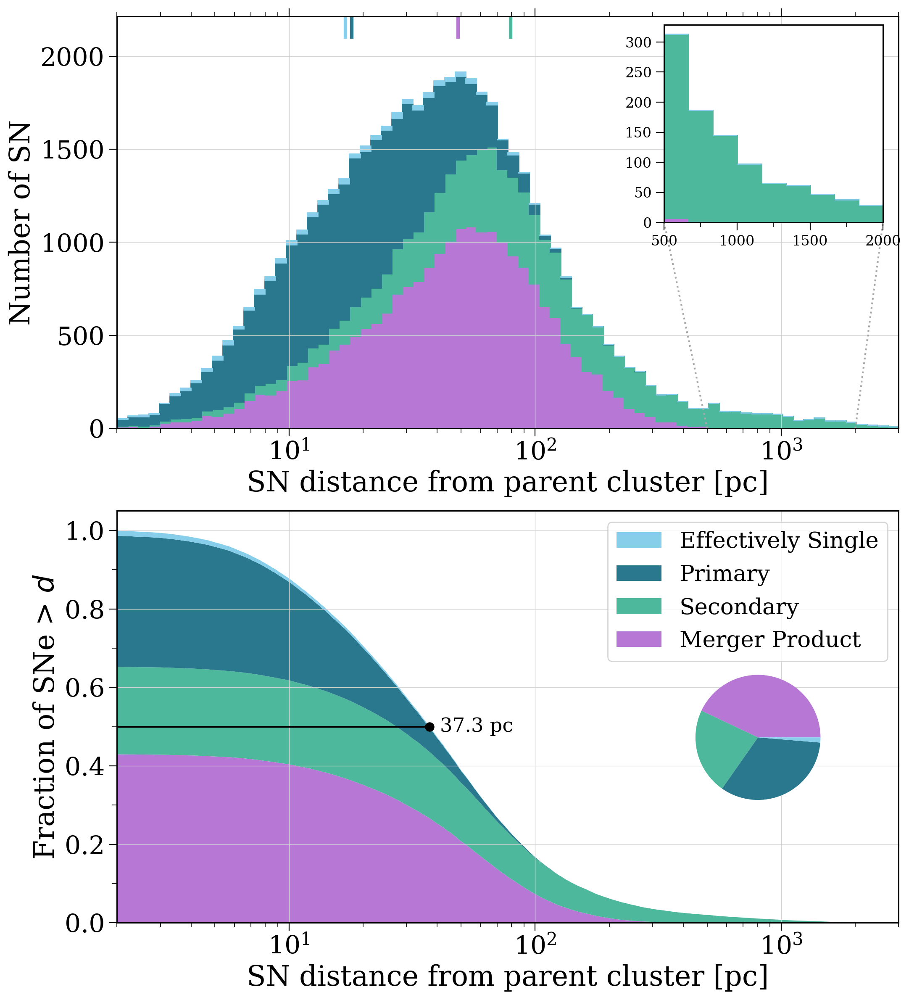

(<Figure size 1200x1400 with 3 Axes>,
 array([<Axes: xlabel='SN distance from parent cluster [pc]', ylabel='Number of SN'>,
        <Axes: xlabel='SN distance from parent cluster [pc]', ylabel='Fraction of SNe > $d$'>],
       dtype=object))

In [61]:
reload(plotting)
plotting.sandpile(p, bins=np.geomspace(2e0, 3e3, 75), inset_n_bins=10, save_path="../plots/sn_dists_fiducial.pdf")

# Ejecta mass

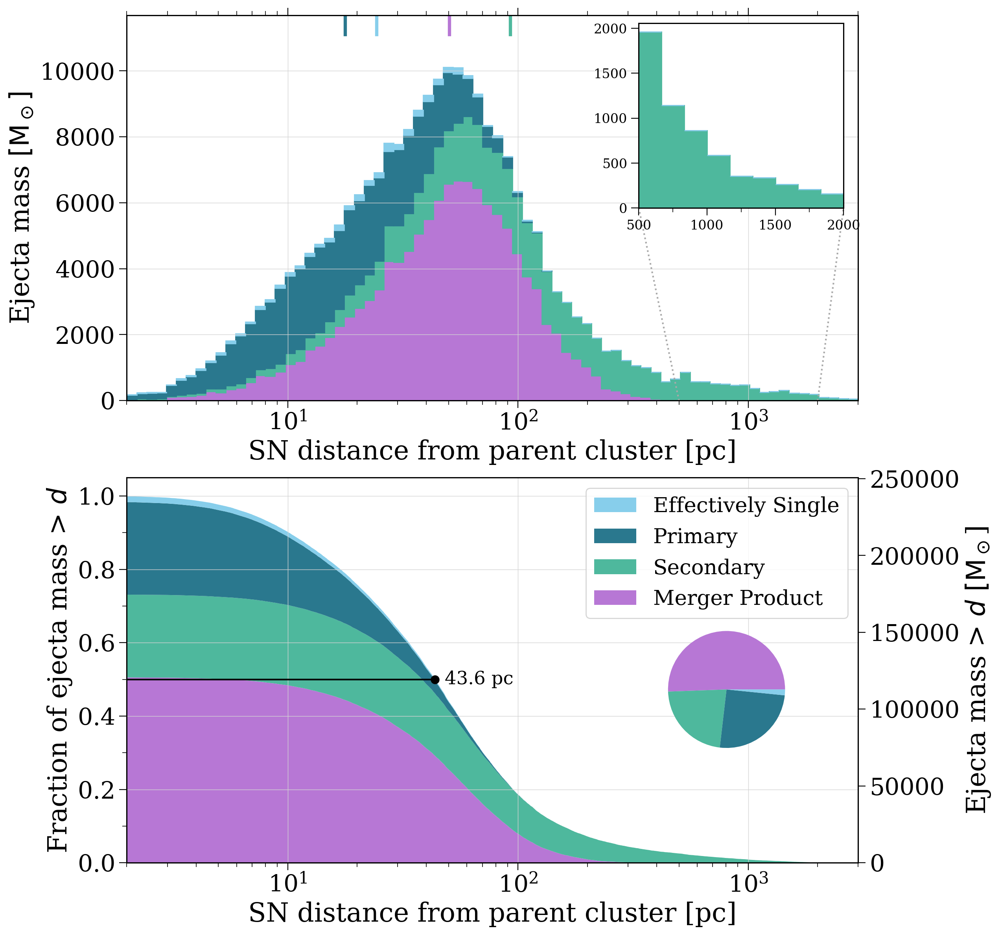

(<Figure size 1200x1400 with 4 Axes>,
 array([<Axes: xlabel='SN distance from parent cluster [pc]', ylabel='Ejecta mass $[\\rm M_\\odot]$'>,
        <Axes: xlabel='SN distance from parent cluster [pc]', ylabel='Fraction of ejecta mass > $d$'>],
       dtype=object))

In [62]:
plotting.sandpile(p, bins=np.geomspace(2e0, 3e3, 75), inset_n_bins=10, var="ejecta_mass")

# Times

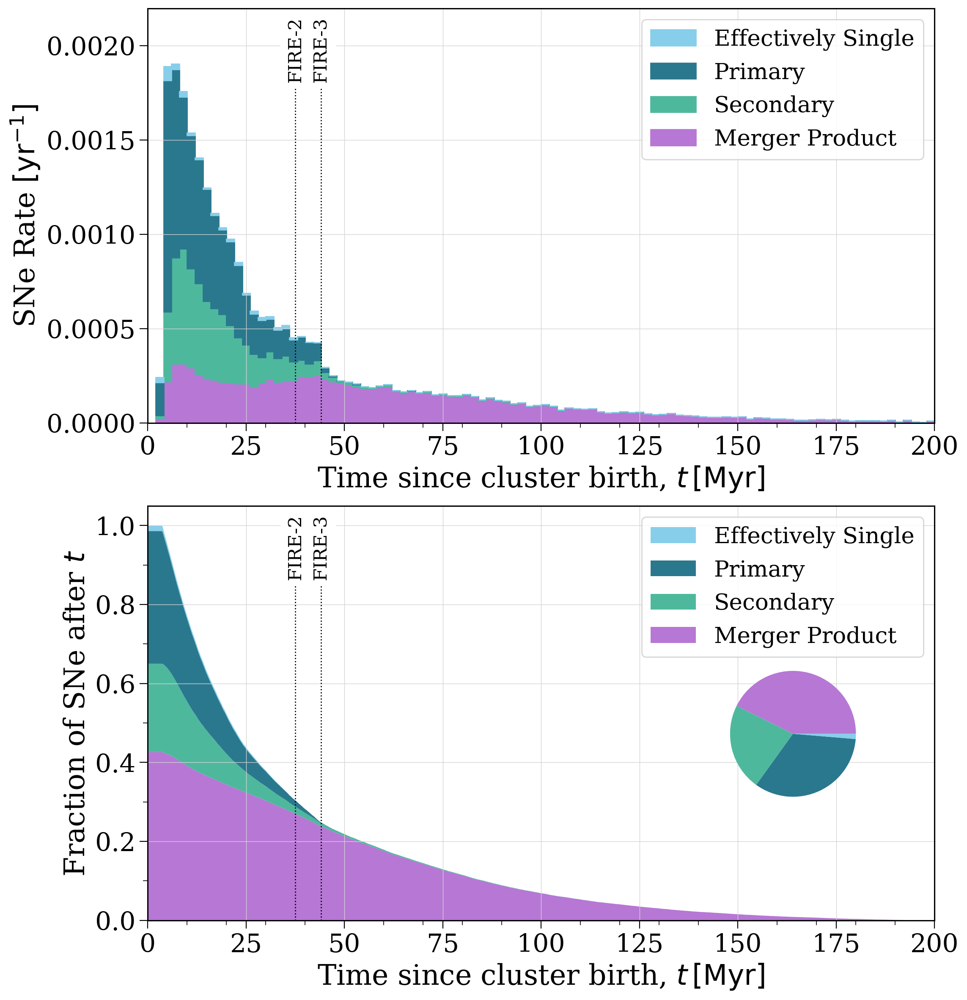

(<Figure size 1200x1400 with 2 Axes>,
 array([<Axes: xlabel='Time since cluster birth, $t \\, [\\rm Myr]$', ylabel='SNe Rate $\\rm [yr^{-1}]$'>,
        <Axes: xlabel='Time since cluster birth, $t \\, [\\rm Myr]$', ylabel='Fraction of SNe after $t$'>],
       dtype=object))

In [63]:
reload(plotting)
plotting.sandpile(p, bins=np.linspace(0, 2e2, 101), var="time",
                  FIRE_lines=[(37.53, "FIRE-2"), (44, "FIRE-3")],
                  save_path="../plots/sn_times_fiducial.pdf")

# 2D distributions

In [17]:
sn_rows_1 = p.bpp[p.bpp["evol_type"] == 15]
sn_rows_2 = p.bpp[p.bpp["evol_type"] == 16]

In [18]:
sn_times_1 = sn_rows_1["tphys"]
sn_times_2 = sn_rows_2["tphys"]

In [64]:
sn_type_1 = np.repeat("primary", len(sn_times_1))
sn_type_1[p.sn_1_merger] = "merger"
sn_type_1[p.sn_1_singles] = "single"

sn_type_2 = np.repeat("secondary", len(sn_times_2))
sn_type_2[p.sn_2_merger] = "merger"

In [65]:
colours = plotting.colours.copy()
colours[1] = "#67C1AA"
colours[2] = "#2a788e"

In [66]:
ro = np.random.permutation(len(sn_times_1) + len(sn_times_2))

sn_times = np.concatenate((sn_times_1, sn_times_2))[ro]
sn_dists = np.concatenate((p.primary_sn_distances, p.secondary_sn_distances)).to(u.pc)[ro]
sn_types = np.concatenate((sn_type_1, sn_type_2))[ro]
sn_colours = np.repeat("#2a788e", len(sn_types)).astype(str)
for i, t in enumerate(["merger", "secondary", "primary", "single"]):
    sn_colours[sn_types == t] = colours[i]

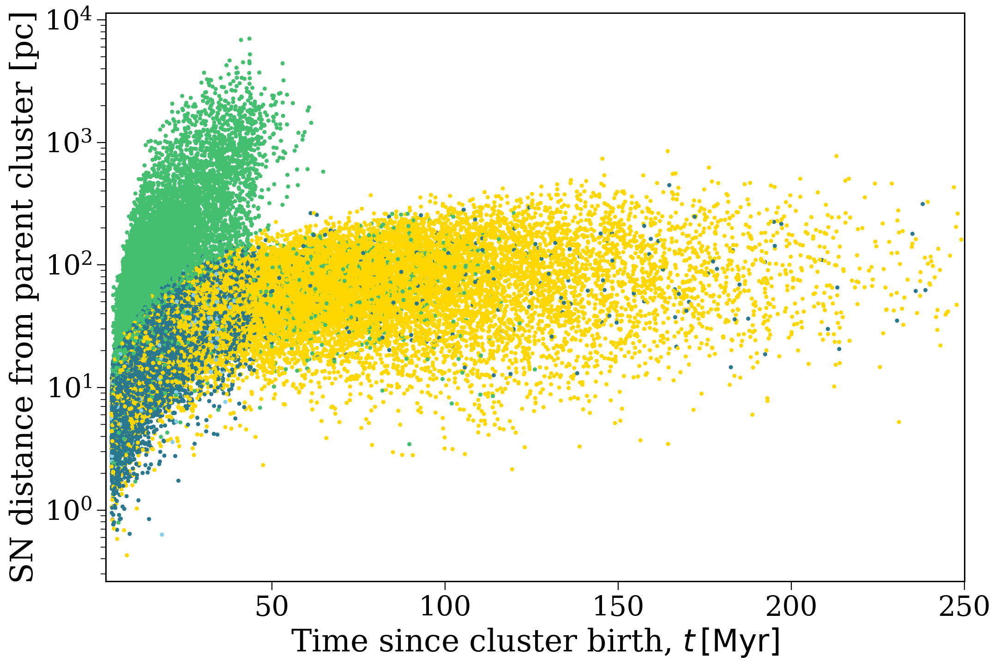

In [31]:
fig, ax = plt.subplots()

ax.scatter(sn_times, sn_dists, c=sn_colours, s=5)
ax.set(yscale="log", xlim=(2, 250), xlabel=plotting.xlabel["time"], ylabel=plotting.xlabel["distance"])

plt.show()

In [32]:
import seaborn as sns

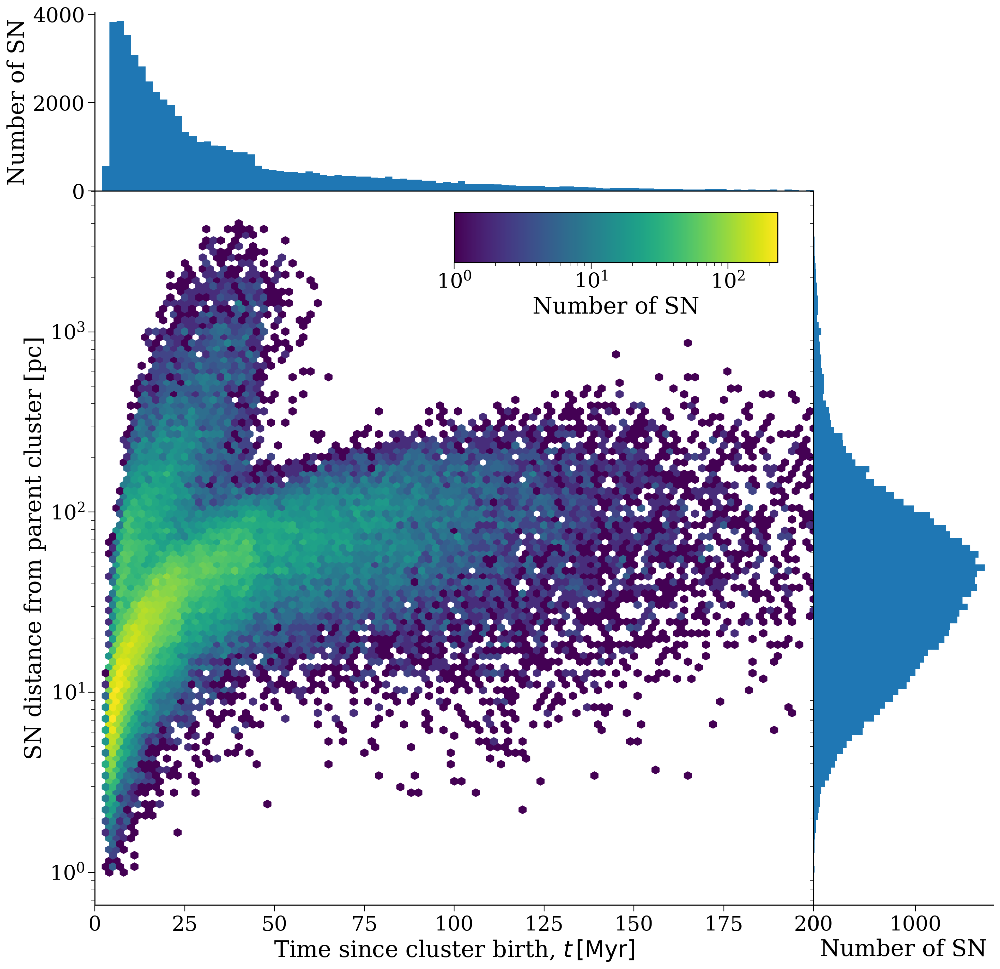

In [36]:
fig, axes = plt.subplots(2, 2, figsize=(17, 17), gridspec_kw={'height_ratios': [1, 4], 'width_ratios': [4, 1]})

fig.subplots_adjust(wspace=0.0, hspace=0.0)

axes[0, 0].hist(sn_times, bins=np.linspace(0, 200, 100))
axes[1, 1].hist(sn_dists.value, bins=np.geomspace(1e0, 4e3, 100), orientation="horizontal")

hexbin = axes[1, 0].hexbin(sn_times, sn_dists, yscale="log", gridsize=100, bins="log", extent=(0, 200, 0, np.log10(4e3)))

inset_ax = axes[1, 0].inset_axes([0.5, 0.9, 0.45, 0.07])
fig.colorbar(hexbin, cax=inset_ax, orientation='horizontal', label="Number of SN")

axes[0, 0].set(xlim=(0, 200), ylabel=plotting.top_ylabel["distance"], xticks=[])
axes[0, 0].spines[['right', 'top']].set_visible(False)
axes[0, 1].axis("off")
axes[1, 0].set(yscale="log", xlim=(0, 200), xlabel=plotting.xlabel["time"], ylabel=plotting.xlabel["distance"])
axes[1, 1].set(yscale="log", xlabel=plotting.top_ylabel["distance"], yticks=[])
axes[1, 1].spines[['right', 'top']].set_visible(False)

plt.show()

#B777D5
#67C1AA
#2a788e
skyblue


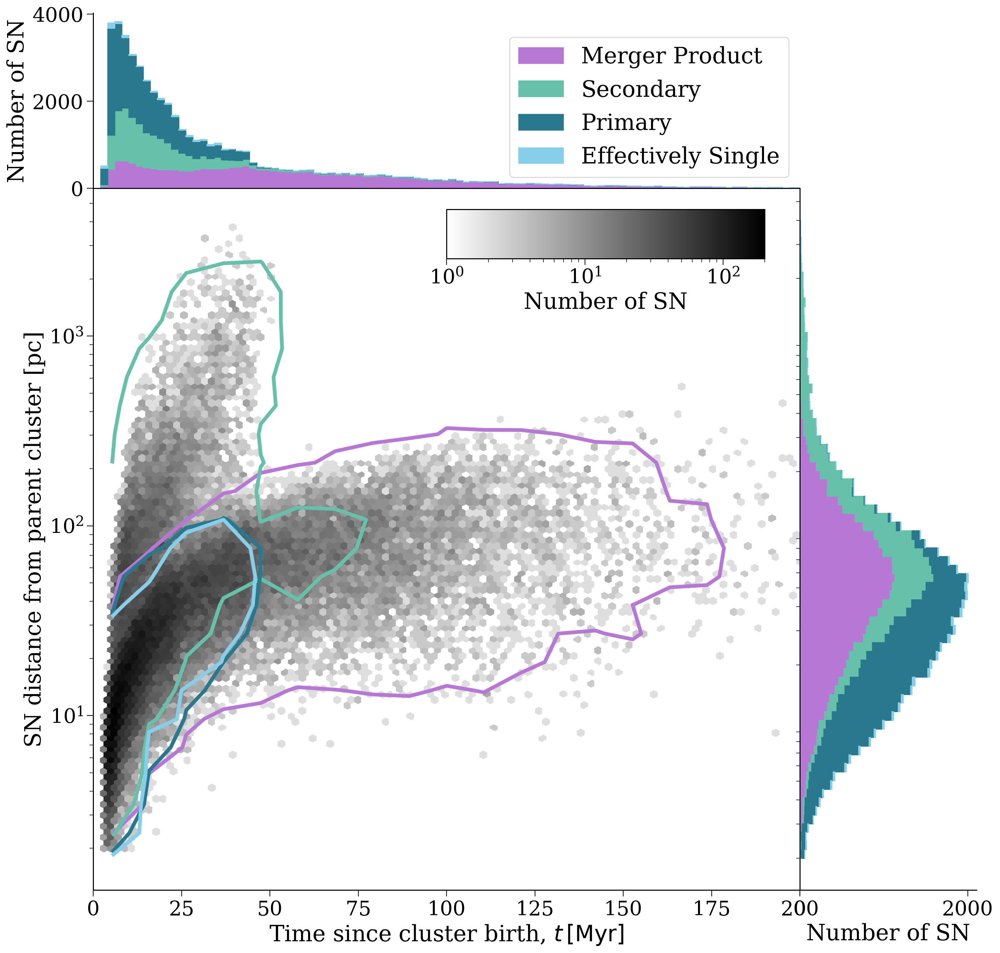

In [67]:
fig, axes = plt.subplots(2, 2, figsize=(17, 17), gridspec_kw={'height_ratios': [1, 4], 'width_ratios': [4, 1]})

fig.subplots_adjust(wspace=0.0, hspace=0.0)

for colour in colours:
    
    print(colour)
    x = sn_times[sn_colours == colour]
    y = sn_dists.value[sn_colours == colour]
    
    xedges = np.linspace(0, 200, 20)
    yedges = np.geomspace(1, 4e3, 25)
    
    hist, xedges, yedges = np.histogram2d(x, y, bins=[xedges, yedges])    
    hist_norm = hist / np.sum(hist)

    # flatten the histogram and sort it in descending order
    hist_flat = hist_norm.flatten()
    hist_sorted = np.sort(hist_flat)[::-1]

    # compute the cumulative sum
    cumulative_sum = np.cumsum(hist_sorted)

    # find the 50% contour level
    contour_level = hist_sorted[np.searchsorted(cumulative_sum, 0.95)]

    # create meshgrid for the histogram
    xcenters = (xedges[:-1] + xedges[1:]) / 2
    ycenters = (yedges[:-1] + yedges[1:]) / 2
    X, Y = np.meshgrid(xcenters, ycenters)

    axes[1, 0].contour(X, Y, hist_norm.T, levels=[contour_level], colors=colour, linewidths=4)
    
patches = axes[0, 0].hist([sn_times[sn_colours == colour] for colour in colours], stacked=True,
                          bins=np.linspace(0, 201, 101), color=colours,
                          label=plotting.labels, rasterized=True)[-1]
plotting.remove_white_stripes(patches)
patches = axes[1, 1].hist([sn_dists.value[sn_colours == colour] for colour in colours],
                          stacked=True, bins=np.geomspace(2e0, 4e3, 75),
                          orientation="horizontal", color=colours, rasterized=True)[-1]
plotting.remove_white_stripes(patches)

axes[0, 0].legend(fontsize=fs, loc="lower right")

hexbin = axes[1, 0].hexbin(sn_times, sn_dists, yscale="log", gridsize=100,
                           bins="log", extent=(3, 200, np.log10(2e0), np.log10(4e3)),
                           cmap="binary", rasterized=True)

inset_ax = axes[1, 0].inset_axes([0.5, 0.9, 0.45, 0.07])
fig.colorbar(hexbin, cax=inset_ax, orientation='horizontal', label="Number of SN")

axes[0, 0].set(xlim=(0, 200), ylabel=plotting.top_ylabel["distance"], xticks=[])
axes[0, 0].spines[['right', 'top']].set_visible(False)
axes[0, 1].axis("off")
axes[1, 0].set(yscale="log", xlim=(0, 200), xlabel=plotting.xlabel["time"], ylabel=plotting.xlabel["distance"])
axes[1, 1].set(yscale="log", xlabel=plotting.top_ylabel["distance"], yticks=[])
axes[1, 1].spines[['right', 'top']].set_visible(False)

plt.savefig("../plots/time_dist_2d.pdf", format="pdf", dpi=300, bbox_inches="tight")

plt.show()

# Fractions

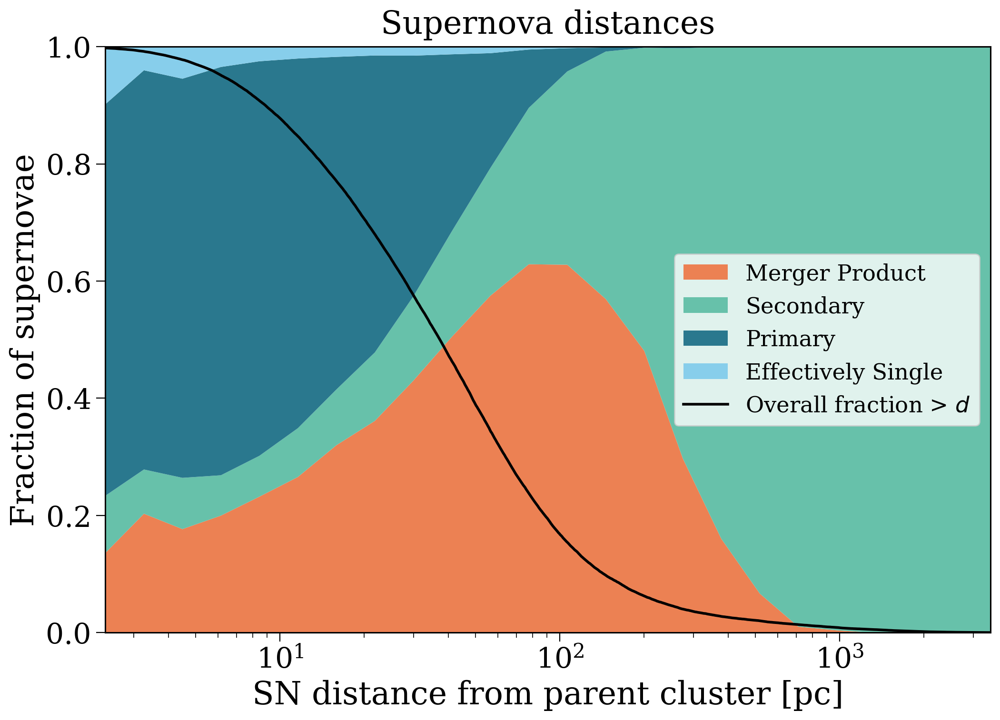

In [27]:
fig, ax = plt.subplots()

bins = np.geomspace(2e0, 4e3, 25)
bin_centres, widths = plotting.get_centres_widths(bins)

data, weights = plotting.get_data_and_weights(p, "distance")

hists = np.array([np.histogram(d, weights=w, bins=bins)[0].astype(float) for d, w in zip(data, weights)])
norm_hists = hists / hists.sum(axis=0)

bottom = np.zeros(hists.shape[1])
for h, c, l in zip(norm_hists, plotting.colours, plotting.labels):
    ax.fill_between(x=bin_centres, y1=bottom, y2=h + bottom, color=c, label=l, lw=0)
    bottom += h
    
detail_bins = np.geomspace(bins[0], bins[-1], 1000)
detail_bin_centres, _ = plotting.get_centres_widths(detail_bins)

hists = np.array([np.histogram(d, bins=detail_bins)[0].astype(float) for d in data])
chist = np.sum([np.sum(h) - np.cumsum(h) for h in hists], axis=0)
chist /= chist[0]

ax.plot(detail_bin_centres, chist, color="black", lw=2, label=r"Overall fraction > $d$")
    
ax.set(xscale="log", xlim=bin_centres[[0, -1]], ylim=(0, 1),
       xlabel=plotting.xlabel["distance"], ylabel="Fraction of supernovae")
ax.legend(loc="center right", fontsize=0.7*fs)
ax.set_title("Supernova distances", fontsize=fs, pad=10)
plt.show()

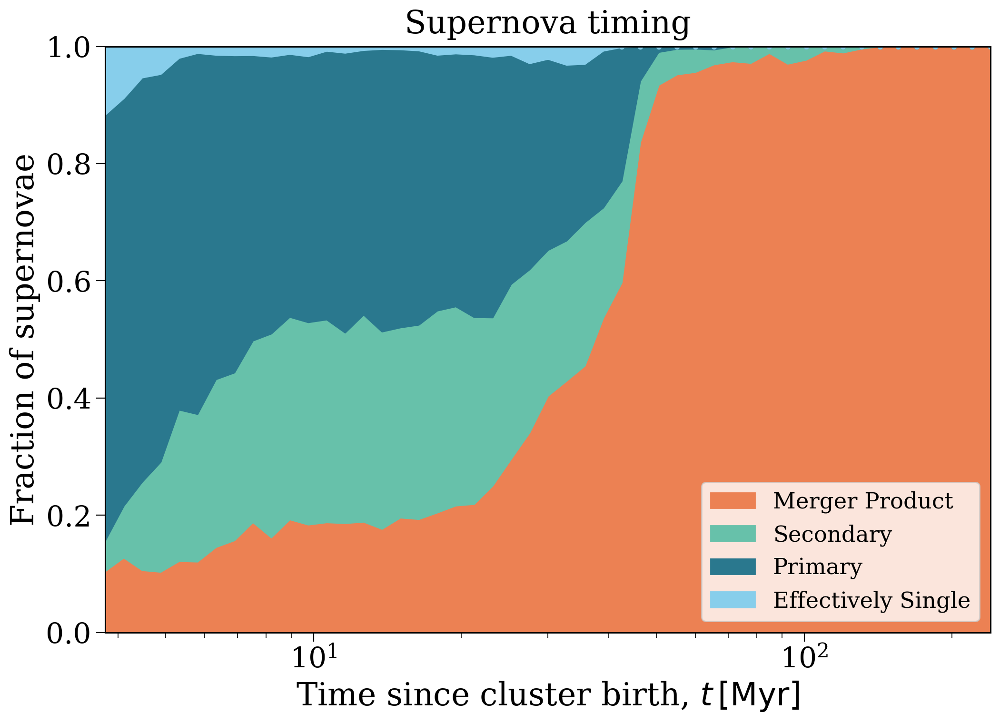

In [28]:
fig, ax = plt.subplots()

bins = np.geomspace(3.6, 250, 50)
bin_centres, widths = plotting.get_centres_widths(bins)

data, weights = plotting.get_data_and_weights(p, "time", widths)

hists = np.array([np.histogram(d, weights=w, bins=bins)[0].astype(float) for d, w in zip(data, weights)])
norm_hists = hists / hists.sum(axis=0)

bottom = np.zeros(hists.shape[1])
for h, c, l in zip(norm_hists, plotting.colours, plotting.labels):
    ax.fill_between(x=bin_centres, y1=bottom, y2=h + bottom, color=c, label=l, lw=1)
    ax.scatter(bin_centres, h + bottom, color=c, marker="o", s=10)
    bottom += h
ax.set(xscale="log", xlim=bin_centres[[0, -1]], ylim=(0, 1),
       xlabel=plotting.xlabel["time"], ylabel="Fraction of supernovae")
ax.set_title("Supernova timing", fontsize=fs, pad=10)
ax.legend(loc="lower right", fontsize=0.7*fs)
plt.show()

# Effectively single stuff

In [15]:
no_rlof = p[p.bin_nums[~np.isin(p.bin_nums, p.bpp[(p.bpp["evol_type"] >= 3) & (p.bpp["evol_type"] <= 8)]["bin_num"].unique())]]

In [16]:
def get_relative_mass_gain(p, which_star="mass_1"):
    mass_change = p.bpp.groupby("bin_num")[which_star].diff().fillna(0.0)
    mass_change[mass_change < 0] = 0
    relative_mass_gain = mass_change.groupby(mass_change.index).sum() / p.initC[which_star]
    return relative_mass_gain * 100

(array([1.2329e+04, 2.6100e+02, 1.3300e+02, 7.4000e+01, 7.0000e+01,
        3.3000e+01, 2.2000e+01, 8.0000e+00, 5.0000e+00, 1.0000e+00]),
 array([0.        , 0.17499994, 0.34999989, 0.52499983, 0.69999977,
        0.87499972, 1.04999966, 1.2249996 , 1.39999955, 1.57499949,
        1.74999943]),
 <BarContainer object of 10 artists>)

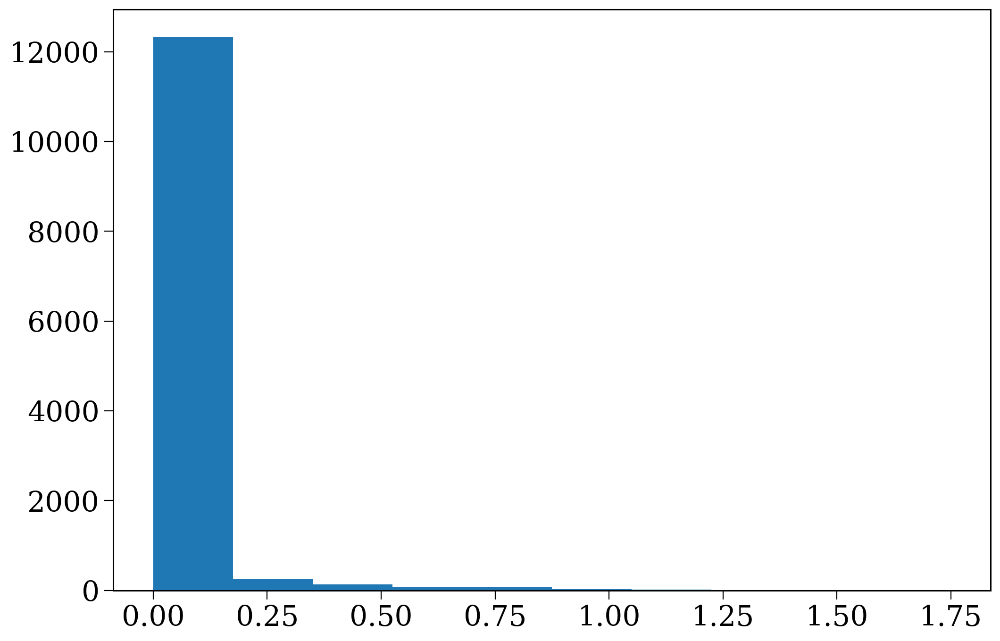

In [17]:
plt.hist(get_relative_mass_gain(no_rlof))

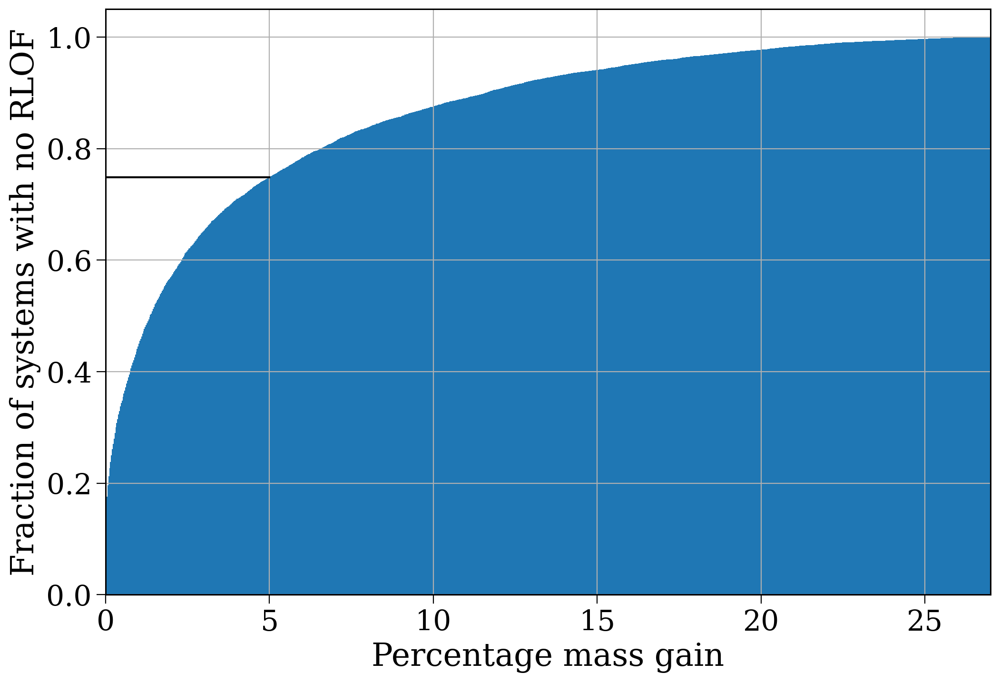

In [18]:
fig, ax = plt.subplots()

rmg = get_relative_mass_gain(no_rlof, "mass_2")
ax.hist(rmg, bins=1000, cumulative=True, density=True)
ax.plot([0, 5], [1 - len(rmg[rmg > 5]) / len(rmg), 1 - len(rmg[rmg > 5]) / len(rmg)], color="black")

ax.set(xlabel="Percentage mass gain", ylabel="Fraction of systems with no RLOF", xlim=(0, 27))

ax.grid()

plt.show()

In [19]:
def non_interacting_fraction(p):
    rlof_nums = p.bpp[(p.bpp["evol_type"] >= 3) & (p.bpp["evol_type"] <= 8)]["bin_num"].unique()
    interaction_nums = np.concatenate((rlof_nums, p.bpp["bin_num"][(p.bpp.groupby("bin_num")["mass_1"].diff().fillna(0.0) > 0.0)
                                                                   | (p.bpp.groupby("bin_num")["mass_2"].diff().fillna(0.0) > 0.0)].unique()))
    return 1 - len(np.unique(rlof_nums)) / len(p)

In [20]:
non_interacting_fraction(p)

0.17027774121363692

# RLOF stellar type

In [112]:
rlof_rows = p.bpp[p.bpp["evol_type"] == 3].copy()
rlof_onto_2 = rlof_rows[rlof_rows["RRLO_1"] >= 1.0]
rlof_onto_1 = rlof_rows[rlof_rows["RRLO_2"] >= 1.0]

for rows, label, key in zip([rlof_onto_2, rlof_onto_1], ["secondary", "primary"], ["kstar_2", "kstar_1"]):
    print(f"RLOF onto {label} ({len(rows)} RLOF events)")
    init_stuff = p.initC.loc[rows.bin_num]
    init_q = init_stuff["mass_2"] / init_stuff["mass_1"]
    rlof_kstars = rows[key].value_counts()
    for i in range(len(rlof_kstars)):
        print(f'\t{cogsworth.utils.kstar_translator[rlof_kstars.index[i].astype(int)]["short"]}      \t{rlof_kstars.values[i] / len(rlof_onto_2) * 100:1.2f}%\t{np.mean(init_q[rows[key] == rlof_kstars.index[i]]):1.3f}')

RLOF onto secondary (83950 RLOF events)
	MS      	95.18%	0.572
	MS < 0.7      	2.07%	0.128
	COWD      	0.96%	0.870
	CHeB      	0.86%	0.967
	HeMS      	0.33%	0.830
	NS      	0.23%	0.908
	ONeWD      	0.16%	0.927
	HG      	0.09%	0.934
	HeHG      	0.03%	0.874
	EAGB      	0.03%	0.998
	FGB      	0.02%	0.943
	BH      	0.02%	0.561
	TPAGB      	0.01%	0.999
RLOF onto primary (28195 RLOF events)
	HeMS      	13.76%	0.804
	COWD      	12.13%	0.649
	ONeWD      	3.68%	0.636
	NS      	2.07%	0.631
	HeHG      	1.13%	0.775
	BH      	0.64%	0.653
	CHeB      	0.09%	0.697
	MS      	0.06%	0.815
	HG      	0.02%	0.782
	HeGB      	0.00%	0.879
	TPAGB      	0.00%	1.000


In [302]:
rlof_rows = p.bpp[p.bpp["evol_type"] == 3].copy()
rlof_onto_2 = rlof_rows[rlof_rows["RRLO_1"] >= 1.0]
rlof_onto_1 = rlof_rows[rlof_rows["RRLO_2"] >= 1.0]

for rows, label, key in zip([rlof_onto_2, rlof_onto_1], ["secondary", "primary"], ["kstar_1", "kstar_2"]):
    print(f"RLOF onto {label} ({len(rows)} RLOF events)")
    init_stuff = p.initC.loc[rows.bin_num]
    init_q = init_stuff["mass_2"] / init_stuff["mass_1"]
    rlof_kstars = rows[key].value_counts()
    for i in range(len(rlof_kstars)):
        print(f'\t{cogsworth.utils.kstar_translator[rlof_kstars.index[i].astype(int)]["short"]}      \t{rlof_kstars.values[i] / len(rlof_onto_2) * 100:1.2f}%\t{np.mean(init_q[rows[key] == rlof_kstars.index[i]]):1.3f}')

RLOF onto secondary (83950 RLOF events)
	HG      	38.61%	0.583
	MS      	23.81%	0.558
	HeHG      	18.05%	0.575
	EAGB      	7.05%	0.551
	FGB      	6.11%	0.548
	TPAGB      	5.21%	0.592
	CHeB      	0.88%	0.563
	HeGB      	0.14%	0.791
	COWD      	0.07%	0.814
	HeMS      	0.04%	0.886
	BH      	0.02%	0.561
	NS      	0.01%	0.679
	ONeWD      	0.01%	0.630
RLOF onto primary (28195 RLOF events)
	HG      	20.04%	0.705
	HeHG      	4.06%	0.747
	FGB      	3.40%	0.721
	MS      	2.84%	0.681
	HeMS      	2.03%	0.728
	TPAGB      	0.70%	0.845
	CHeB      	0.37%	0.796
	COWD      	0.08%	0.678
	EAGB      	0.03%	0.637
	MS < 0.7      	0.03%	0.133
	ONeWD      	0.01%	0.524
	NS      	0.01%	0.733
	BH      	0.01%	0.929
	HeGB      	0.00%	0.834


# CE Information

In [160]:
ce_rows = p.bpp[p.bpp["evol_type"] == 7].copy()
kstars = [4]
ce_rows = p.bpp[(p.bpp["evol_type"] == 3) & (((p.bpp["RRLO_1"] >= 1) & (p.bpp["kstar_1"].isin(kstars))) | ((p.bpp["RRLO_2"] >= 1) & (p.bpp["kstar_2"].isin(kstars))))].copy()
first_ce = ce_rows.drop_duplicates(subset="bin_num", keep="first")
second_ce = ce_rows.drop_duplicates(subset="bin_num", keep="last")

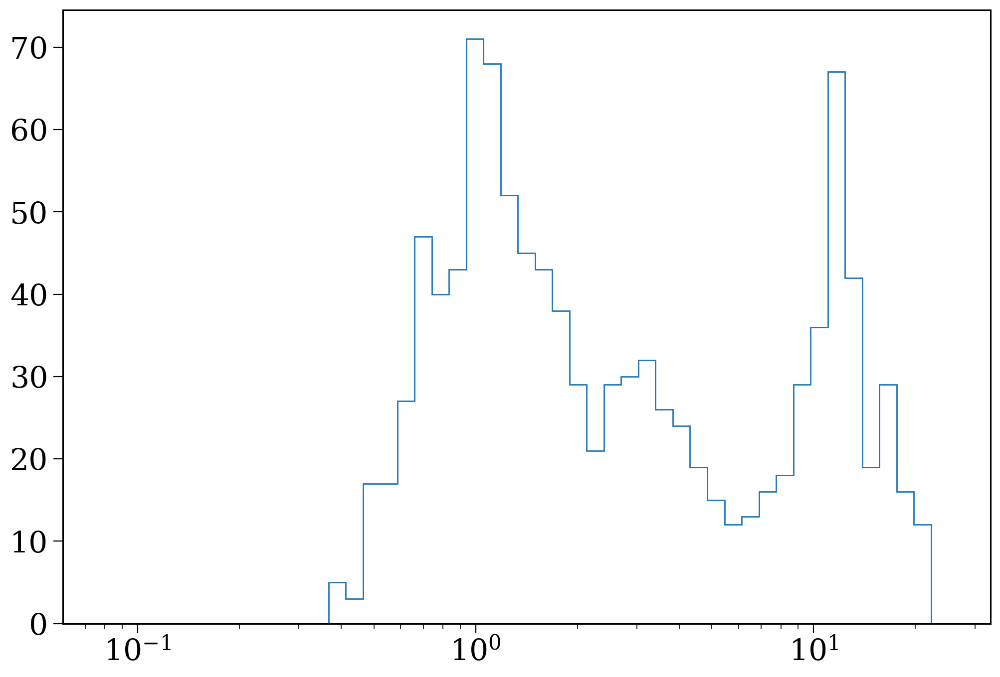

In [161]:
for rows in [ce_rows]:
    ce_donor_mass = np.where(rows["RRLO_1"] > 1, rows["mass_1"], rows["mass_2"])
    ce_accretor_mass = np.where(rows["RRLO_1"] > 1, rows["mass_2"], rows["mass_1"])
    q = ce_donor_mass / ce_accretor_mass
    plt.hist(q, bins=np.geomspace(0.08, 25, 50), histtype="step");
plt.xscale('log')
plt.show()

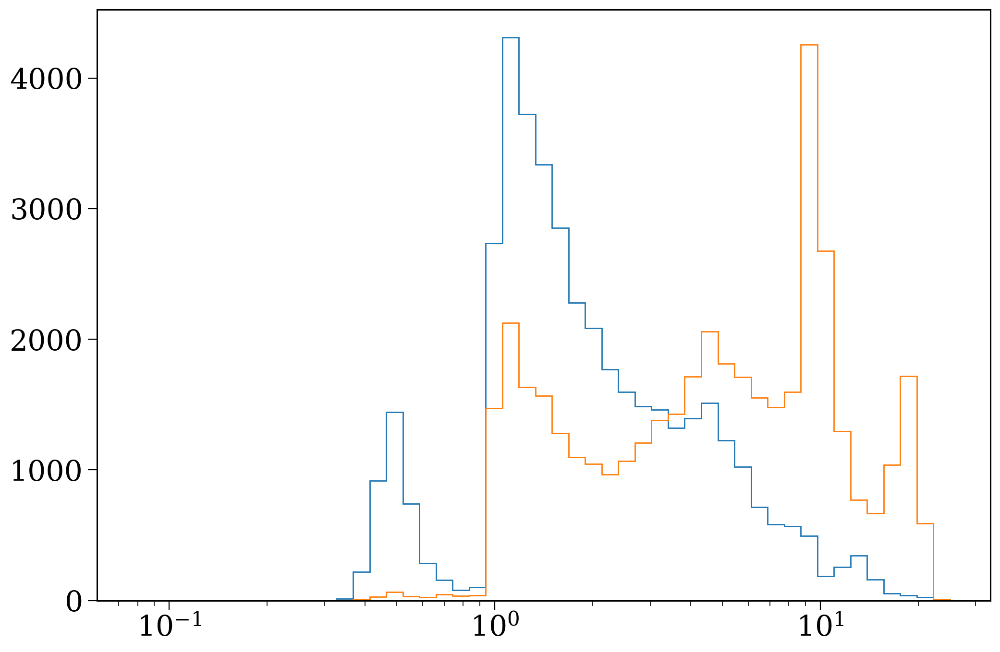

In [154]:
for rows in [first_ce, second_ce]:
    ce_donor_mass = np.where(rows["RRLO_1"] > 1, rows["mass_1"], rows["mass_2"])
    ce_accretor_mass = np.where(rows["RRLO_1"] > 1, rows["mass_2"], rows["mass_1"])
    q = ce_donor_mass / ce_accretor_mass
    plt.hist(q, bins=np.geomspace(0.08, 25, 50), histtype="step");
plt.xscale('log')
plt.show()

0.08677802227054428


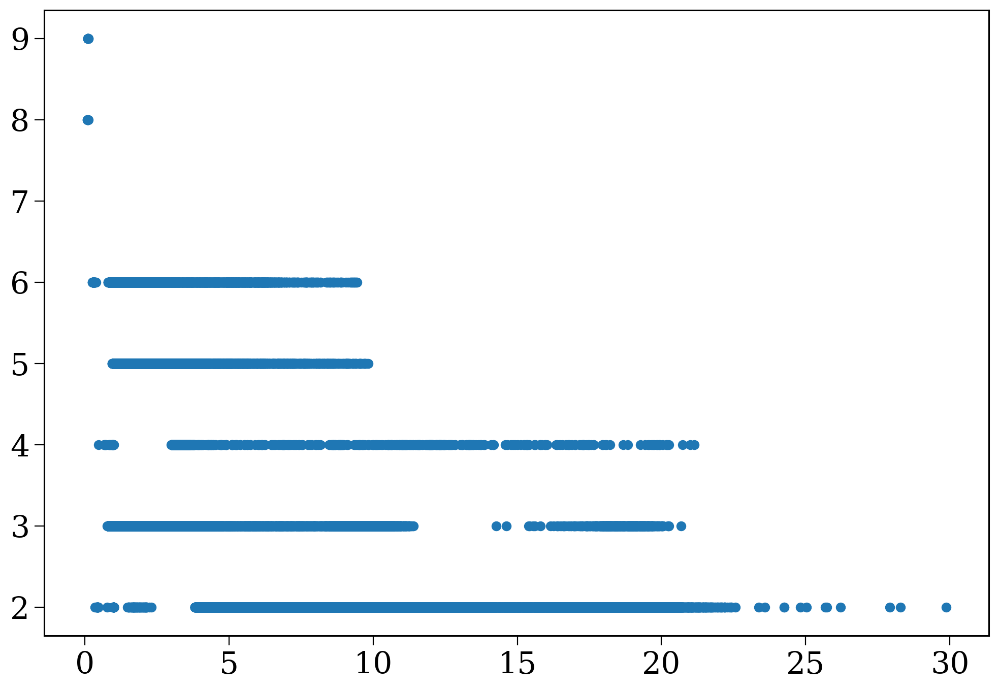

0.08677802227054428


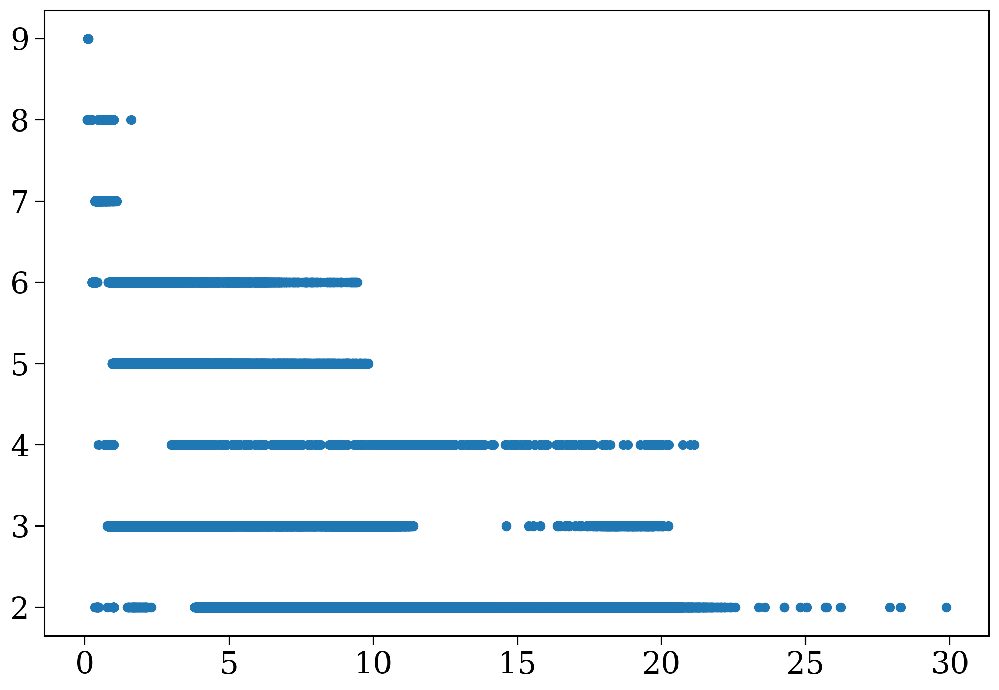

In [150]:
for rows in [first_ce, second_ce]:
    ce_donor_mass = np.where(rows["RRLO_1"] > 1, rows["mass_1"], rows["mass_2"])
    ce_accretor_mass = np.where(rows["RRLO_1"] > 1, rows["mass_2"], rows["mass_1"])
    donor_kstar = np.where(rows["RRLO_1"] > 1, rows["kstar_1"], rows["kstar_2"])
    q = ce_donor_mass / ce_accretor_mass
    print(min(q))
    plt.scatter(ce_donor_mass / ce_accretor_mass, donor_kstar);
    plt.show()

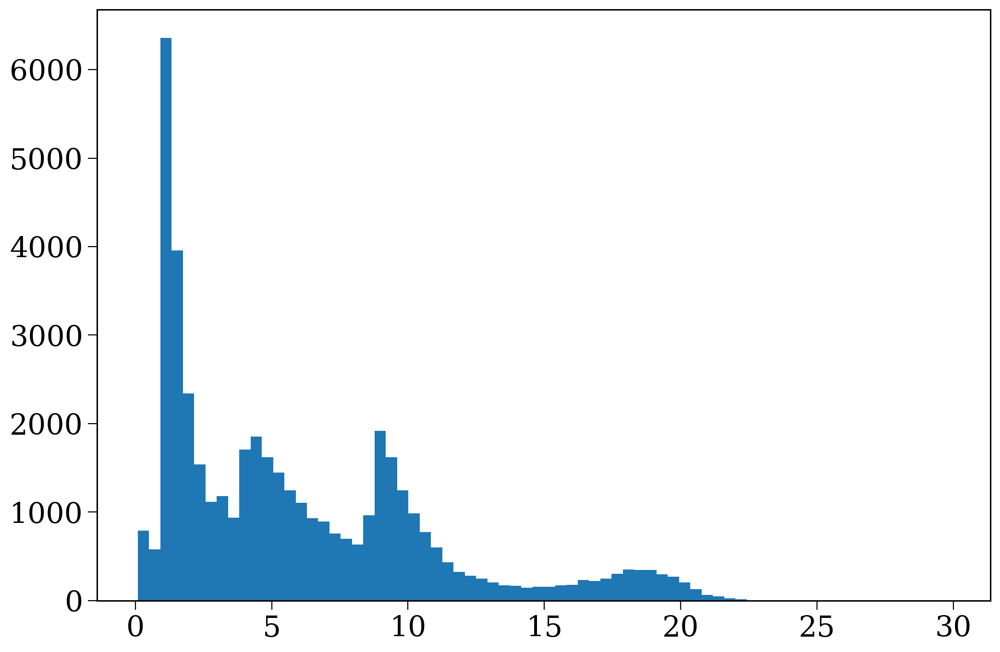

In [122]:
ce_rows["bin_num"].value_counts()

bin_num
205110    2
191949    2
191224    2
605250    2
191233    2
         ..
283806    1
283801    1
283800    1
283797    1
776964    1
Name: count, Length: 39796, dtype: int64

# What's happening with the times

## Mass transfer type

In [46]:
mt_1_type = pd.Series(np.zeros(len(p)), index=p.bin_nums)

kstar_mt_1 = p.bpp[(p.bpp["evol_type"] == 3) & (p.bpp["RRLO_1"] >= 1)].drop_duplicates(subset="bin_num", keep="first")["kstar_1"]

for low, high, t in [(-np.inf, 1, 1), (1, 4, 2), (4, 6, 3)]:
    mt_1_type.loc[kstar_mt_1[(kstar_mt_1 > low) & (kstar_mt_1 <= high)].index] = t

In [52]:
sn_time_1 = p.bpp["tphys"][(p.bpp["evol_type"] == 15) & (~p.bpp["bin_num"].isin(p.duplicate_sn))]
sn_time_2 = p.bpp["tphys"][(p.bpp["evol_type"] == 16) & (~p.bpp["bin_num"].isin(p.duplicate_sn))]

In [47]:
mt_1_type.loc[p.sn_1[p.sn_1].index]

80        2.0
81        0.0
82        2.0
86        0.0
89        0.0
         ... 
776945    0.0
776947    2.0
776958    0.0
776965    2.0
776966    1.0
Length: 17382, dtype: float64

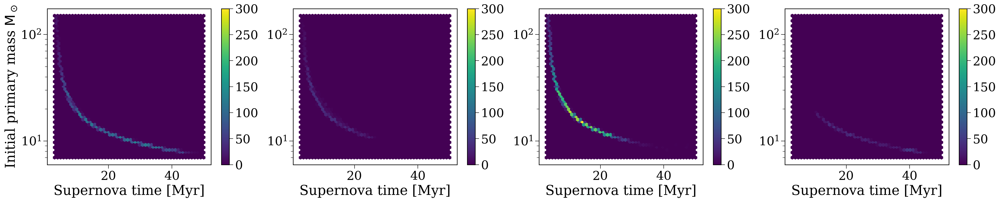

In [383]:
fig, axes = plt.subplots(1, 4, figsize=(30, 5))

start = p.bpp.drop_duplicates(subset='bin_num', keep='first').loc[p.sn_1[p.sn_1].index]
mt = mt_1_type.loc[p.sn_1[p.sn_1].index]

for i, ax in enumerate(axes):
    mask = mt == i
    hexbin = ax.hexbin(sn_time_1[p.sn_1][mask], start["mass_1"][mask], yscale='log', gridsize=50, extent=np.log10((1e3, 1e50, 7, 150)), vmax=300)#, C=np.log10(start["porb"]))
    # hexbin = ax.hexbin(sn_time_1[p.sn_1], start["mass_1"], xscale="log", yscale='log', gridsize=50, C=experienced_mt)
    fig.colorbar(hexbin, ax=ax)
    
    ax.set(xlabel="Supernova time [Myr]", ylabel=r"Initial primary mass $\rm M_\odot$" if i == 0 else "")

plt.show()

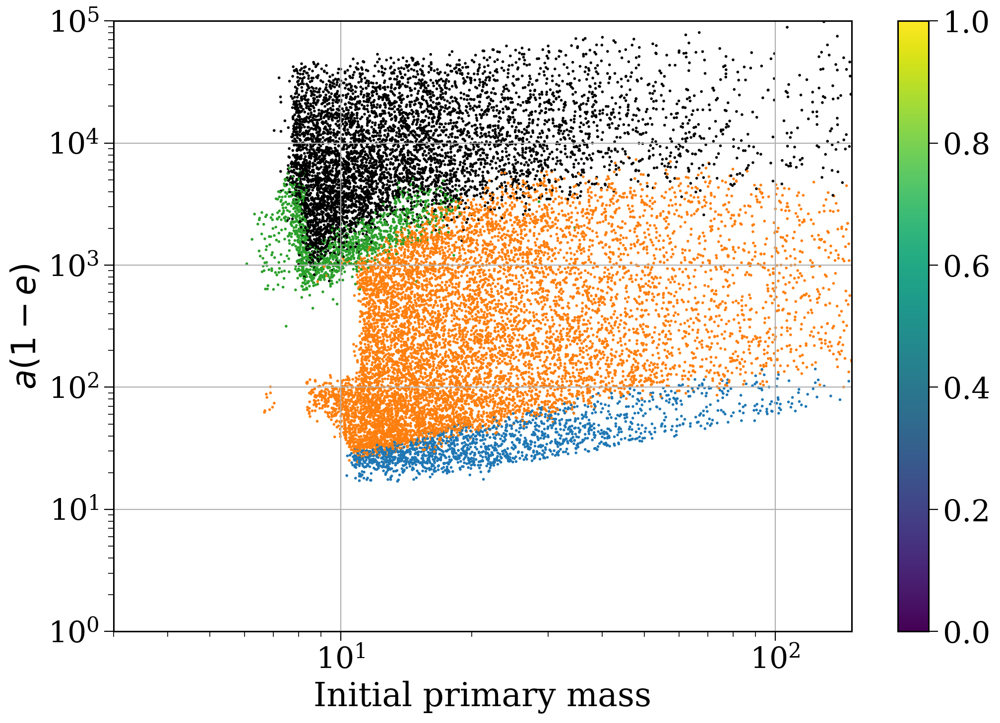

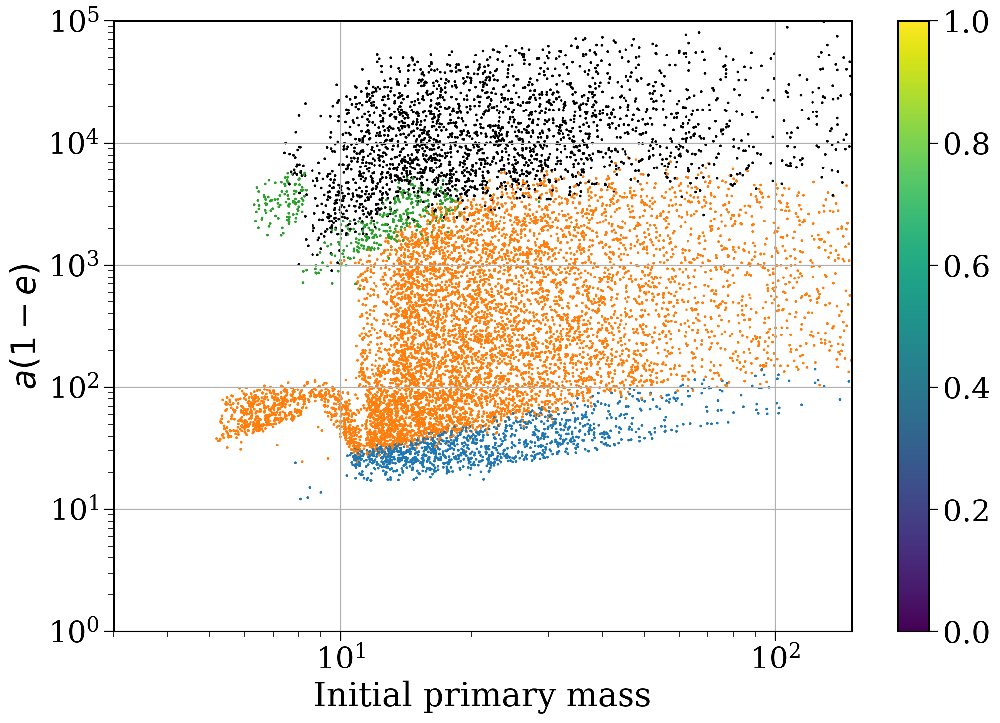

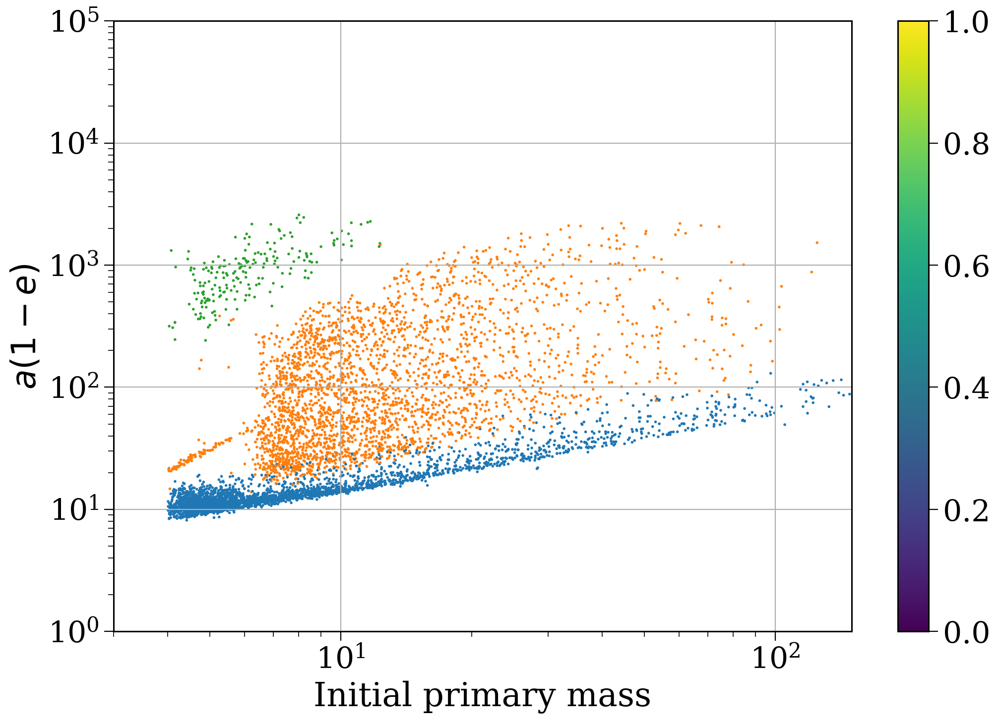

In [599]:
for mask in [p.sn_1, p.sn_2, p.sn_1_merger | p.sn_1_merger]:
    
    start = p.bpp.drop_duplicates(subset='bin_num', keep='first').loc[mask[mask].index]
    mt = mt_1_type.loc[mask[mask].index]
    mt_cols = np.array([f"C{int(i - 1)}" if i > 0 else "black" for i in mt])
    
    fig, ax = plt.subplots()
    
    q = start["mass_2"] / start["mass_1"]
    scatter = ax.scatter(start["mass_1"], start["sep"] * (1 - start["ecc"]), c=mt_cols, s=1)
    fig.colorbar(scatter)
    ax.set(xlabel="Initial primary mass", ylabel=r"$a (1 - e)$", xscale="log", yscale="log", xlim=(3,150), ylim=(1, 1e5))
    # ax.axvline(7)

    ax.grid()
    
    plt.show()

In [48]:
def t_MS(m, Z):
    """ Get the main sequence lifetime of a star with mass m and metallicity Z using Hurley+2000 """
    
    def tBGB(m, Z):
        zeta = np.log10(Z / 0.02)

        a1 = 1.593890e3 + 2.053038e3 * zeta + 1.231226e3 * zeta**2 + 2.327785e2 * zeta**3
        a2 = 2.706708e3 + 1.483131e3 * zeta + 5.772723e2 * zeta**2 + 7.411230e1 * zeta**3
        a3 = 1.466143e2 - 1.048442e2 * zeta - 6.795374e1 * zeta**2 - 1.391127e1 * zeta**3
        a4 = 4.141960e-2 + 4.564888e-2 * zeta + 2.958542e-2 * zeta**2 + 5.571483e-3 * zeta**3
        a5 = 3.426349e-1
        return (a1 + a2 * m**4 + a3 * m**(5.5) + m**7) / (a4 * m**2 + a5 * m**7)
    
    def mu_t(m, Z):
        zeta = np.log10(Z / 0.02)

        a6 = 1.949814e1 + 1.758178e0 * zeta - 6.008212e0 * zeta**2 - 4.470533e0 * zeta**3
        a7 = 4.903830e0
        a8 = 5.212154e-2 + 3.166411e-2 * zeta - 2.750074e-3 * zeta**2 - 2.271549e-3 * zeta**3
        a9 = 1.312179e0 - 3.294936e-1 * zeta + 9.231860e-2 * zeta**2 + 2.610989e-2 * zeta**3
        a10 = 8.073972e-1

        return np.maximum(0.5, 1.0 - 0.01 * np.maximum(a6 / m**a7, a8 + a9 / m**a10))
    
    def x_t(Z):
        zeta = np.log10(Z / 0.02)
        return np.maximum(0.95, np.minimum(0.95 - 0.03 * (zeta + 0.30103), 0.99))
    
    tbgb = tBGB(m, Z)
    return np.maximum(mu_t(m, Z) * tbgb, x_t(Z) * tbgb)

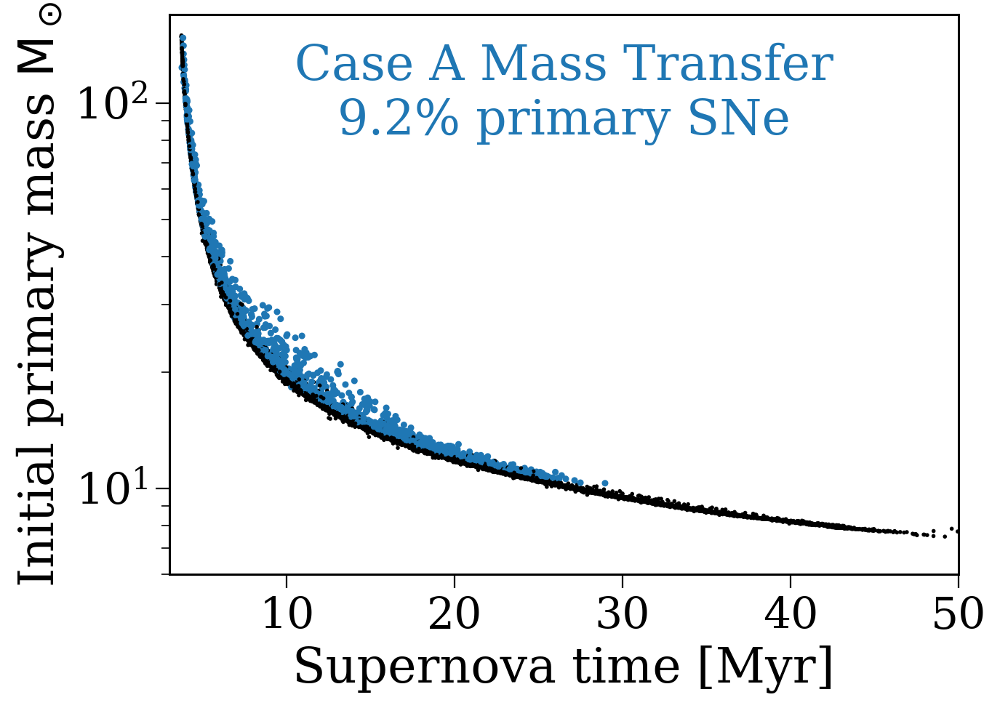

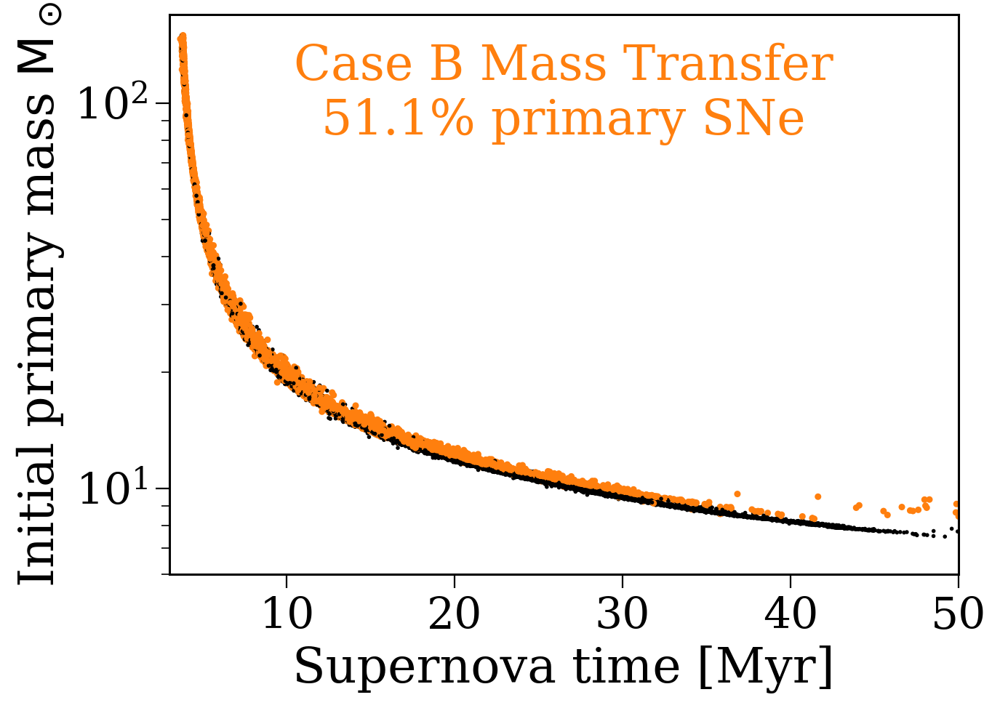

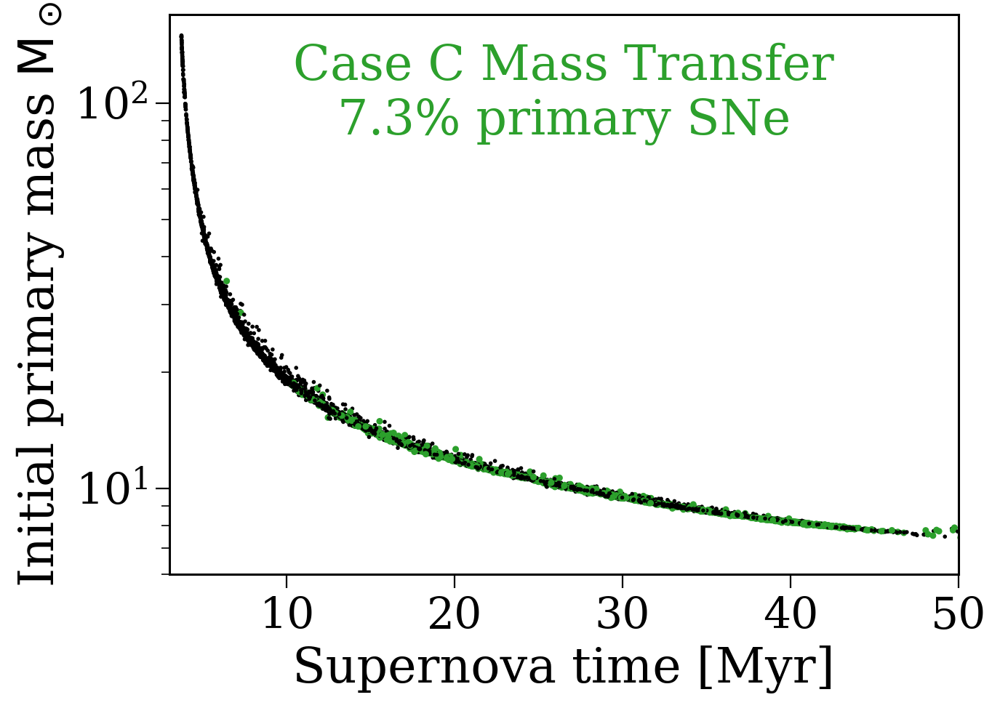

In [53]:
start = p.bpp.drop_duplicates(subset='bin_num', keep='first').loc[p.sn_1[p.sn_1].index]
mt = mt_1_type.loc[p.sn_1[p.sn_1].index]
mt_cols = np.array([f"C{int(i - 1)}" if i > 0 else "black" for i in mt])

m_range = np.geomspace(7, 150, 1000)
lifetimes = t_MS(m_range, p.initC["metallicity"].min()) * 1.1
lifetimes_alt = t_MS(m_range, p.initC["metallicity"].max()) * 1.1

# fig, axes = plt.subplots

for i in range(1, 4):
    
    fig, ax = plt.subplots(figsize=(7, 5))
    
    mask = (mt == 0) | (mt == i)
    
    ax.scatter(sn_time_1[p.sn_1][mask], start["mass_1"][mask], c=mt_cols[mask], s=np.where(mt[mask] == 0, 1, 5))

    ax.annotate(f"Case {chr(ord('A') + i - 1)} Mass Transfer\n{(mt == i).sum() / len(mt) * 100:1.1f}% primary SNe", xy=(0.5, 0.95),
                xycoords="axes fraction", ha="center", va="top", fontsize=fs, color=f"C{i - 1}")
        
    ax.set(xlabel="Supernova time [Myr]", ylabel=r"Initial primary mass $\rm M_\odot$", yscale="log", xlim=(3, 50), ylim=(6, 170))
    
    plt.show()

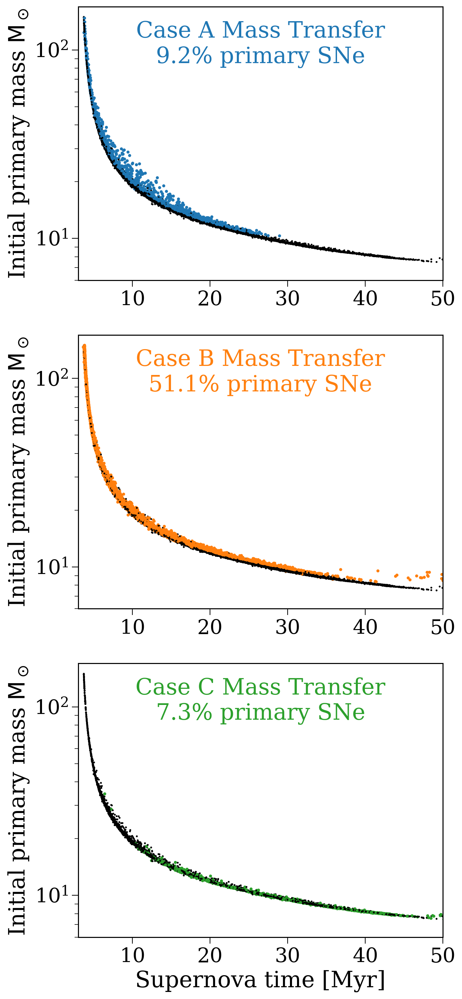

In [64]:
start = p.bpp.drop_duplicates(subset='bin_num', keep='first').loc[p.sn_1[p.sn_1].index]
mt = mt_1_type.loc[p.sn_1[p.sn_1].index]
mt_cols = np.array([f"C{int(i - 1)}" if i > 0 else "black" for i in mt])

fig, axes = plt.subplots(3, 1, figsize=(7, 18))

for i, ax in zip(range(1, 4), axes):
    
    mask = (mt == 0) | (mt == i)
    
    ax.scatter(sn_time_1[p.sn_1][mask], start["mass_1"][mask], c=mt_cols[mask], s=np.where(mt[mask] == 0, 1, 5),
              rasterized=True)

    # mass_range = np.geomspace(7, 150, 100)
    # ax.plot(t_MS(mass_range, 0.02) * 1.05, mass_range, color="grey", linestyle="--")
    # ax.plot(t_MS(mass_range, 0.002) * 1.05, mass_range, color="grey", linestyle="--")

    ax.annotate(f"Case {chr(ord('A') + i - 1)} Mass Transfer\n{(mt == i).sum() / len(mt) * 100:1.1f}% primary SNe", xy=(0.5, 0.95),
                xycoords="axes fraction", ha="center", va="top", fontsize=fs, color=f"C{i - 1}")
        
    ax.set(ylabel=r"Initial primary mass $\rm M_\odot$", yscale="log", xlim=(3, 50), ylim=(6, 170))
axes[-1].set_xlabel("Supernova time [Myr]")

# plt.savefig("../plots/sn1_time_vs_init_mass.pdf", format="pdf", bbox_inches="tight")

plt.show()

In [79]:
sn_times_1.loc[776920]

21.257315888691412

In [78]:
start["mass_1"][mt == 0]

81        19.275850
86         8.178864
89        30.136016
115       10.365212
127        8.413800
            ...    
776918    32.124543
776920    11.371965
776943    22.143389
776945    10.671172
776958     8.847347
Name: mass_1, Length: 5641, dtype: float64

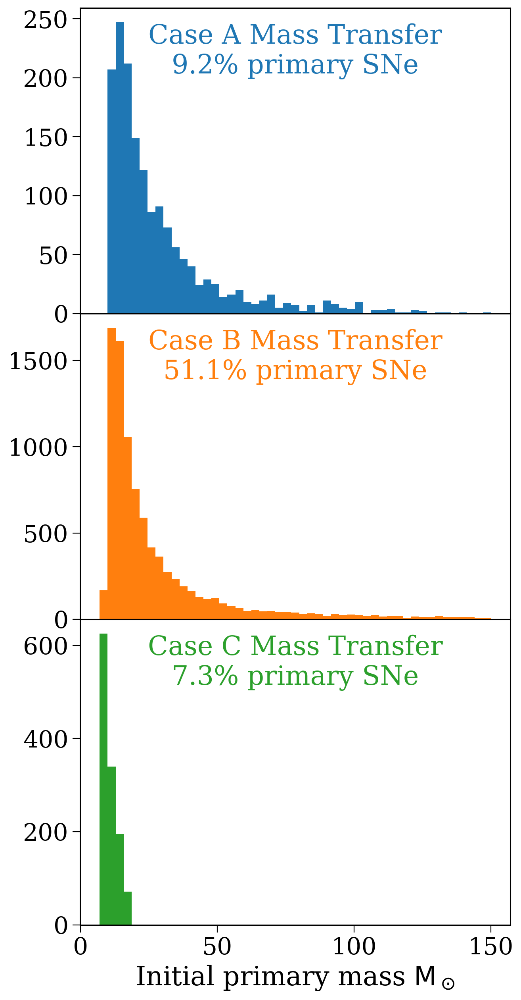

In [394]:
start = p.bpp.drop_duplicates(subset='bin_num', keep='first').loc[p.sn_1[p.sn_1].index]
mt = mt_1_type.loc[p.sn_1[p.sn_1].index]
mt_cols = np.array([f"C{int(i - 1)}" if i > 0 else "black" for i in mt])

fig, axes = plt.subplots(3, 1, figsize=(7, 15), sharex=True)
fig.subplots_adjust(hspace=0.0)

for i, ax in zip(range(1, 4), axes):
    
    mask = mt == i
    
    ax.hist(start["mass_1"][mask], range=(7, 150), bins=np.linspace(7, 150, 50), color=f"C{i - 1}")

    ax.annotate(f"Case {chr(ord('A') + i - 1)} Mass Transfer\n{(mt == i).sum() / len(mt) * 100:1.1f}% primary SNe", xy=(0.5, 0.95),
                xycoords="axes fraction", ha="center", va="top", fontsize=fs, color=f"C{i - 1}")
        
ax.set(xlabel=r"Initial primary mass $\rm M_\odot$")
    
plt.show()

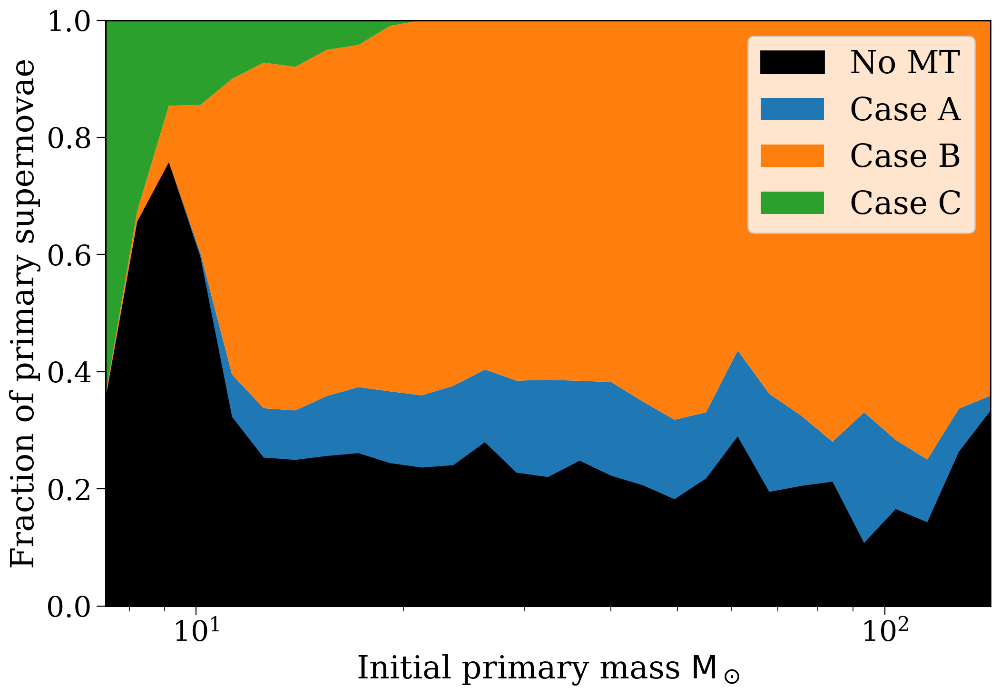

In [595]:
start = p.bpp.drop_duplicates(subset='bin_num', keep='first').loc[p.sn_1[p.sn_1].index]
mt = mt_1_type.loc[p.sn_1[p.sn_1].index]
mt_cols = np.array([f"C{int(i - 1)}" if i > 0 else "black" for i in mt])

bins = np.geomspace(7, 150, 30)
bin_centres = bins[:-1] + (bins[1:] - bins[:-1]) / 2

hs = np.array([np.histogram(start["mass_1"][mt == i], bins=bins)[0] for i in range(4)])
norm_hs = hs / hs.sum(axis=0)
cn_hs = np.cumsum(norm_hs, axis=0)

fig, ax = plt.subplots()

ax.fill_between(bin_centres, 0, cn_hs[0], color="black", label="No MT")
for i in range(1, len(cn_hs)):
    ax.fill_between(bin_centres, cn_hs[i - 1], cn_hs[i], label=f"Case {chr(ord('A') + i - 1)}")
ax.set(xlim=(bin_centres[0], bin_centres[-1]), ylim=(0, 1), xscale="log", xlabel=r"Initial primary mass $\rm M_\odot$", ylabel="Fraction of primary supernovae")
ax.legend()

# ax.axvline(12, color="white")

plt.savefig("../plots/mt_type_by_mass.pdf", format="pdf", bbox_inches="tight")

plt.show()

In [ ]:
p.

In [66]:
sn_times_1

80         21.247989
81          9.900690
82          6.844789
86         40.274446
89          6.478879
             ...    
776958     33.879018
776959    130.457643
776964     11.263496
776965      4.717279
776966      4.486077
Name: tphys, Length: 23939, dtype: float64

In [65]:
t_MS(12, 0.02)

17.74333693137621

## Exploring

In [52]:
sn_time_1 = p.bpp["tphys"][(p.bpp["evol_type"] == 15) & (~p.bpp["bin_num"].isin(p.duplicate_sn))]
sn_time_2 = p.bpp["tphys"][(p.bpp["evol_type"] == 16) & (~p.bpp["bin_num"].isin(p.duplicate_sn))]

In [214]:
start["mass_1"].min()

6.077120970244477

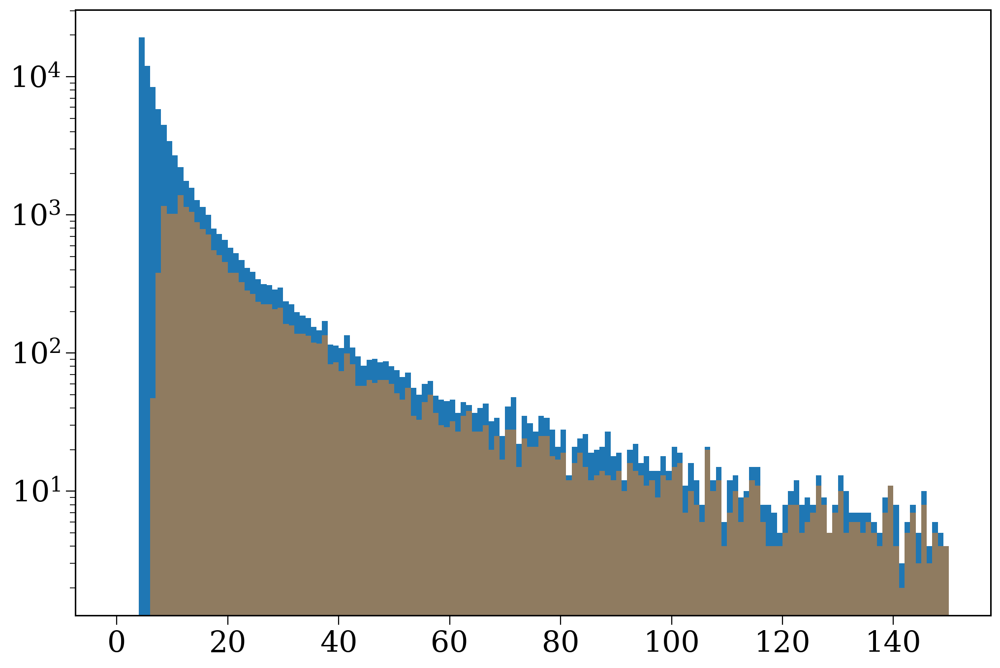

In [219]:
plt.hist(p.initC["mass_1"], bins=np.linspace(0, 150, 151))
plt.hist(start["mass_1"], bins=np.linspace(0, 150, 151), alpha=0.5)
plt.yscale("log")
plt.show()

In [246]:
experienced_mt_nums = p.bpp[p.bpp["evol_type"] == 3]["bin_num"].unique()

In [268]:
experienced_mt = np.isin(p.sn_1.index, experienced_mt_nums)

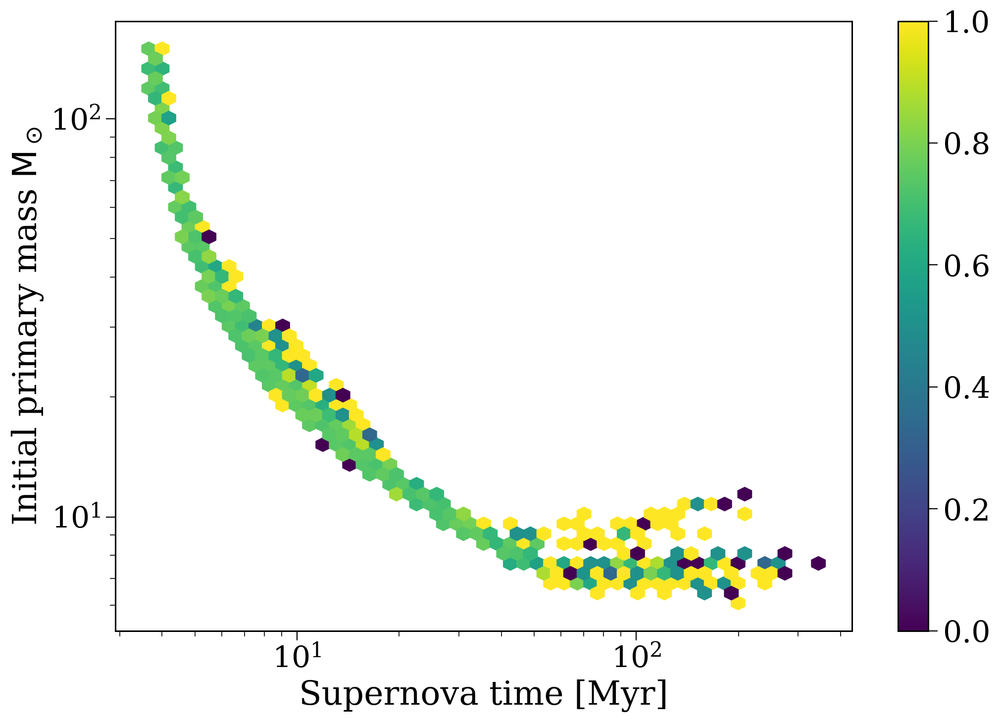

In [269]:
fig, ax = plt.subplots()

start = p.bpp.drop_duplicates(subset='bin_num', keep='first').loc[p.sn_1[p.sn_1].index]
# hexbin = ax.hexbin(sn_time_1[p.sn_1], start["mass_1"], bins="log", xscale="log", yscale='log', gridsize=50, C=np.log10(start["porb"]))
hexbin = ax.hexbin(sn_time_1[p.sn_1], start["mass_1"], xscale="log", yscale='log', gridsize=50, C=experienced_mt)
fig.colorbar(hexbin)

ax.set(xlabel="Supernova time [Myr]", ylabel=r"Initial primary mass $\rm M_\odot$")

plt.show()

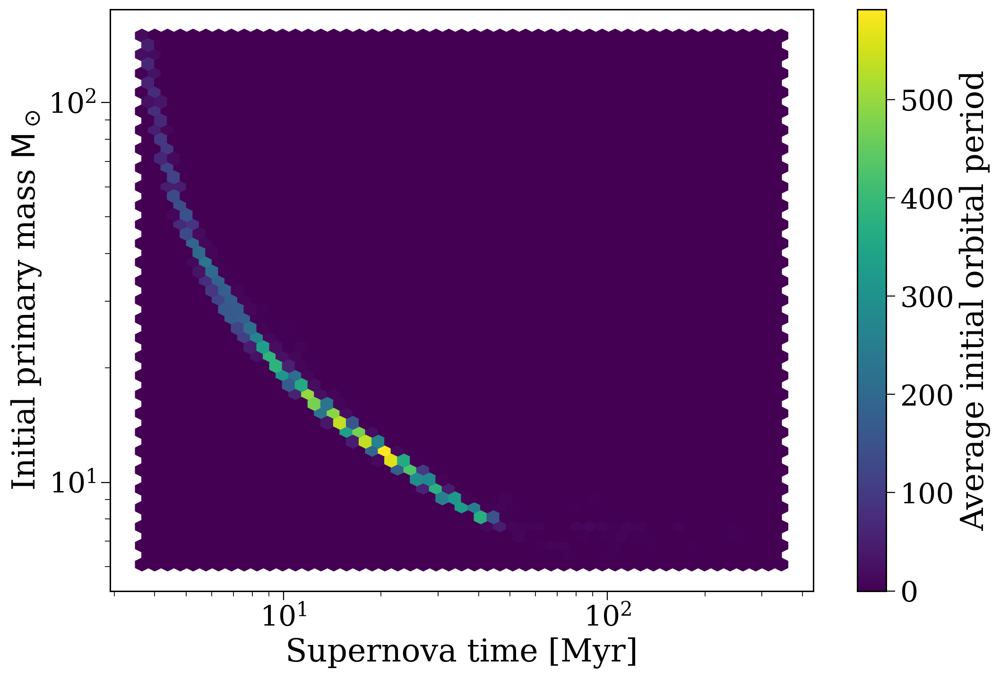

In [299]:
fig, ax = plt.subplots()

start = p.bpp.drop_duplicates(subset='bin_num', keep='first').loc[p.sn_1[p.sn_1].index]
hexbin = ax.hexbin(sn_time_1[p.sn_1], start["mass_1"], xscale="log", yscale='log', gridsize=50)#, C=np.log10(start["porb"]))
# hexbin = ax.hexbin(sn_time_1[p.sn_1], start["mass_1"], xscale="log", yscale='log', gridsize=50, C=experienced_mt)
fig.colorbar(hexbin, label="Average initial orbital period")

ax.set(xlabel="Supernova time [Myr]", ylabel=r"Initial primary mass $\rm M_\odot$")

plt.show()

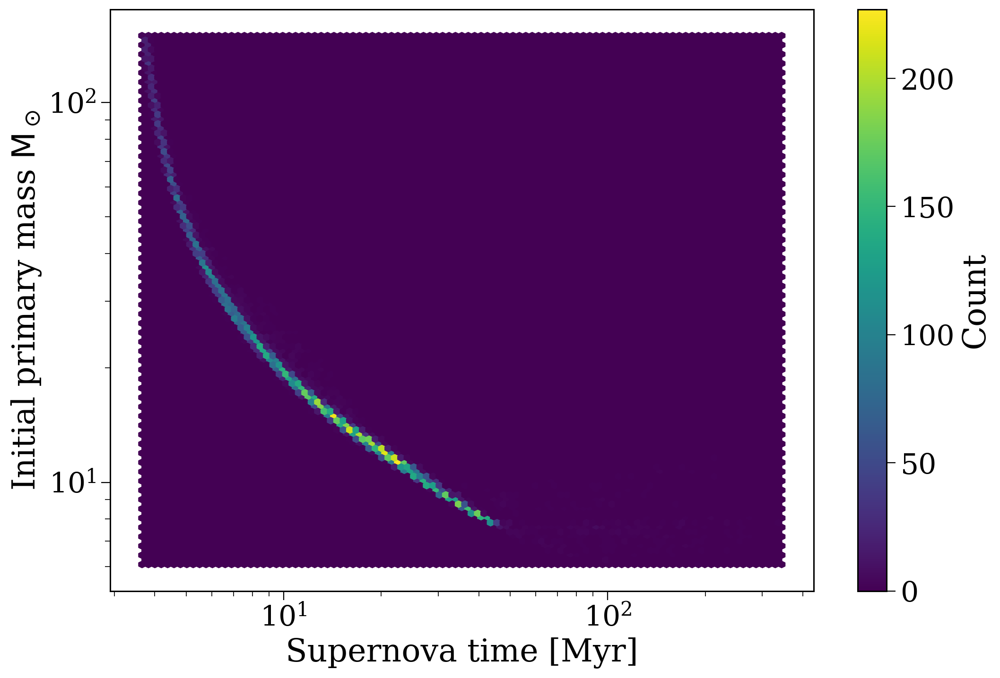

In [305]:
fig, ax = plt.subplots()

start = p.bpp.drop_duplicates(subset='bin_num', keep='first').loc[p.sn_1[p.sn_1].index]
hexbin = ax.hexbin(sn_time_1[p.sn_1], start["mass_1"], xscale="log", yscale='log', gridsize=100)#, C=np.log10(start["porb"]))
# hexbin = ax.hexbin(sn_time_1[p.sn_1], start["mass_1"], xscale="log", yscale='log', gridsize=50, C=experienced_mt)
fig.colorbar(hexbin, label="Count")

ax.set(xlabel="Supernova time [Myr]", ylabel=r"Initial primary mass $\rm M_\odot$")

plt.show()

In [271]:
start["mass_1"][p.sn_1 & ~experienced_mt].min()

7.024426944075158

In [278]:
from importlib import reload
reload(plotting)

<module 'plotting' from '/mnt/home/twagg/supernova-feedback/notebooks/../src/plotting.py'>

In [589]:
p.initC["gamma"]

80       -2.0
81       -2.0
82       -2.0
83       -2.0
84       -2.0
         ... 
776962   -2.0
776963   -2.0
776964   -2.0
776965   -2.0
776966   -2.0
Name: gamma, Length: 75970, dtype: float64

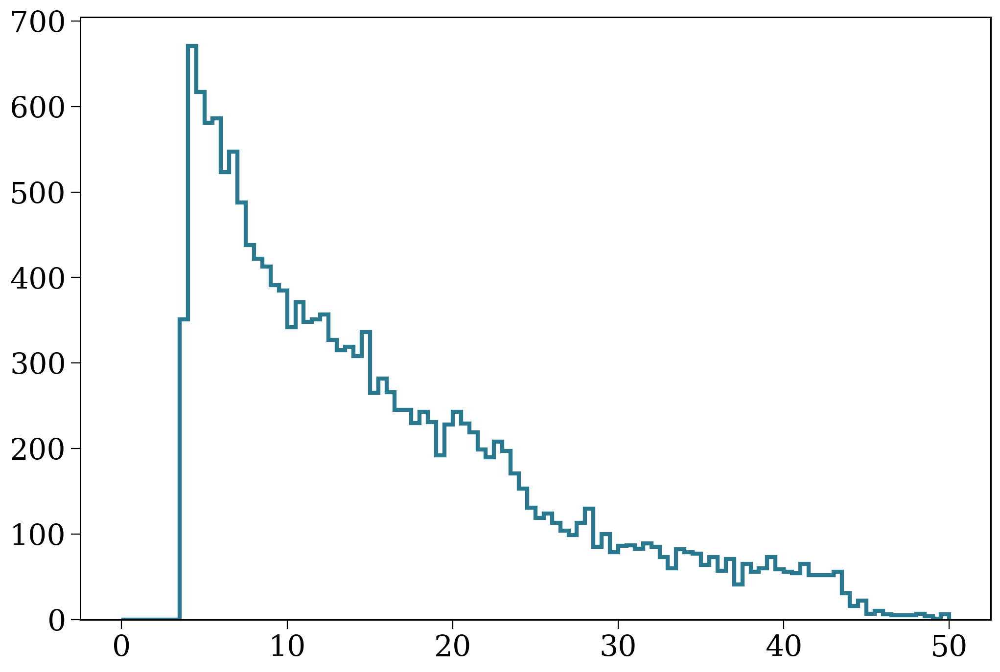

In [294]:
plt.hist(sn_time_1[p.sn_1], bins=100, range=(0, 50), histtype="step", color=plotting.colours[2], lw=3);
# plt.hist(sn_time_2[p.sn_2], bins="fd", range=(0, 50), histtype="step", color=plotting.colours[1], lw=3);
# plt.hist(np.concatenate((sn_time_1[p.sn_1_merger],
#                          sn_time_2[p.sn_2_merger])),
#          bins="fd", range=(0, 50), histtype="step", color=plotting.colours[0], lw=3);
# plt.xlabel("Time of supernova [Myr]")

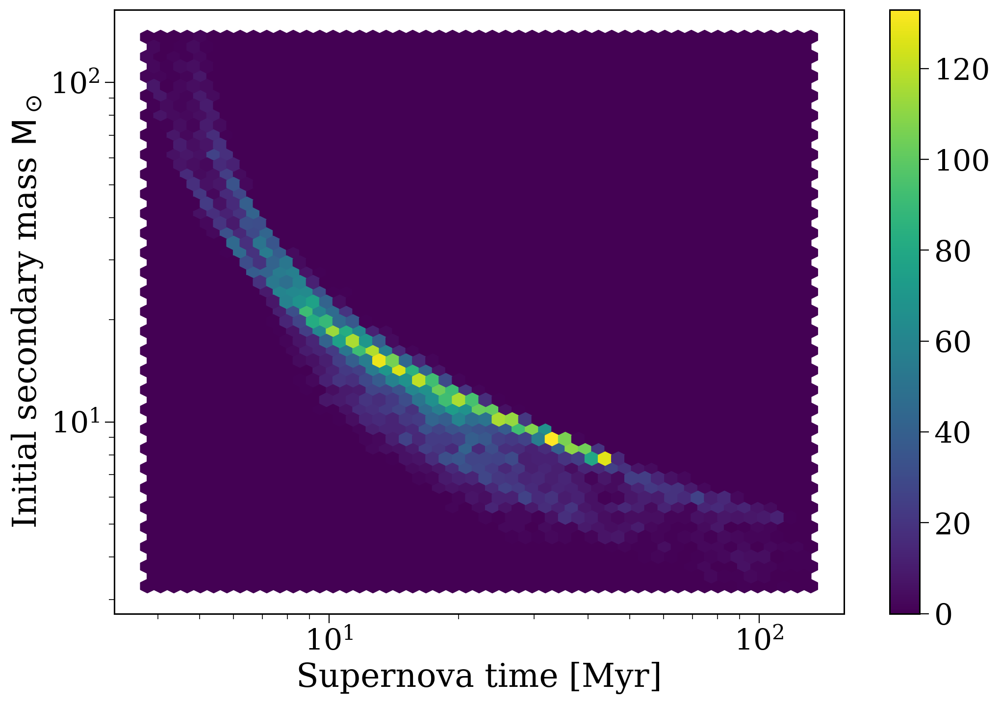

In [254]:
fig, ax = plt.subplots()

start = p.bpp.drop_duplicates(subset='bin_num', keep='first').loc[p.sn_2[p.sn_2].index]
# hexbin = ax.hexbin(sn_time_1[p.sn_1], start["mass_1"], bins="log", xscale="log", yscale='log', gridsize=50, C=np.log10(start["porb"]))
hexbin = ax.hexbin(sn_time_2[p.sn_2], start["mass_2"], xscale="log", yscale='log', gridsize=50)
fig.colorbar(hexbin)

ax.set(xlabel="Supernova time [Myr]", ylabel=r"Initial secondary mass $\rm M_\odot$")

plt.show()

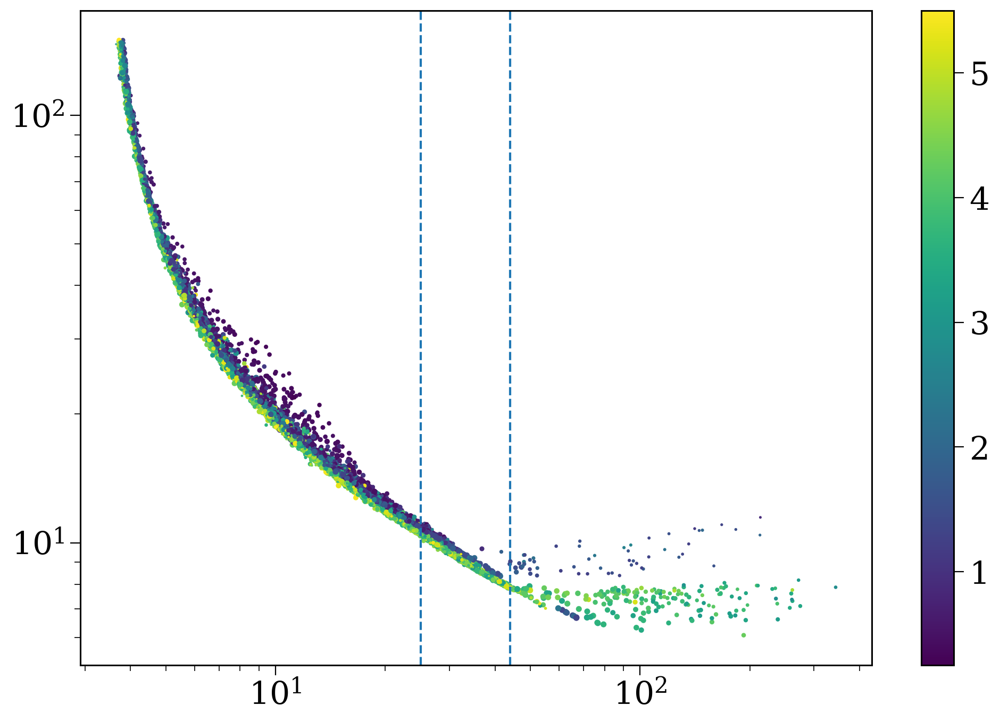

In [236]:
fig, ax = plt.subplots()

start = p.bpp.drop_duplicates(subset='bin_num', keep='first').loc[p.sn_1[p.sn_1].index]

# ax.scatter(start["mass_1"], sn_time_1[p.sn_1], c=np.log10(start["sep"] * (1 - start["ecc"])))
scatter = ax.scatter(sn_time_1[p.sn_1], start["mass_1"], s=(start['mass_2']/start['mass_1'])**2 * 10, c=np.log10(start["porb"]))
fig.colorbar(scatter)

for x in [25, 44]:
    ax.axvline(x, linestyle='--')

ax.set(xscale="log", yscale="log")

plt.show()

# Plotly data

In [469]:
sn_dists = plotting.get_data_and_weights(p, "distance")[0]
sn_times = plotting.get_data_and_weights(p, "time", [1])[0]

In [497]:
fid_data = {
    "dist": np.concatenate(sn_dists),
    "time": np.concatenate(sn_times),
    "type": np.concatenate([[i] * len(sn_dists[i]) for i, label in zip(range(len(sn_dists)), plotting.labels)])
}

In [481]:
pd.DataFrame(fid_data).to_hdf("dists_times.h5", key="fiducial")

In [498]:
fid_data["type"]

array([0, 0, 0, ..., 3, 3, 3])

In [499]:
with h5.File("dists_times.h5", "w") as f:
    g = f.create_group("fiducial")
    g.create_dataset("dist", data=fid_data["dist"])
    g.create_dataset("time", data=fid_data["time"])
    g.create_dataset("type", data=fid_data["type"])

In [490]:
pd.read_hdf("dists_times.h5", key="fiducial")

,dist,time,type
0,3.923895,5.002936,Merger Product
1,62.878171,49.670533,Merger Product
2,16.753811,6.522662,Merger Product
3,10.437509,11.456510,Merger Product
4,65.745107,221.137362,Merger Product
...,...,...,...
51822,4.631329,4.656781,Effectively Single
51823,8.469214,4.656783,Effectively Single
51824,21.283588,17.697613,Effectively Single
51825,4.053506,4.138112,Effectively Single


In [ ]:
np.

(1.0, 0.8431372549019608, 0.0)

<function matplotlib.colors.to_hex(c, keep_alpha=False)>

In [488]:
[mpl.colors.rgb2hex(mpl.colors.to_rgb(c)) for c in plotting.colours]

['#ffd700', '#44bf70', '#2a788e', '#87ceeb']

In [471]:
len(sn_dists[0])

21970